## M1 [KTL]: REFIT House 2 to REFIT House 2

### Reference paper:
 * A. M. A. Ahmed, Y. Zhang and F. Eliassen, "Generative Adversarial Networks and Transfer Learning for Non-Intrusive Load Monitoring in Smart Grids," 2020 IEEE International Conference on Communications, Control, and Computing Technologies for Smart Grids (SmartGridComm), Tempe, AZ, USA, 2020, pp. 1-7, doi: 10.1109/SmartGridComm47815.2020.9302933.

### Importing packages

In [1]:
import os
import numpy as np
import math

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler as standarize_data
from sklearn.preprocessing import MinMaxScaler as scale_data
from sklearn.utils import shuffle

plt.style.use('bmh')


### parameters and configuration

In [2]:
lr=0.00001 #0.00002   0.000001
b1=0.5
b2=0.999
n_epochs=100
batch_size=512
s=2
sample_interval=500

cuda = True if torch.cuda.is_available() else False

FloatTensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

cuda



True

## loading, downsampling and scaling data

In [3]:
import pandas as pd
def dataProvider(train, windowsize):
    
    data_frame = pd.read_csv(train,
                             #chunksize=10 ** 3,
                             header=0
                             )
    np_array = np.array(data_frame)
    X_to_disaggregate, Y_true = np_array[:, 0], np_array[:, 1]
    agg_len=X_to_disaggregate.shape[0]
    offset = int(0.5 * (windowsize - 1.0))
    window_num=X_to_disaggregate.size - 2 * offset
    print("window_num is: ",window_num)
    w=windowsize
    step=int(9)
#     agg_segments=np.zeros((1,w))
#     app_segments=np.zeros((1,w))
    agg_segments=list()
    app_segments=list()
    i=0
    while i<=agg_len-w:
        agg_segment=X_to_disaggregate[i:i+w]
        app_segment=Y_true[i:i+w]
        agg_segments.append(agg_segment)
        app_segments.append(app_segment)
        i+=step

    agg_segments=np.array(agg_segments)  
    app_segments=np.array(app_segments)
    return agg_segments, app_segments


In [4]:
trainfile1 ="/home/ec2-user/SageMaker/UKDALE/microwave_house_1_training_.csv"
trainfile2 ="/home/ec2-user/SageMaker/UKDALE/microwave_house_2_training_.csv"
X1,Y1=dataProvider(trainfile1,19)
print(X1.shape)
X2,Y2=dataProvider(trainfile2,19)
print(X2.shape)
X=np.concatenate((X1,X2),axis=0)
Y=np.concatenate((Y1,Y2),axis=0)
print(X.shape)
print(Y.shape)

window_num is:  16691363
(1854596, 19)
window_num is:  1293544
(143728, 19)
(1998324, 19)
(1998324, 19)


In [5]:
# loading the signature and aggregate measurement

# # apply a threshold of 50
# X_train[X_train<=50] = 0
# Y_train[Y_train<=50] = 0
n_train=int(0.8*len(X))
X_train=X[:n_train]
X_test=X[n_train:]
Y_train = Y[:n_train]
Y_test= Y[n_train:]
# Scaling data
scale_agg=scale_data()
scale_app=scale_data()

scale_agg_test=scale_data()
scale_app_test=scale_data()

scale_agg.fit(X_train)
scale_app.fit(Y_train)

# Transforming trainig data

X_train_n=scale_agg.transform(X_train)
Y_train_n=scale_app.transform(Y_train)

X_train_n.shape

(1598659, 19)

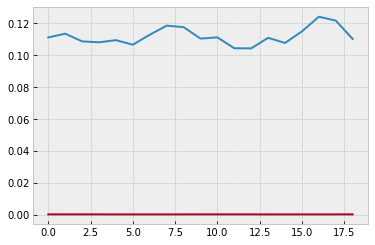

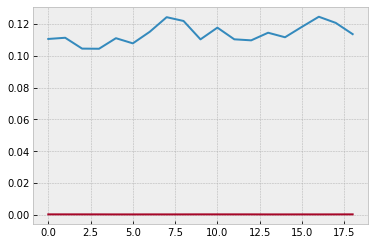

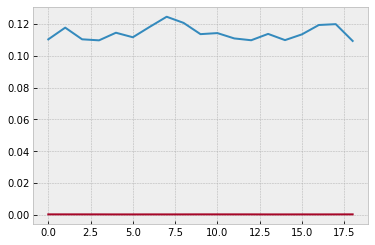

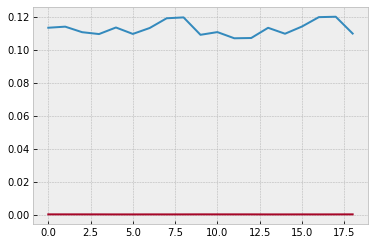

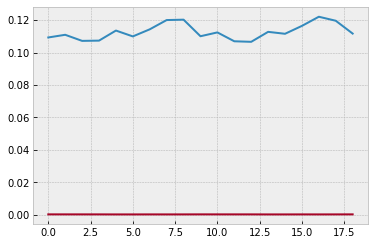

...

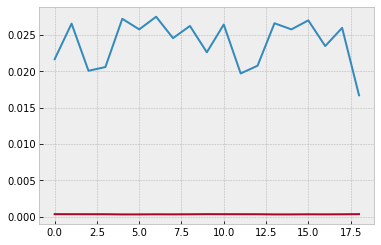

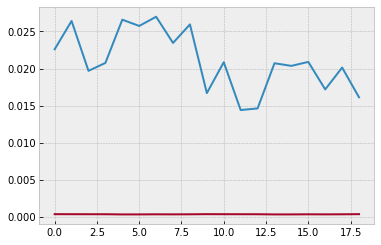

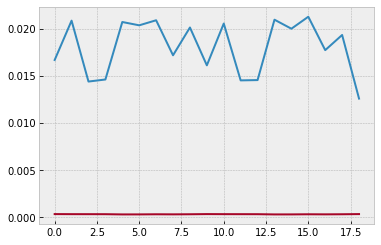

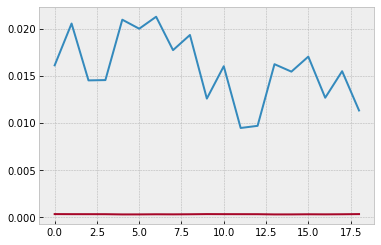

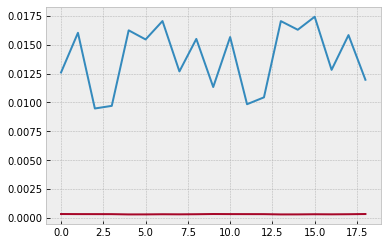

(1598659, 19)

In [6]:
# Uncomment those lines to plot some examples
for i in range(50):
    plt.plot(X_train_n[i,:])
    plt.plot(Y_train_n[i,:])
    plt.show()
X_train.shape

## GANNILM Classes

In [7]:
sig_len=19
class Swish(torch.nn.Module):
    def forward(self,x):
        return x * torch.sigmoid(x)


class Flatten(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size, -1)

    
class Projection(torch.nn.Module):
    def forward(self, x):
        batch_size = x.shape[0]
        return x.view(batch_size,projection,-1) #bsize, projection,length


    
class Generator(nn.Module):
    def __init__(self):
        super().__init__()


        def block(in_feat, out_feat, normalize=False):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.9))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        def conv(in_feat, out_feat, filter_size=5, stride=1,padding=True):
            if padding==True: 
                p=int((filter_size-1)/2)
            else:
                p=0
            conv_layers = [nn.Conv1d(in_feat, out_feat,filter_size,stride,padding=p)]
            conv_layers.append(nn.LeakyReLU(0.2, inplace=True))
            return conv_layers

        def flat():
            flatten=Flatten()
            layers = [flatten]
            #layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers
        
        def swish():
            s=Swish()
            layers = [s]
            return layers
        
        def project():
            project_layer=Projection()
            layers = [project_layer]
            return layers
        
        
        f=8#output featrue maps
        
        self.g1 = nn.Sequential(
            *conv(in_feat=1,out_feat=f*2,filter_size=5,stride=1,padding=True),
            

        )
        
        self.g2 = nn.Sequential(
            *conv(in_feat=f*2,out_feat=f*3,filter_size=5,stride=1,padding=True),
            *flat(),
        )
        
        self.g3 = nn.Sequential(
            *block(sig_len*f*3, int(sig_len*f*4), normalize=False),

        )
        
        
        self.g4 = nn.Sequential(
            *block(int(sig_len*f*4), int(sig_len*f*6)),

        )
        
        
        
        
        self.g5 = nn.Sequential(
            
            *block(int(sig_len*f*6), int(sig_len*f*4)),

        )
        
         
        self.g6 = nn.Sequential(
            
            *block(int(sig_len*f*4), int(sig_len*f*3)),

        )
        
        self.g7 = nn.Sequential(
            
            nn.Linear(int(sig_len*f*3), int(np.prod(sig_len))),
            nn.LeakyReLU(0.01, inplace=True) #tanh
        )

    #def forward(self, noise, labels):
    def forward(self,aggregate):
        X = self.g1(aggregate)
        X = self.g2(X)
        X = self.g3(X)
        X = self.g4(X)
        X = self.g5(X)
        X = self.g6(X)
        appliance = self.g7(X)
        return appliance

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()


        d=4
        
        def conv(in_feat, out_feat, filter_size=5, stride=1,padding=True):
            if padding==True: 
                p=int((filter_size-1)/2)
            else:
                p=0
            conv_layers = [nn.Conv1d(in_feat, out_feat,filter_size,stride,padding=p)]
            conv_layers.append(nn.LeakyReLU(0.2, inplace=True))
            return conv_layers
        
        def flat():
            flatten=Flatten()
            layers = [flatten]
            return layers
        
        self.d1 = nn.Sequential(
            nn.Linear(int(sig_len*2), sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
            
            
        )
        
        self.d2 = nn.Sequential(
            nn.Linear(sig_len*d, sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
 
            
        )
        
        self.d3 = nn.Sequential(
            
            nn.Linear(sig_len*d, sig_len*d),
            nn.LeakyReLU(0.2, inplace=True),
            
            
        )
        
        self.d4 = nn.Sequential(

            nn.Linear(sig_len*d, sig_len*2),
            nn.LeakyReLU(0.2, inplace=True),
            
        )
        
        
        self.d5 = nn.Sequential(
            
            nn.Linear(sig_len*2, 1),
            nn.Sigmoid(),

        )
        
        

    def forward(self, d_input):
        X=self.d1(d_input)
        X=self.d2(X)
        X=self.d3(X)
        features=self.d4(X)
        validity = self.d5(features)
        
        return validity,features


In [9]:
class DataIterator(Dataset):
    def __init__(self):

        self.len=X_train_n.shape[0]
        self.xdata=torch.from_numpy(X_train_n)
        self.ydata=torch.from_numpy(Y_train_n)
        
    def __getitem__(self,index):
        return (self.xdata[index],self.ydata[index])
    
    def __len__(self):
        return(self.len)


## Loss Definition and instantiation

In [10]:
feature_loss=torch.nn.MSELoss()
# adversarial_loss = torch.nn.MSELoss()
adversarial_loss = torch.nn.BCELoss()

# Initialize generator and discriminator
generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()



## Loading Model

In [11]:
#uncomment those lines when loading a trained model
# PATH="gannilm_refit.pth"
# # PATH="gannilm_UKDALE.pth"
# checkpoint = torch.load(PATH)
# # generator.load_state_dict(checkpoint['g_state_dict'],strict=True)
# # discriminator.load_state_dict(checkpoint['d_state_dict'],strict=True)

## Utility Functions

In [12]:

def smooth(y, box_pts=2):
#     print("smooth in",y.shape)
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
#     print("smooth out",y_smooth.shape)
    return y_smooth


def down_sample(X,Y,s):
    #X=X.reshape(X.shape[0],X.shape[1])
    Y=Y.reshape(Y.shape[0],Y.shape[1])
    Y_s=Y[:, ::s]
    X_s=X[:,::s]
    dim=X_s.shape[1]
    return(X_s,Y_s.reshape(-1,dim))


def sample_data(n_row, batches_done):

    
    a_to_s=X_train_n[0:10,:] # z
    agg_to_sample=a_to_s.reshape(a_to_s.shape[0],1,a_to_s.shape[1])
    
    true_app=Y_train_n[0:10,:]
 
    agg_to_sample = Variable(FloatTensor(agg_to_sample))
    gen_ds = generator(agg_to_sample)
    

    
    gen_ds_inv=scale_app.inverse_transform(gen_ds.cpu().detach())
    true_app_inv=scale_app.inverse_transform(true_app)
 
    
 

    plt.plot(smooth(gen_ds_inv[0,:]),label="GAN")
    plt.plot(true_app_inv[0,:],label="Real")
    plt.legend()
    plt.show()

    plt.plot(smooth(gen_ds_inv[5,:]),label="GAN")
    plt.plot(true_app_inv[5,:],label="real")
    plt.legend()
    plt.show()


    
    

def disaggregate(x):
    x = Variable(FloatTensor(x))
    gen_appliance = generator(x)
    return (gen_appliance)

def confidence(appliance,aggregate):
    agg=Variable(FloatTensor(aggregate))
    d_in=torch.cat((appliance,agg),1)
    conf,_=discriminator(d_in)
    return(conf)


   
def classification_metrics(pred1, real_measurements1,thresh):
#    real_measurements
#    pred=predictions
    
    pred=np.copy(pred1)
    real_measurements=np.copy(real_measurements1)
    on_threshold=thresh
    pred[pred <=on_threshold] = 0
    pred[pred >on_threshold] = 1
    
    
    real_measurements[real_measurements <=on_threshold] = 0
    real_measurements[real_measurements >on_threshold] = 1

    TP=np.sum(np.logical_and(pred == 1, real_measurements == 1))
    FP=np.sum(np.logical_and(pred == 1, real_measurements == 0))

    FN=np.sum(np.logical_and(pred == 0, real_measurements == 1))
    TN=np.sum(np.logical_and(pred == 0, real_measurements == 0))
    P=sum(real_measurements)
    N=len(real_measurements)-sum(real_measurements)
    
    recall=TP/(TP+FN)
    precision=TP/(TP+FP)
    F1=2*(precision*recall)/(precision+recall)
    accuracy=(TP+TN)/(P+N)
    
    return(recall,precision,F1,accuracy)
    
    
    

def energy_metrics(pred1, real_measurements1,thresh):
    
    
    pred=np.copy(pred1)
    real_measurements=np.copy(real_measurements1)
    on_threshold=thresh
    pred[pred <=on_threshold] = 0
    real_measurements[real_measurements <=on_threshold] = 0

    
    E=np.sum(real_measurements)
    E_hat=np.sum(pred)
    RE=(E_hat-E)/(max(E,E_hat))
#     RE=(E_hat-E)/(E)
    T=len(pred)
    MAE=(1/T)*sum(np.abs(pred-real_measurements))
    return(RE,MAE)

def get_mae(target, prediction):
    assert (target.shape == prediction.shape)

    return mean_absolute_error(target, prediction)

def get_sae(target, prediction):
    assert (target.shape == prediction.shape)

    r = target.sum()
    r0 = prediction.sum()
    sae = abs(r0 - r) / r
    return sae

def get_nde(target, prediction):
    assert (target.shape == prediction.shape)

    error, squarey = [], []
    for i in range(len(prediction)):
        value = prediction[i] - target[i]
        error.append(value * value)
        squarey.append(target[i] * target[i])
    nde = sqrt(sum(error) / sum(squarey))
    return nde






## TL configuring

Batch_no: 0  Epoch: 0


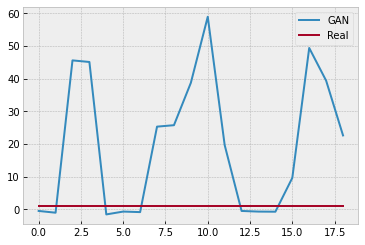

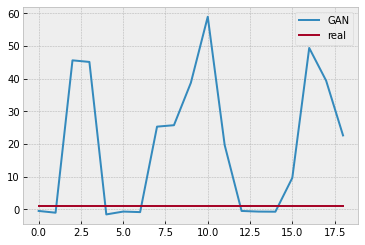

Batch_no: 500  Epoch: 0


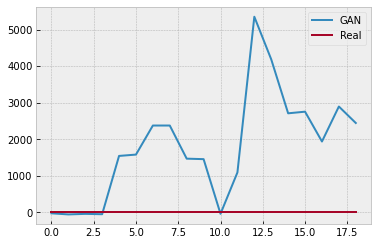

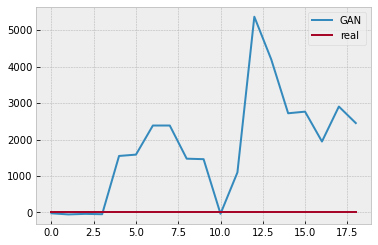

Batch_no: 1000  Epoch: 0


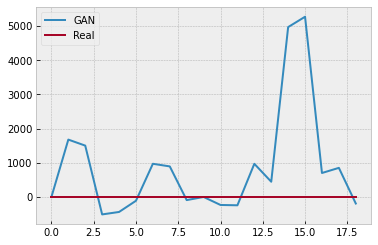

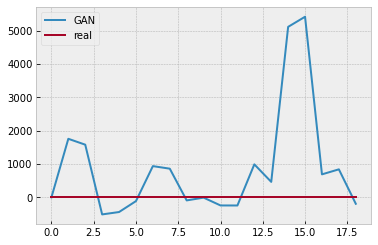

Batch_no: 1500  Epoch: 0


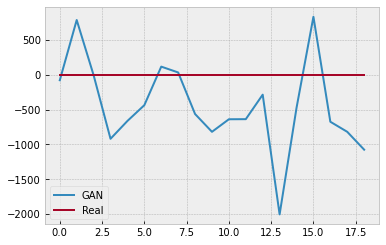

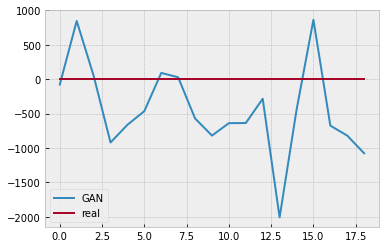

Batch_no: 2000  Epoch: 0


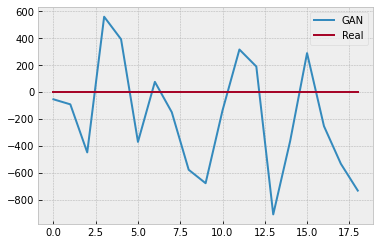

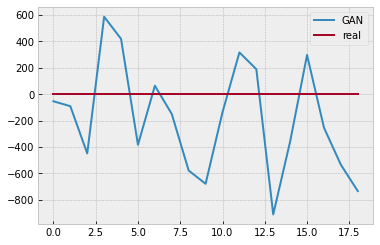

Batch_no: 2500  Epoch: 0


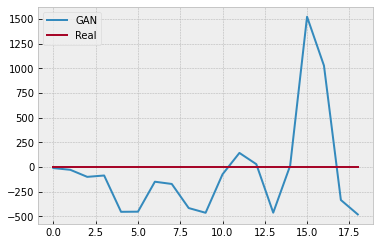

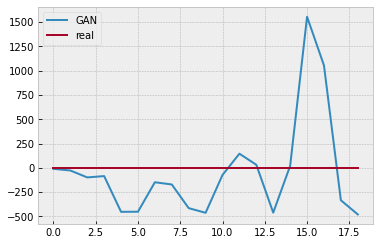

Batch_no: 3000  Epoch: 0


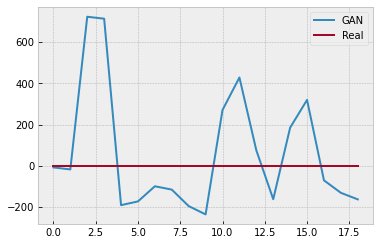

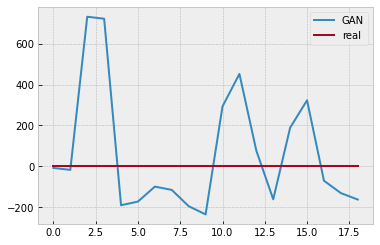

Batch_no: 3500  Epoch: 1


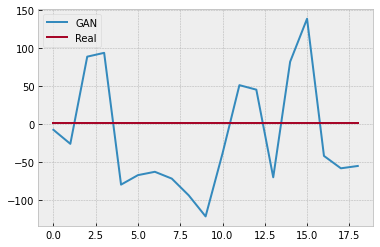

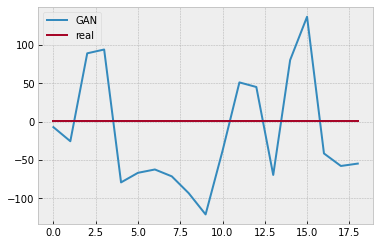

Batch_no: 4000  Epoch: 1


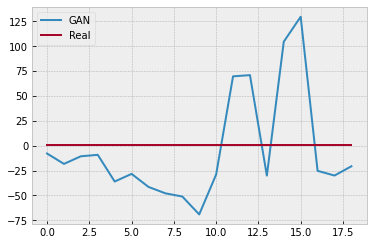

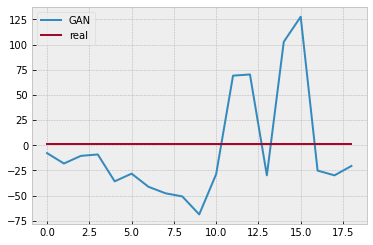

Batch_no: 4500  Epoch: 1


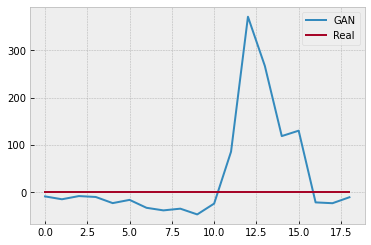

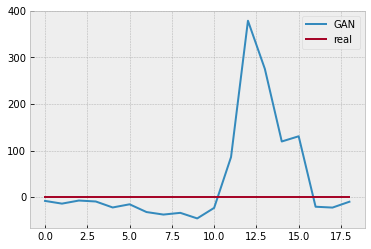

Batch_no: 5000  Epoch: 1


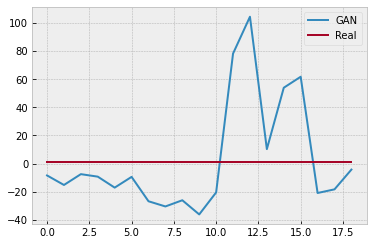

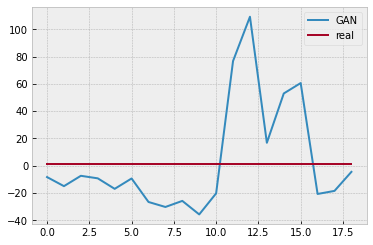

Batch_no: 5500  Epoch: 1


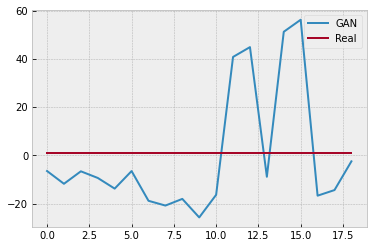

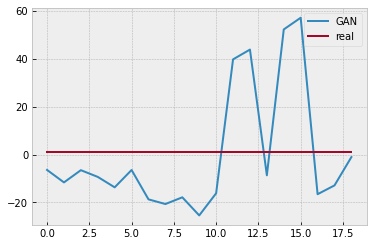

Batch_no: 6000  Epoch: 1


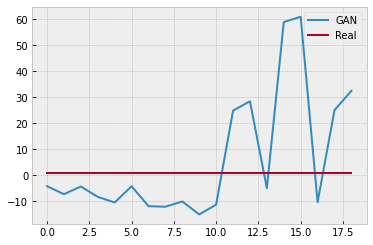

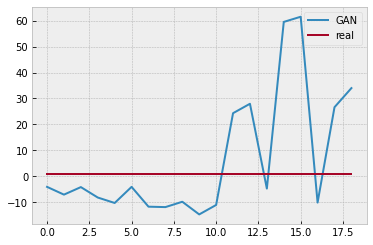

Batch_no: 6500  Epoch: 2


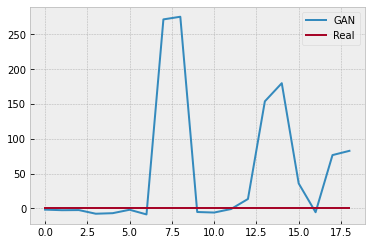

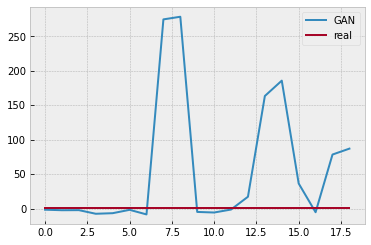

Batch_no: 7000  Epoch: 2


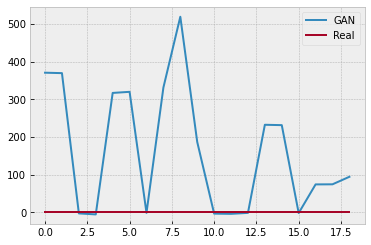

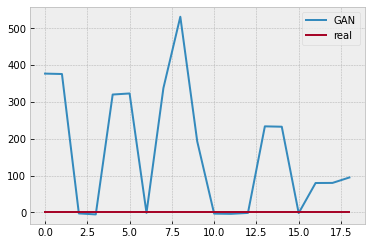

Batch_no: 7500  Epoch: 2


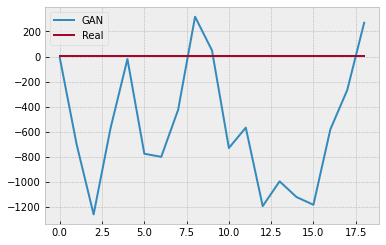

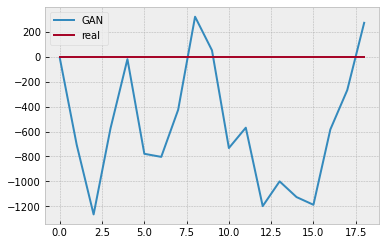

Batch_no: 8000  Epoch: 2


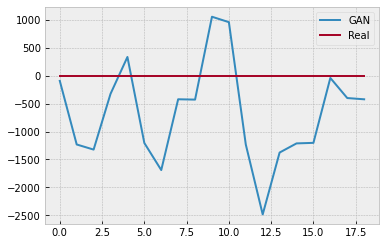

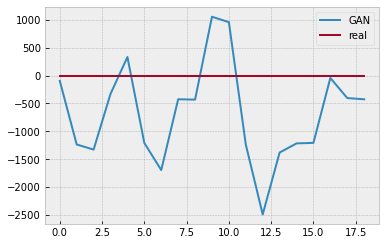

Batch_no: 8500  Epoch: 2


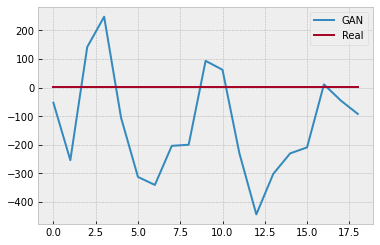

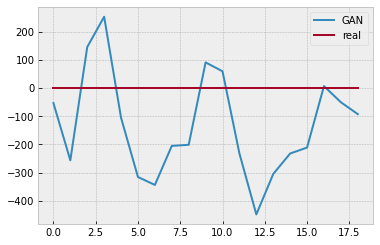

Batch_no: 9000  Epoch: 2


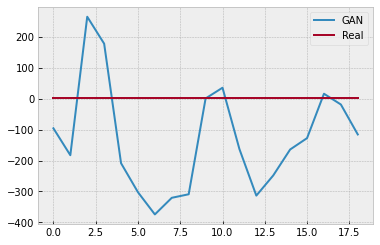

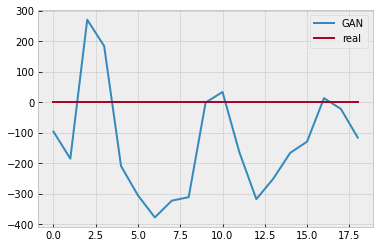

Batch_no: 9500  Epoch: 3


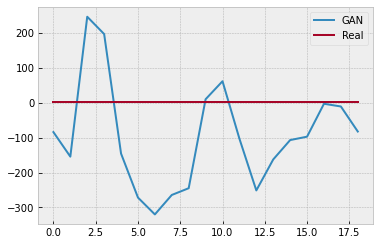

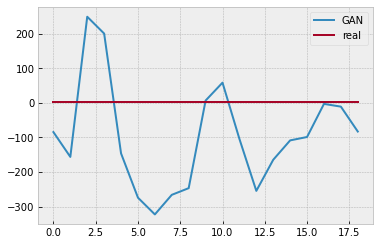

Batch_no: 10000  Epoch: 3


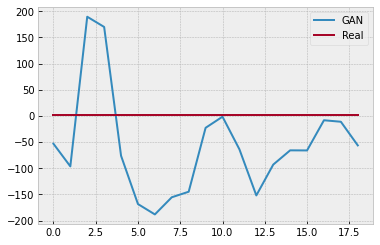

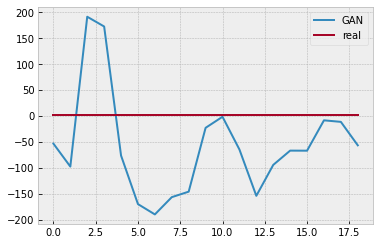

Batch_no: 10500  Epoch: 3


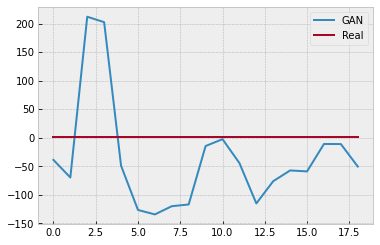

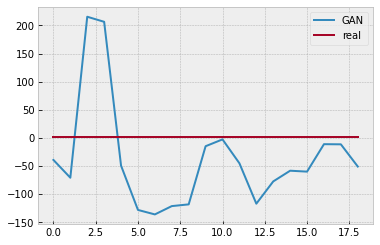

Batch_no: 11000  Epoch: 3


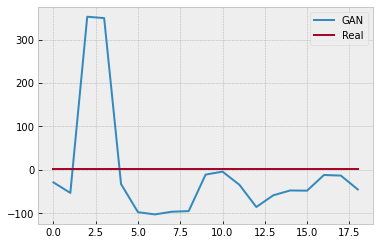

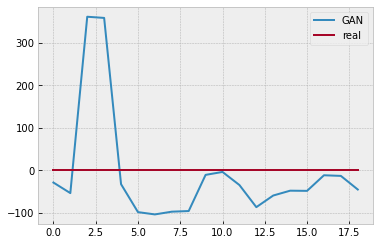

Batch_no: 11500  Epoch: 3


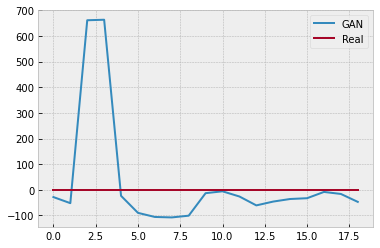

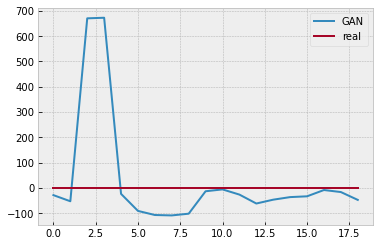

Batch_no: 12000  Epoch: 3


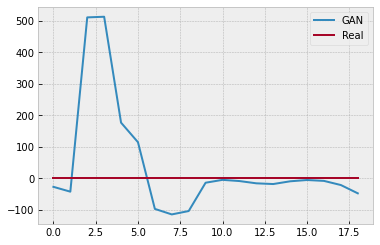

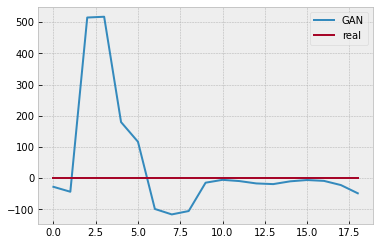

Batch_no: 12500  Epoch: 4


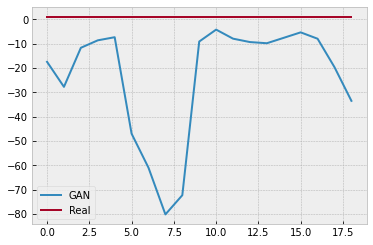

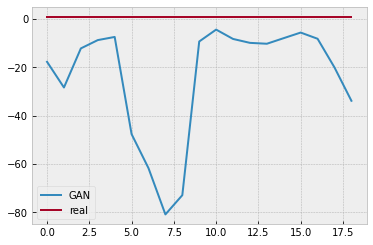

Batch_no: 13000  Epoch: 4


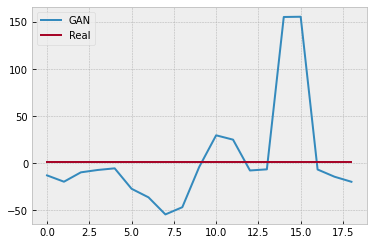

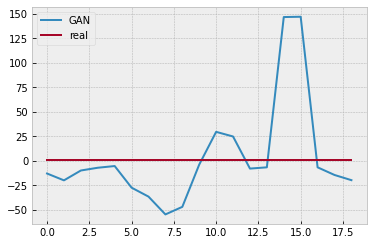

Batch_no: 13500  Epoch: 4


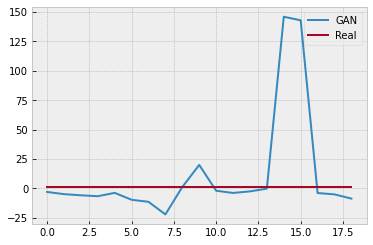

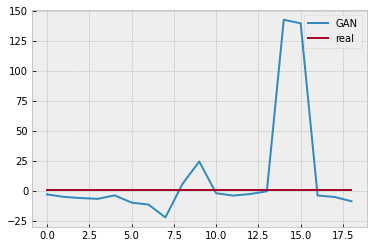

Batch_no: 14000  Epoch: 4


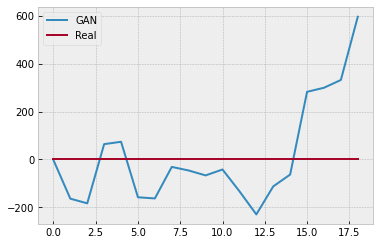

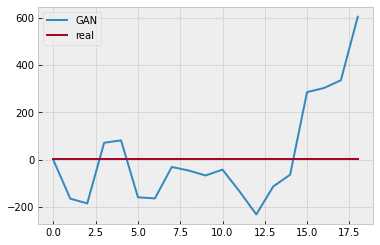

Batch_no: 14500  Epoch: 4


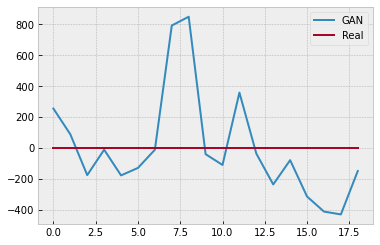

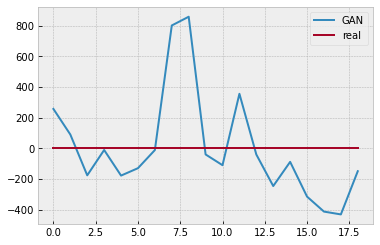

Batch_no: 15000  Epoch: 4


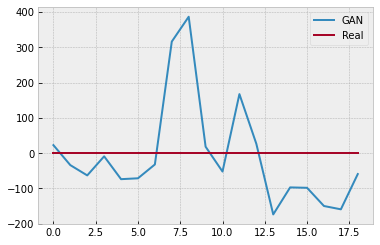

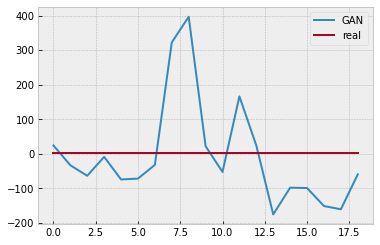

Batch_no: 15500  Epoch: 4


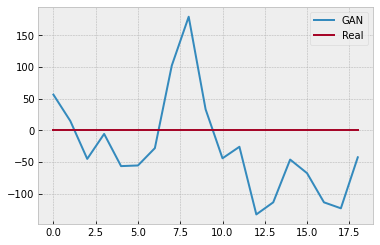

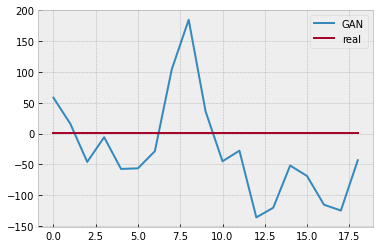

Batch_no: 16000  Epoch: 5


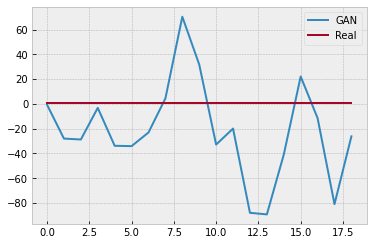

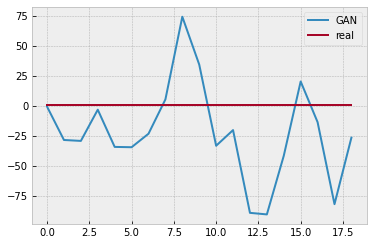

Batch_no: 16500  Epoch: 5


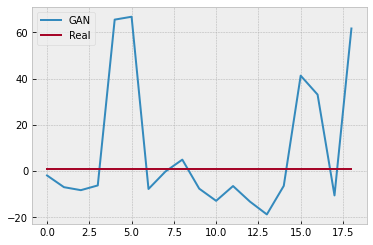

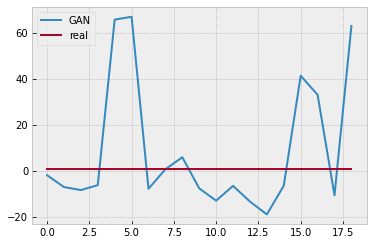

Batch_no: 17000  Epoch: 5


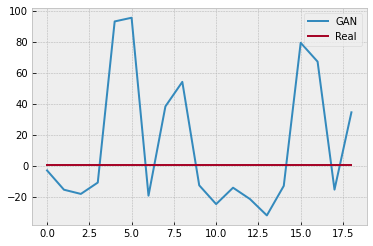

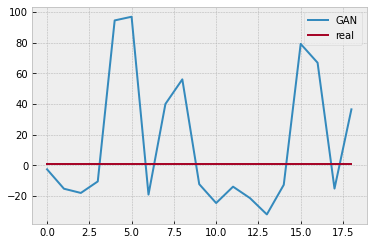

Batch_no: 17500  Epoch: 5


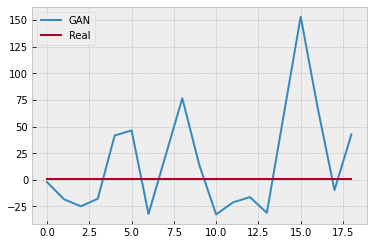

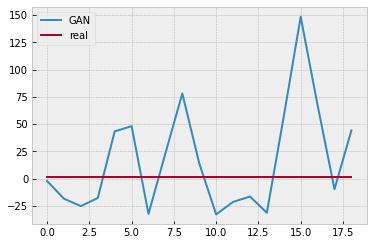

Batch_no: 18000  Epoch: 5


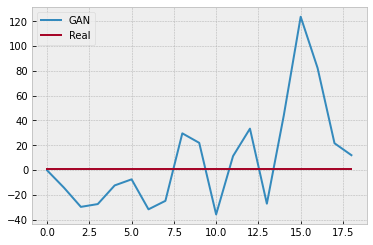

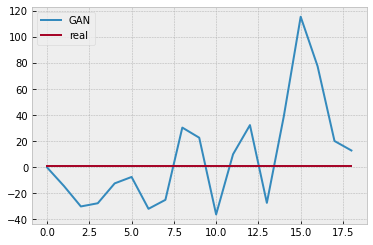

Batch_no: 18500  Epoch: 5


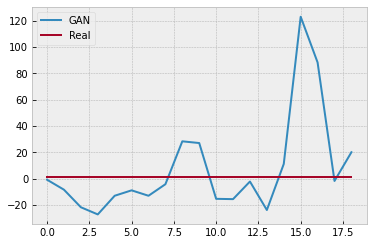

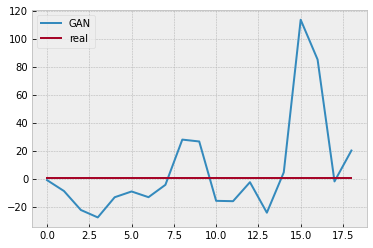

Batch_no: 19000  Epoch: 6


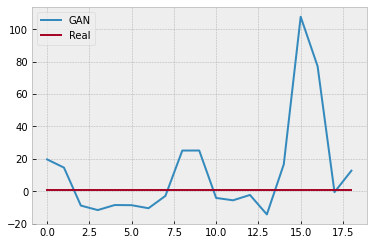

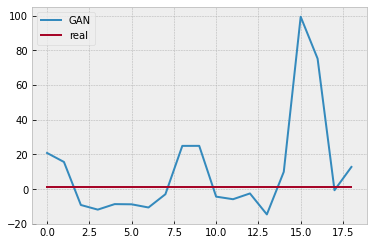

Batch_no: 19500  Epoch: 6


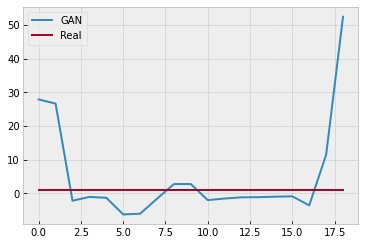

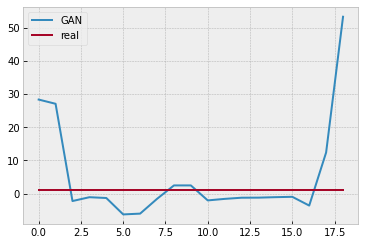

Batch_no: 20000  Epoch: 6


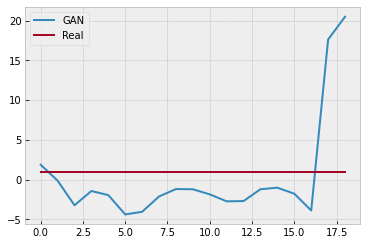

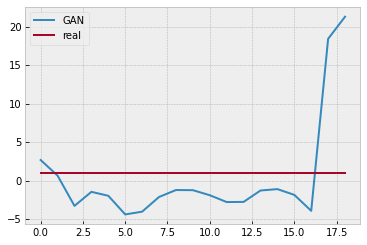

Batch_no: 20500  Epoch: 6


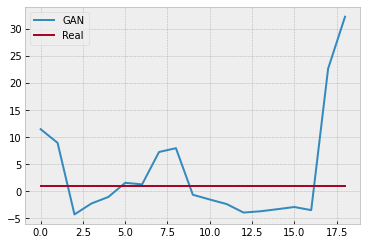

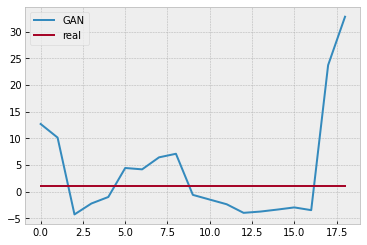

Batch_no: 21000  Epoch: 6


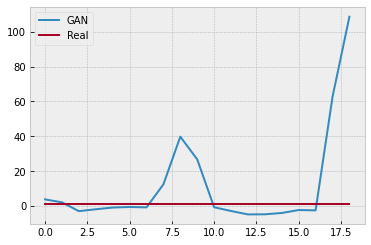

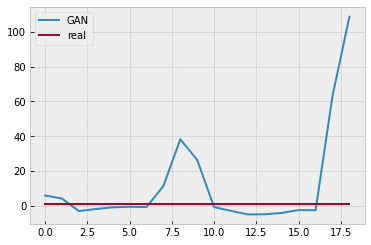

Batch_no: 21500  Epoch: 6


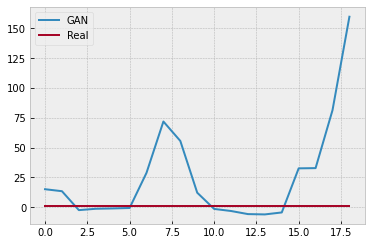

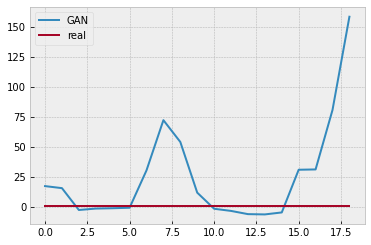

Batch_no: 22000  Epoch: 7


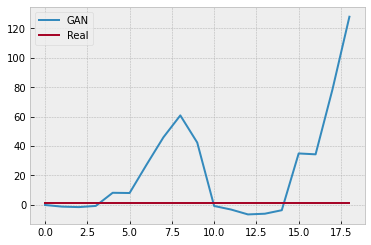

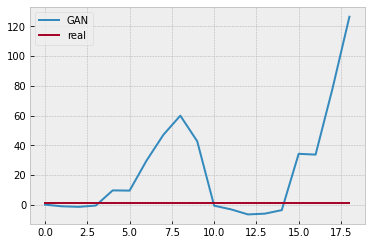

Batch_no: 22500  Epoch: 7


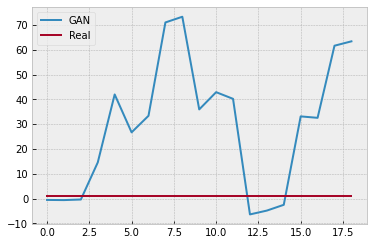

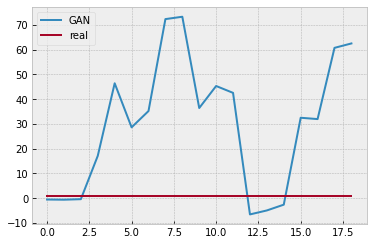

Batch_no: 23000  Epoch: 7


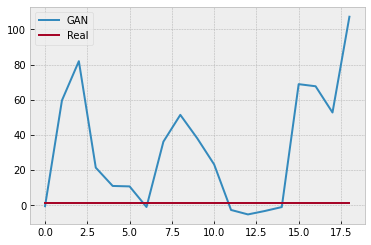

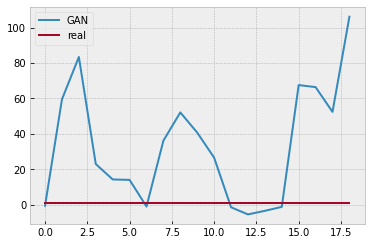

Batch_no: 23500  Epoch: 7


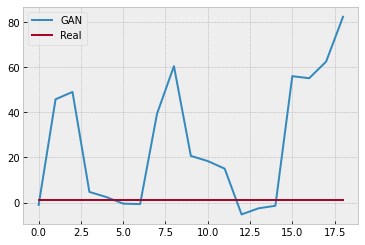

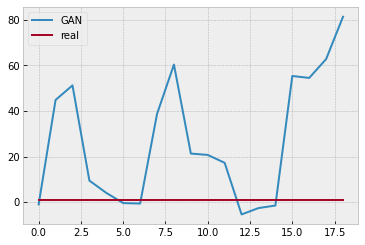

Batch_no: 24000  Epoch: 7


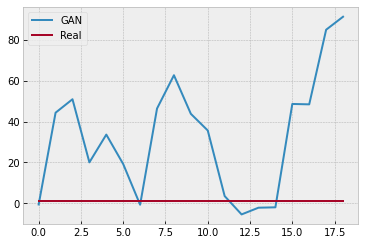

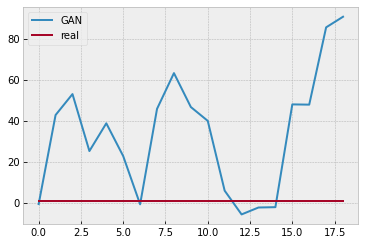

Batch_no: 24500  Epoch: 7


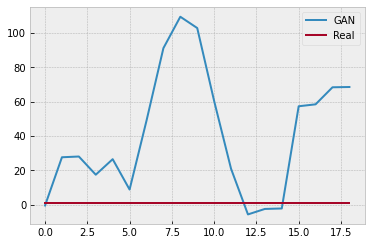

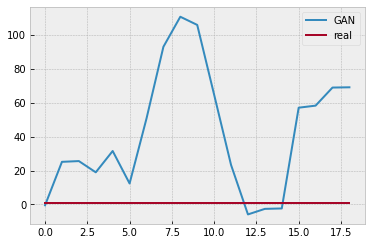

Batch_no: 25000  Epoch: 8


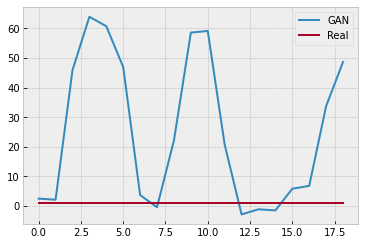

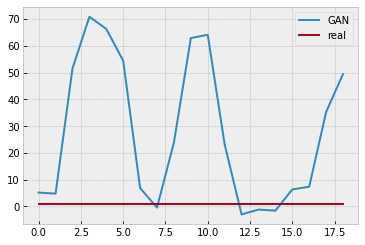

Batch_no: 25500  Epoch: 8


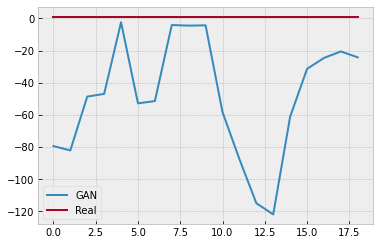

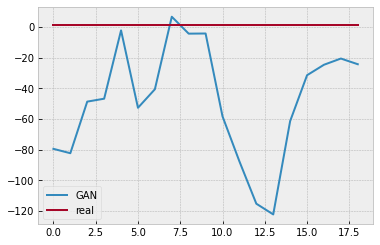

Batch_no: 26000  Epoch: 8


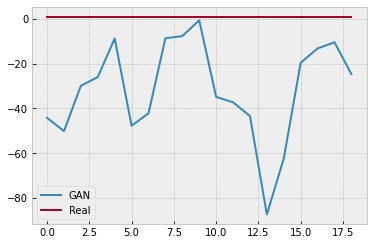

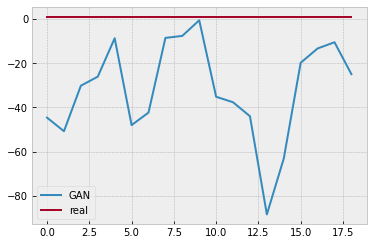

Batch_no: 26500  Epoch: 8


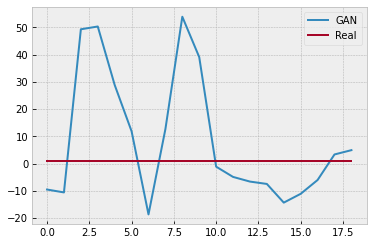

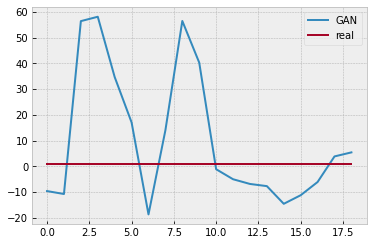

Batch_no: 27000  Epoch: 8


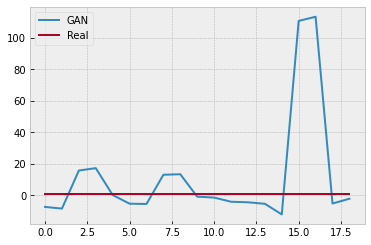

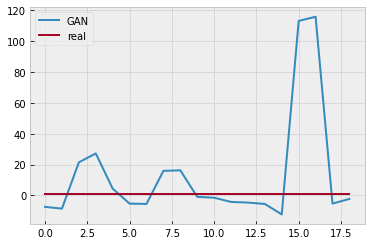

Batch_no: 27500  Epoch: 8


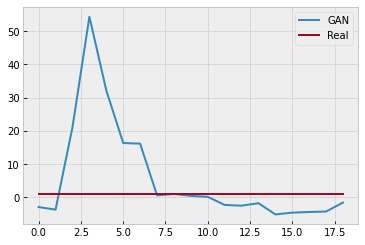

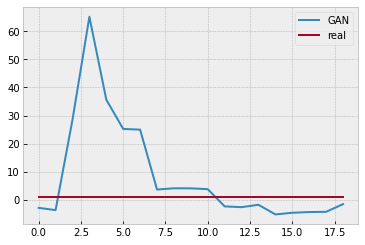

Batch_no: 28000  Epoch: 8


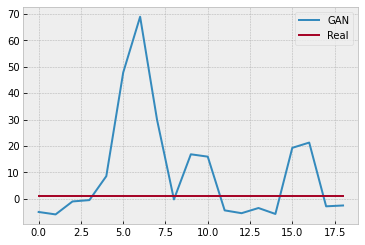

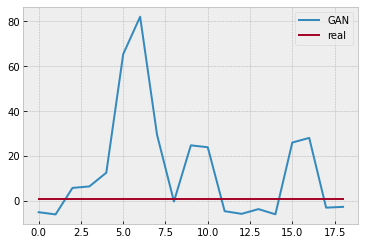

Batch_no: 28500  Epoch: 9


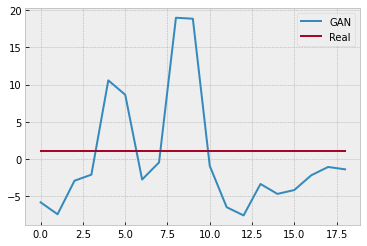

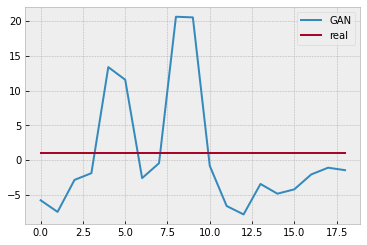

Batch_no: 29000  Epoch: 9


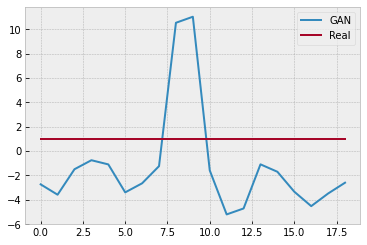

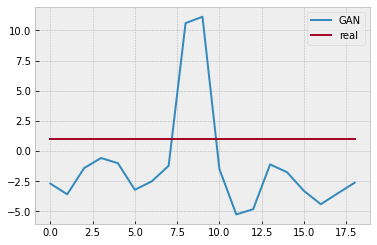

Batch_no: 29500  Epoch: 9


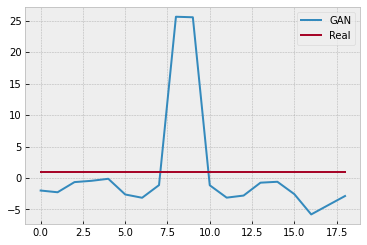

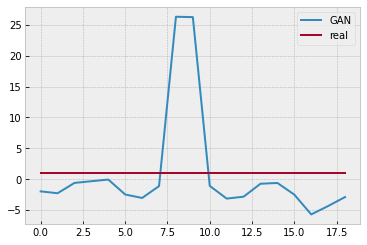

Batch_no: 30000  Epoch: 9


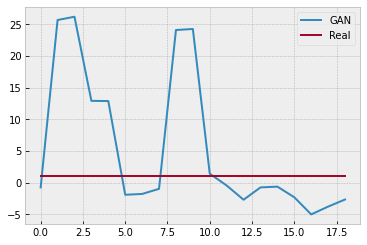

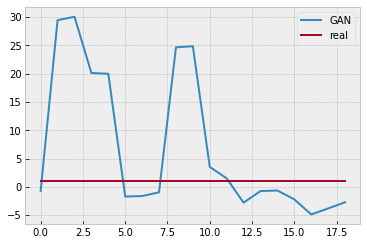

Batch_no: 30500  Epoch: 9


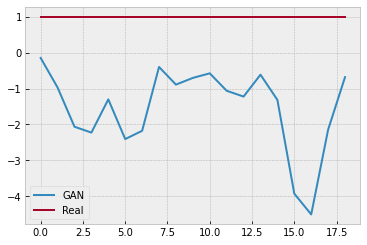

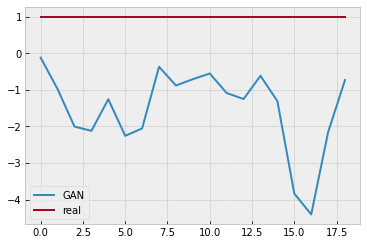

Batch_no: 31000  Epoch: 9


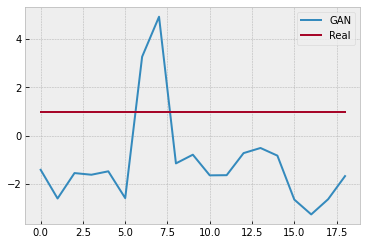

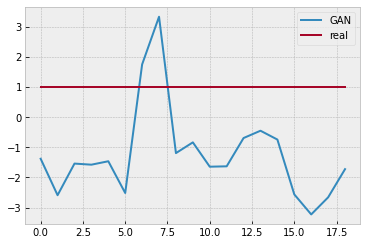

Batch_no: 31500  Epoch: 10


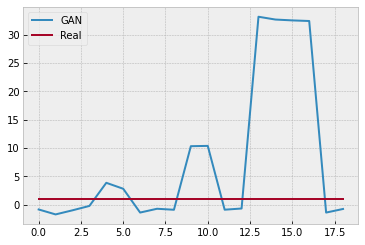

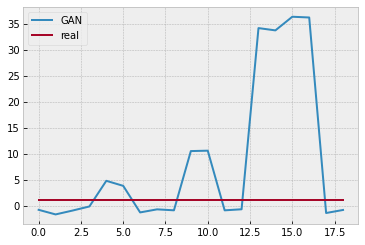

Batch_no: 32000  Epoch: 10


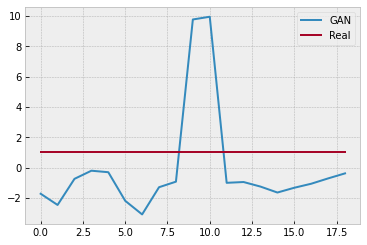

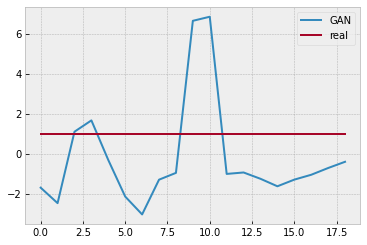

Batch_no: 32500  Epoch: 10


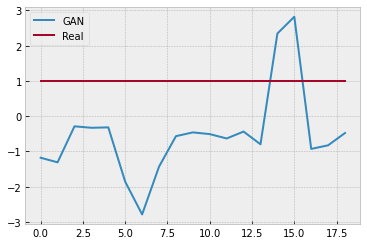

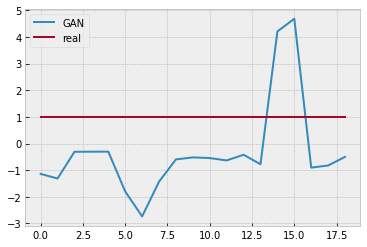

Batch_no: 33000  Epoch: 10


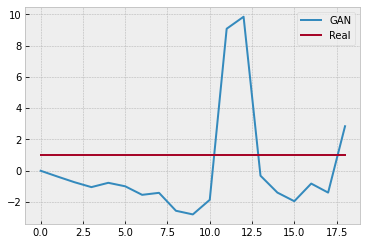

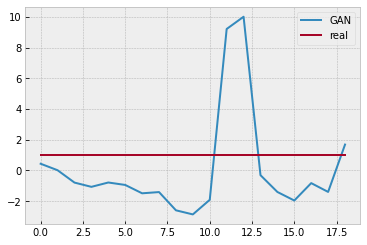

Batch_no: 33500  Epoch: 10


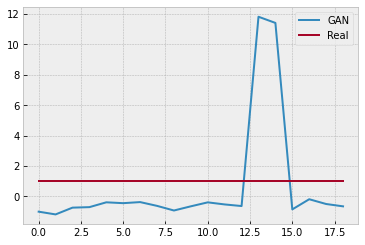

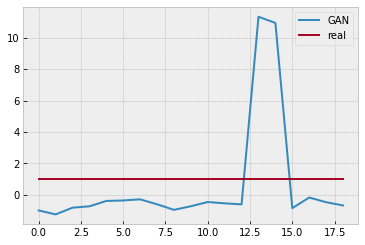

Batch_no: 34000  Epoch: 10


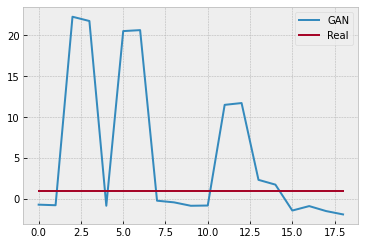

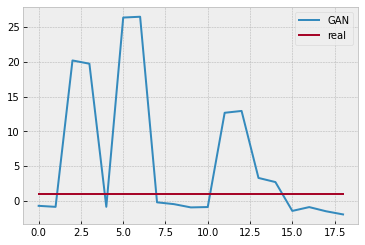

Batch_no: 34500  Epoch: 11


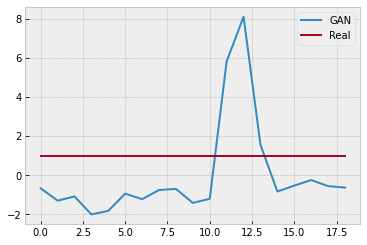

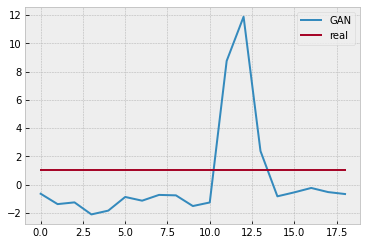

Batch_no: 35000  Epoch: 11


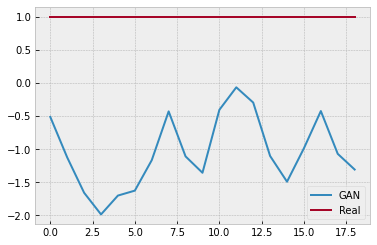

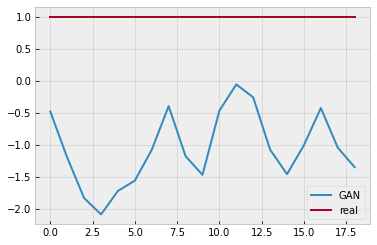

Batch_no: 35500  Epoch: 11


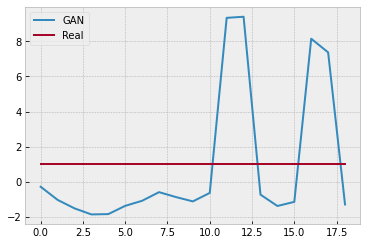

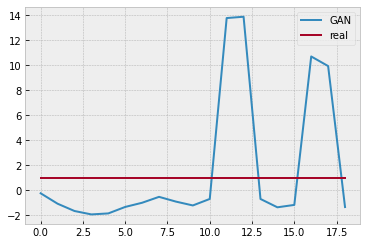

Batch_no: 36000  Epoch: 11


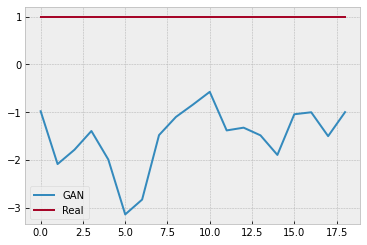

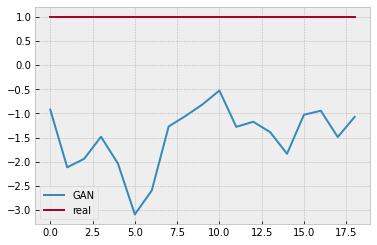

Batch_no: 36500  Epoch: 11


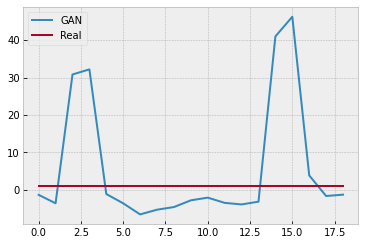

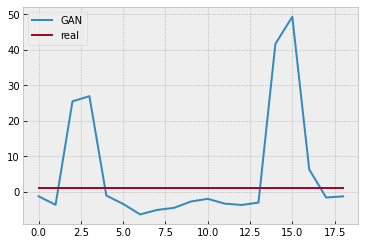

Batch_no: 37000  Epoch: 11


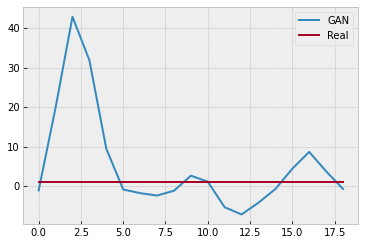

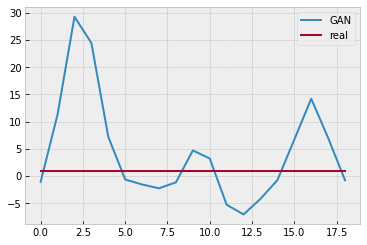

Batch_no: 37500  Epoch: 12


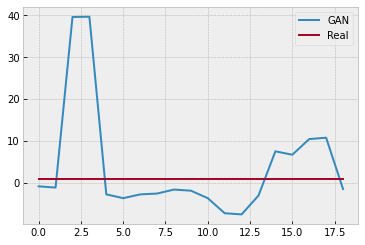

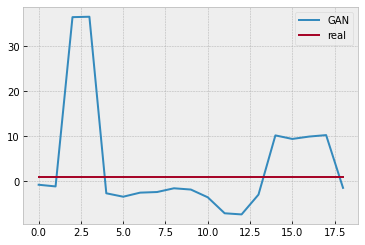

Batch_no: 38000  Epoch: 12


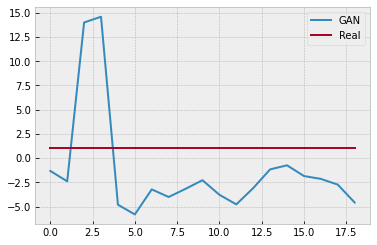

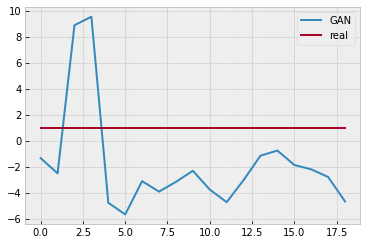

Batch_no: 38500  Epoch: 12


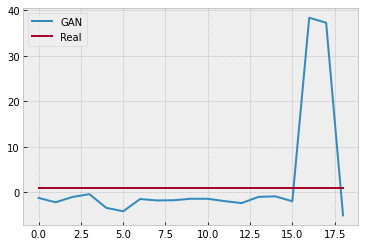

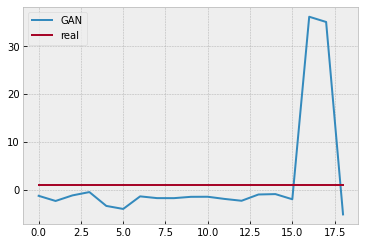

Batch_no: 39000  Epoch: 12


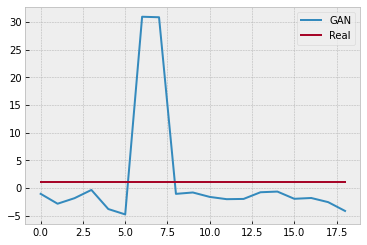

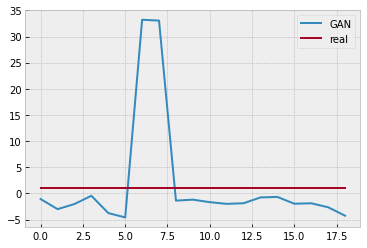

Batch_no: 39500  Epoch: 12


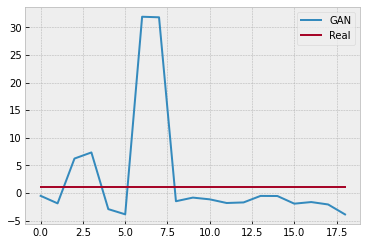

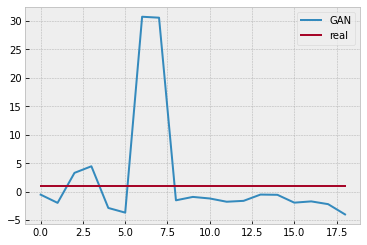

Batch_no: 40000  Epoch: 12


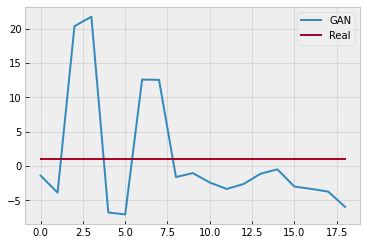

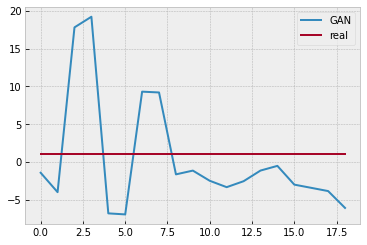

Batch_no: 40500  Epoch: 12


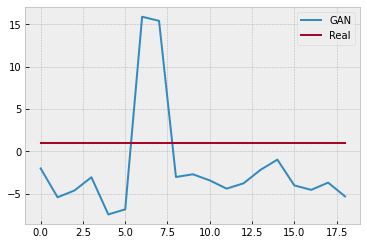

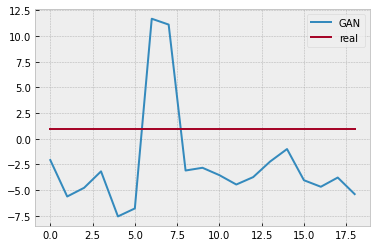

Batch_no: 41000  Epoch: 13


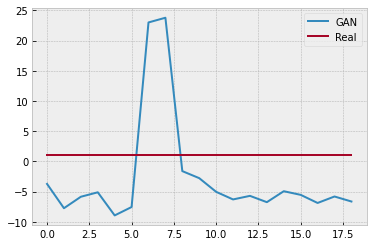

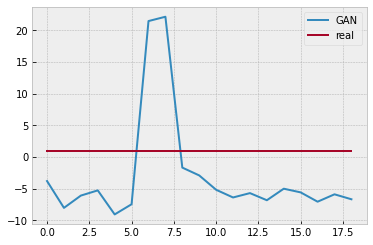

Batch_no: 41500  Epoch: 13


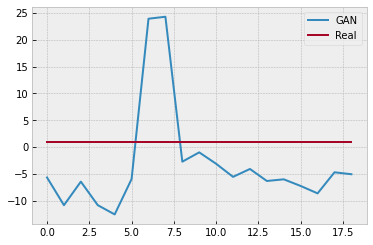

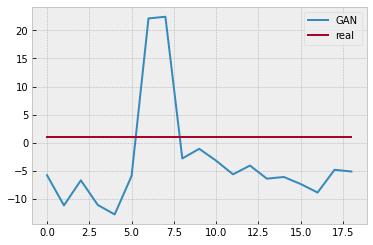

Batch_no: 42000  Epoch: 13


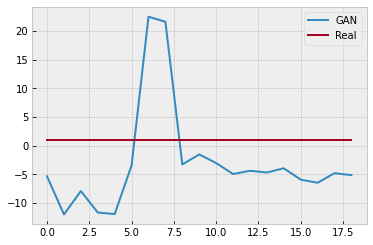

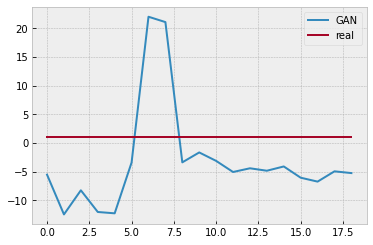

Batch_no: 42500  Epoch: 13


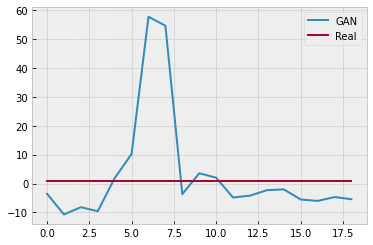

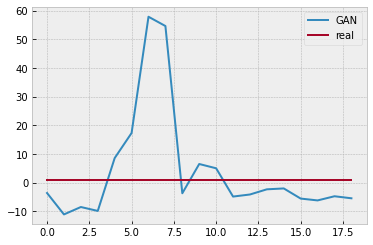

Batch_no: 43000  Epoch: 13


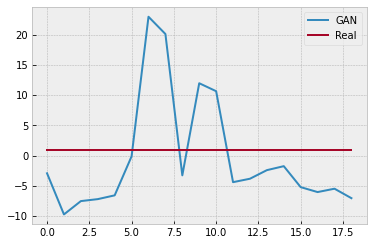

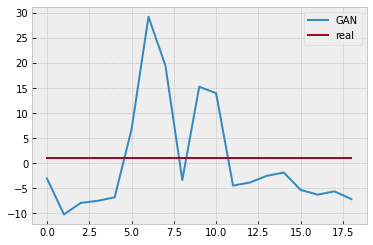

Batch_no: 43500  Epoch: 13


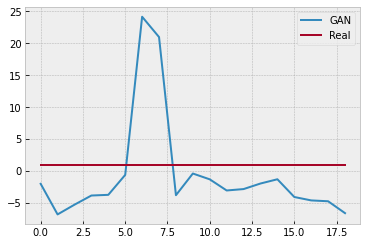

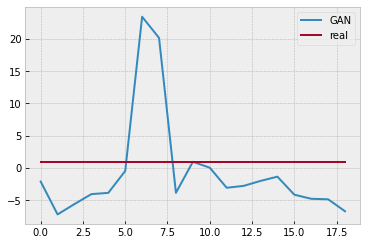

Batch_no: 44000  Epoch: 14


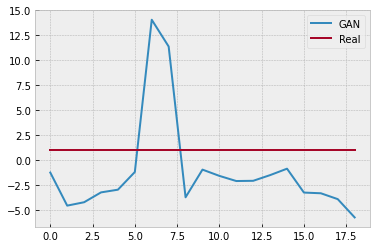

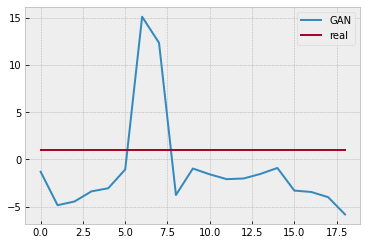

Batch_no: 44500  Epoch: 14


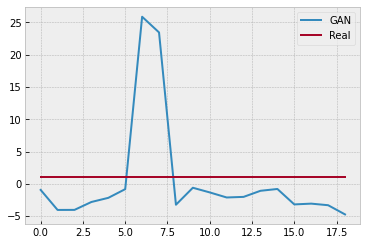

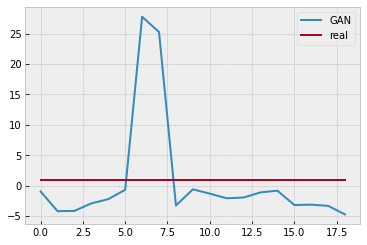

Batch_no: 45000  Epoch: 14


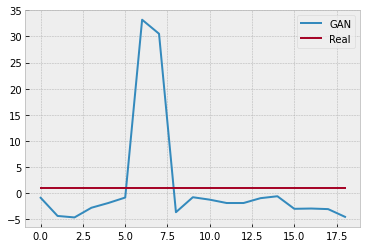

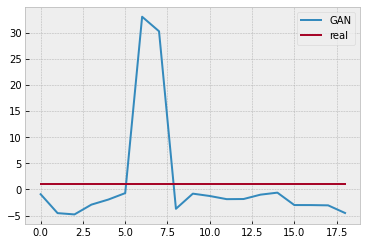

Batch_no: 45500  Epoch: 14


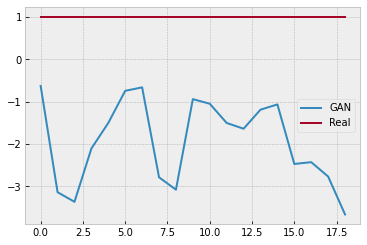

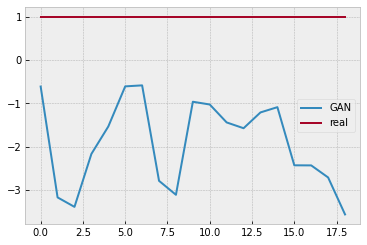

Batch_no: 46000  Epoch: 14


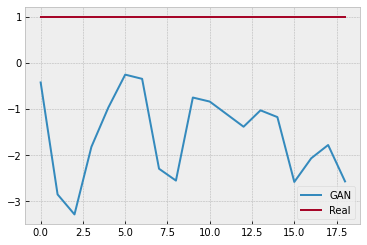

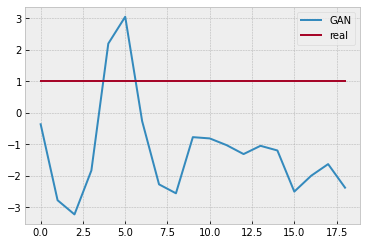

Batch_no: 46500  Epoch: 14


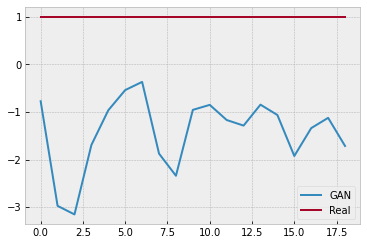

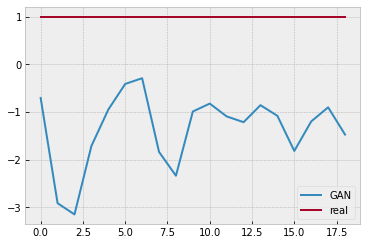

Batch_no: 47000  Epoch: 15


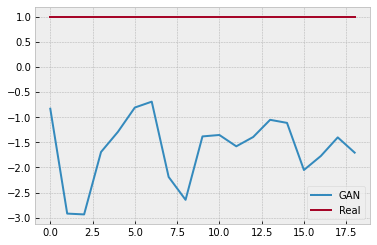

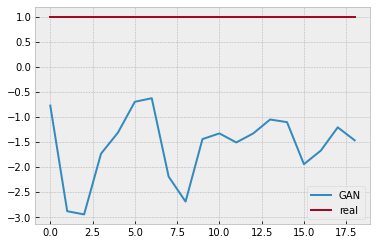

Batch_no: 47500  Epoch: 15


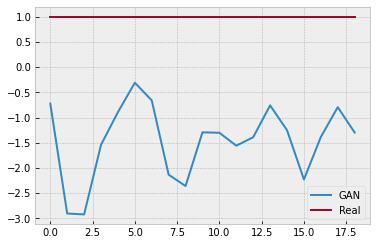

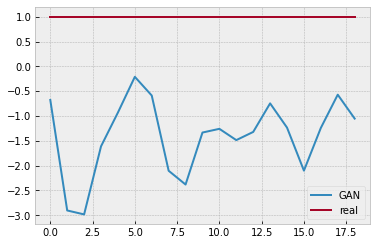

Batch_no: 48000  Epoch: 15


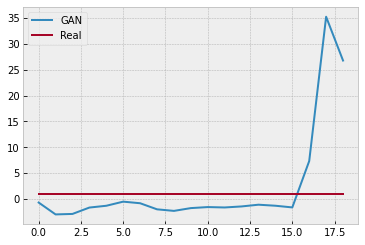

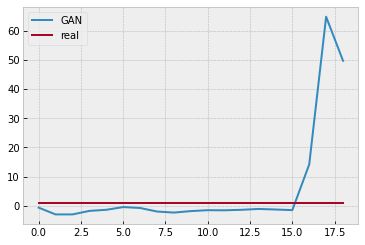

Batch_no: 48500  Epoch: 15


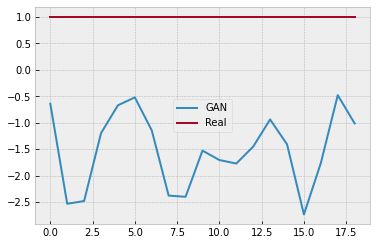

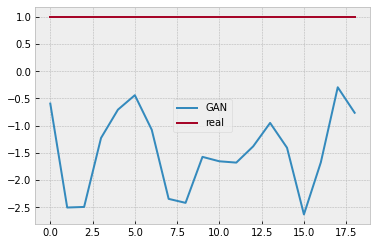

Batch_no: 49000  Epoch: 15


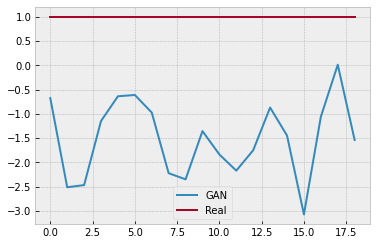

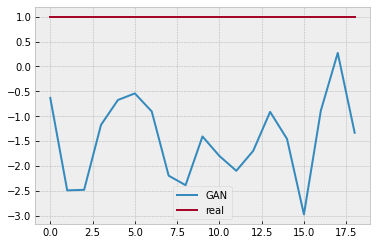

Batch_no: 49500  Epoch: 15


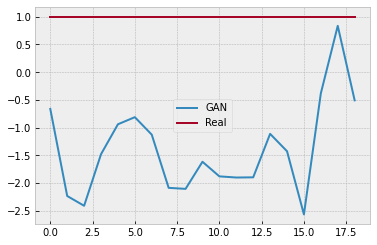

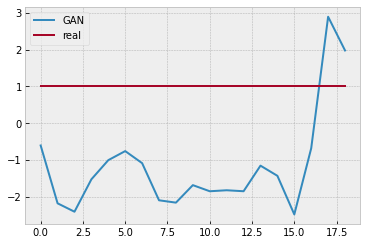

Batch_no: 50000  Epoch: 16


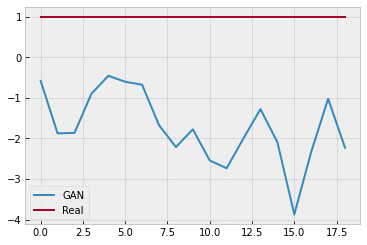

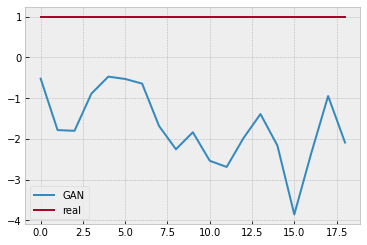

Batch_no: 50500  Epoch: 16


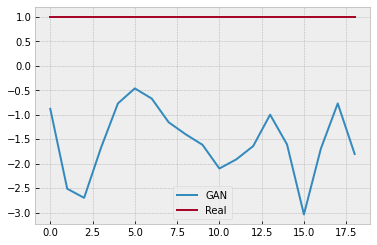

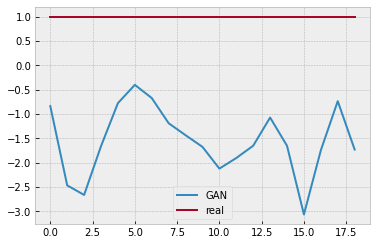

Batch_no: 51000  Epoch: 16


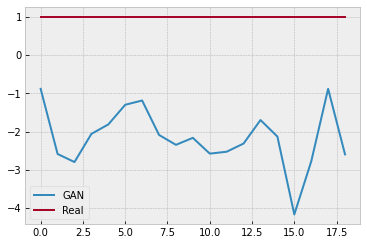

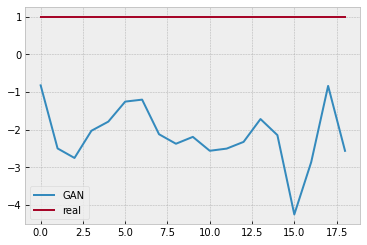

Batch_no: 51500  Epoch: 16


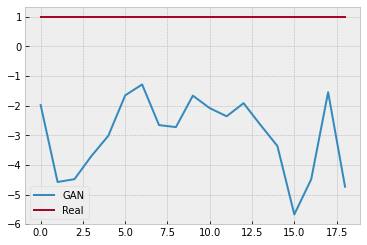

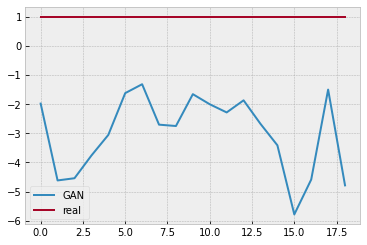

Batch_no: 52000  Epoch: 16


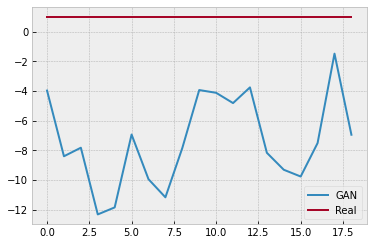

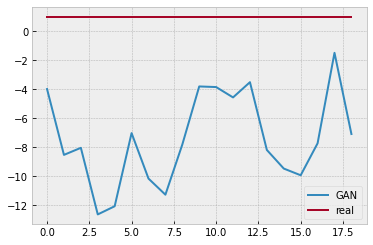

Batch_no: 52500  Epoch: 16


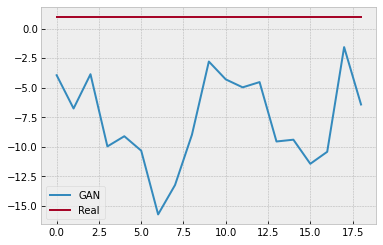

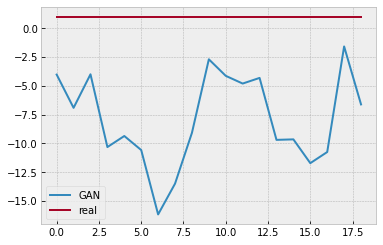

Batch_no: 53000  Epoch: 16


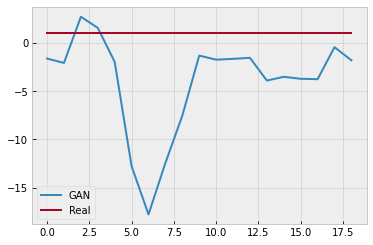

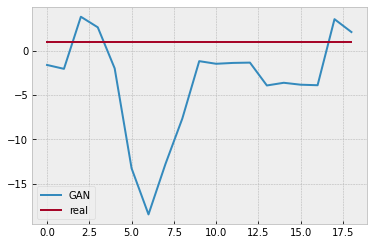

Batch_no: 53500  Epoch: 17


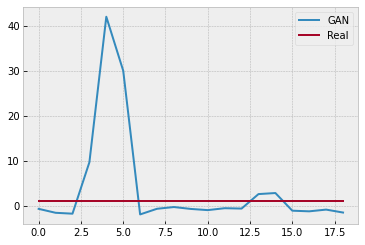

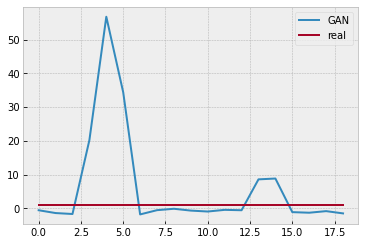

Batch_no: 54000  Epoch: 17


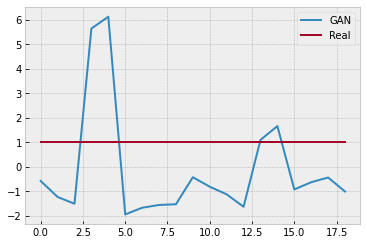

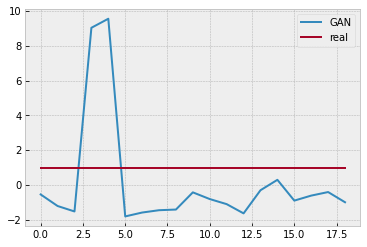

Batch_no: 54500  Epoch: 17


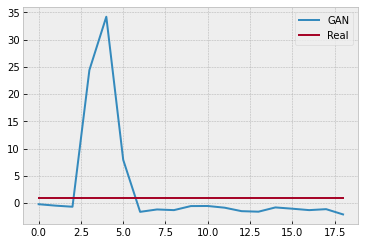

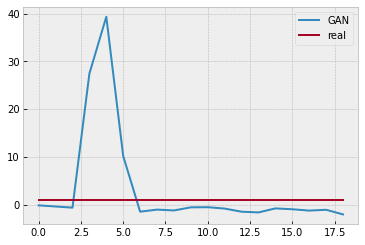

Batch_no: 55000  Epoch: 17


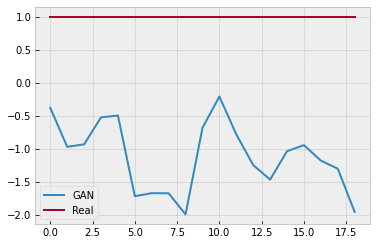

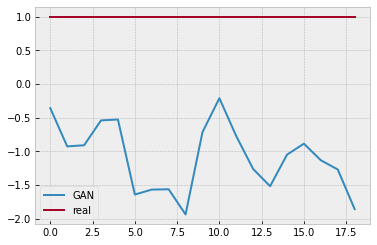

Batch_no: 55500  Epoch: 17


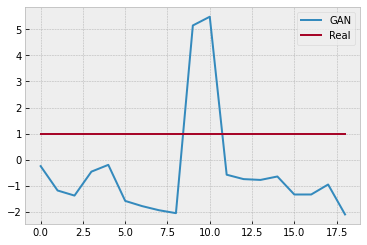

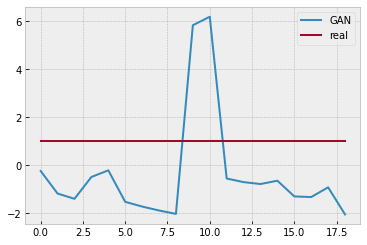

Batch_no: 56000  Epoch: 17


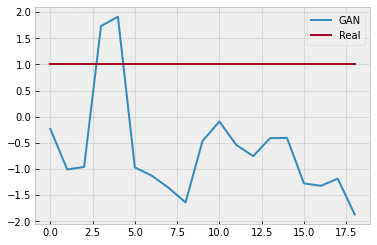

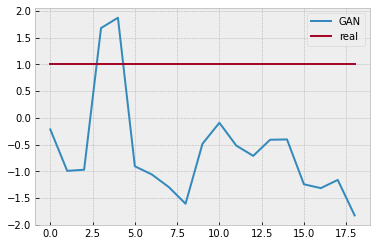

Batch_no: 56500  Epoch: 18


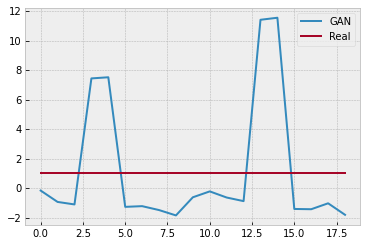

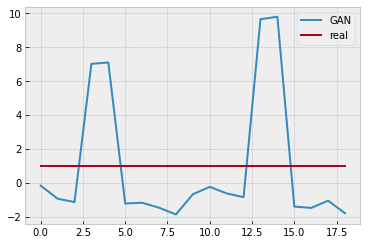

Batch_no: 57000  Epoch: 18


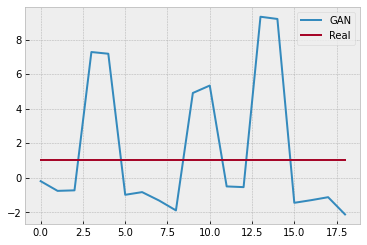

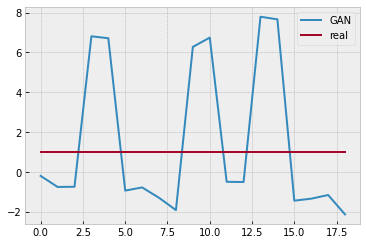

Batch_no: 57500  Epoch: 18


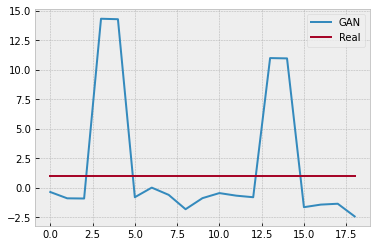

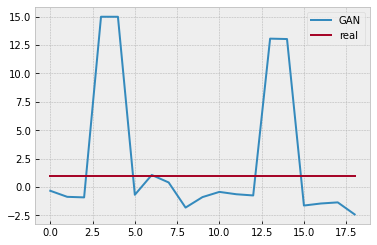

Batch_no: 58000  Epoch: 18


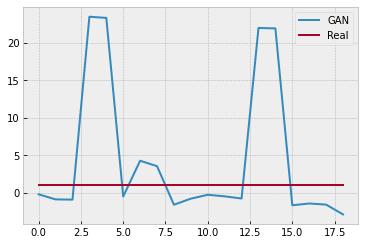

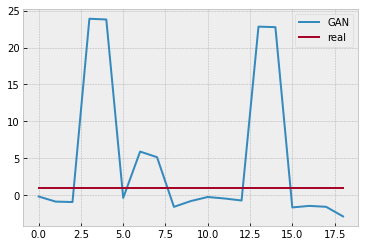

Batch_no: 58500  Epoch: 18


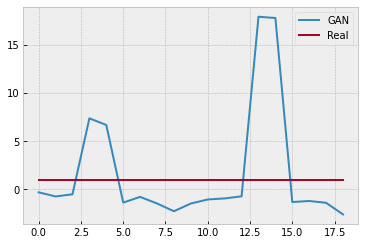

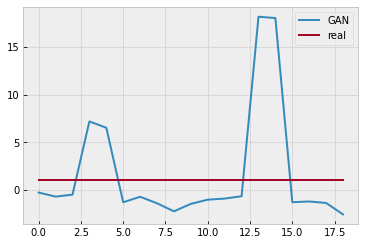

Batch_no: 59000  Epoch: 18


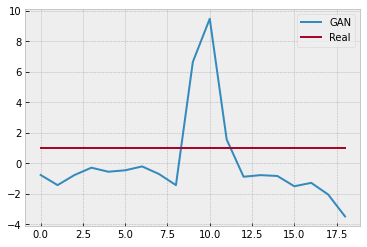

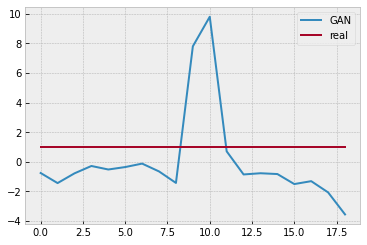

Batch_no: 59500  Epoch: 19


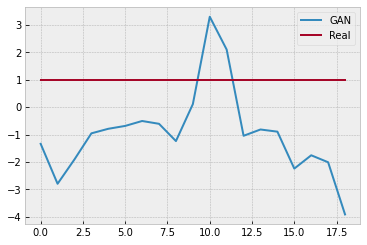

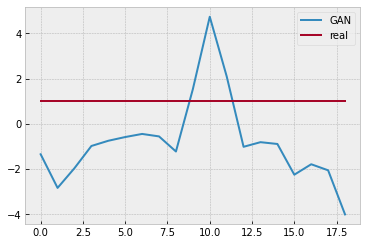

Batch_no: 60000  Epoch: 19


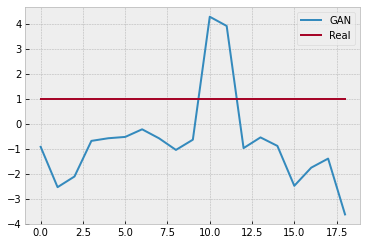

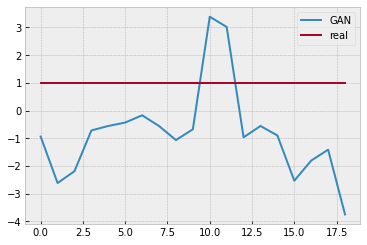

Batch_no: 60500  Epoch: 19


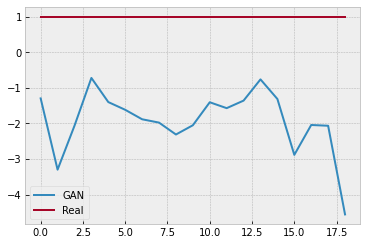

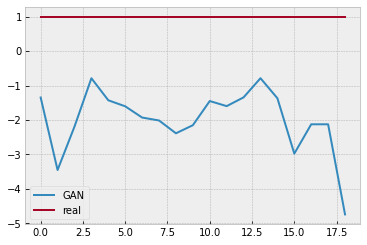

Batch_no: 61000  Epoch: 19


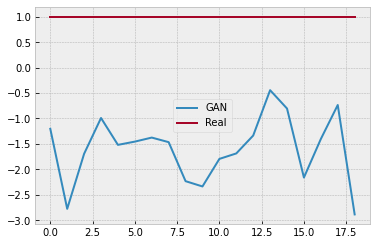

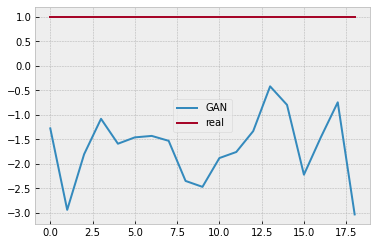

Batch_no: 61500  Epoch: 19


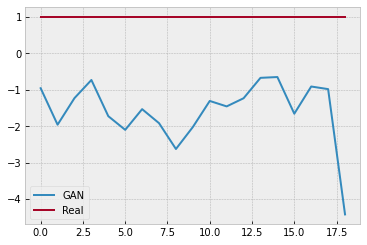

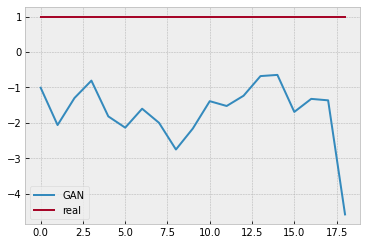

Batch_no: 62000  Epoch: 19


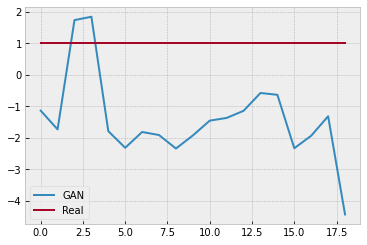

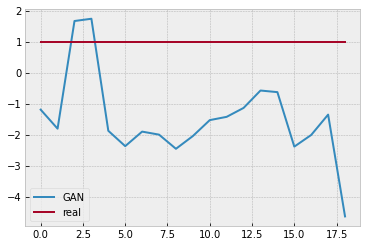

Batch_no: 62500  Epoch: 20


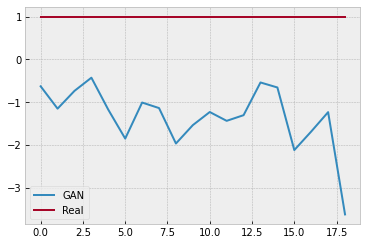

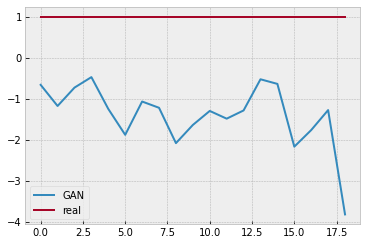

Batch_no: 63000  Epoch: 20


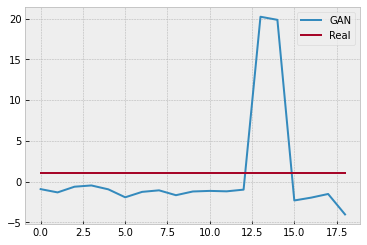

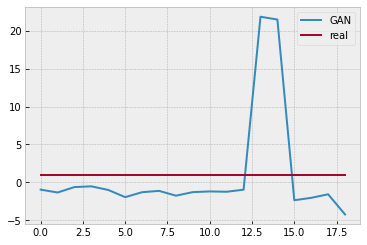

Batch_no: 63500  Epoch: 20


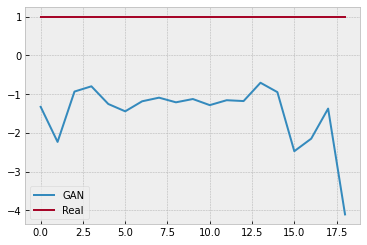

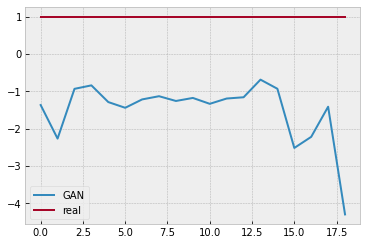

Batch_no: 64000  Epoch: 20


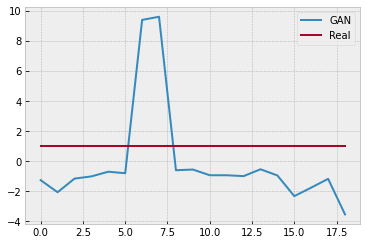

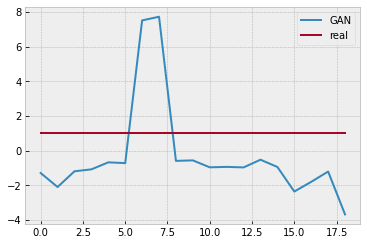

Batch_no: 64500  Epoch: 20


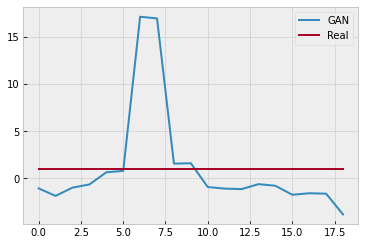

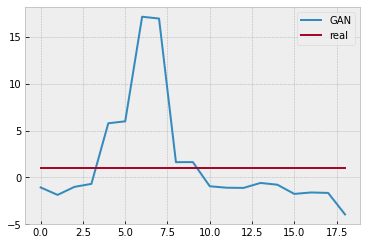

Batch_no: 65000  Epoch: 20


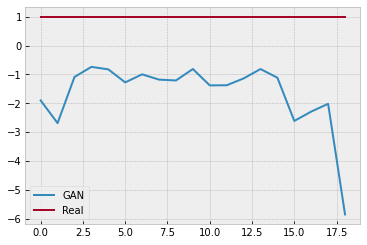

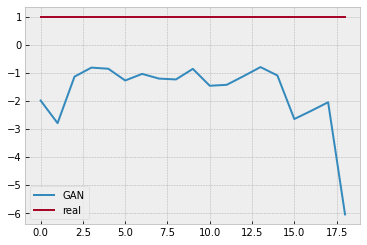

Batch_no: 65500  Epoch: 20


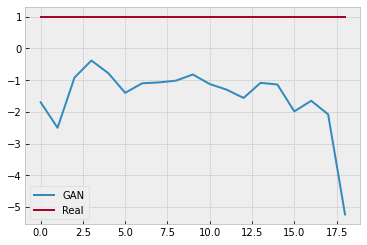

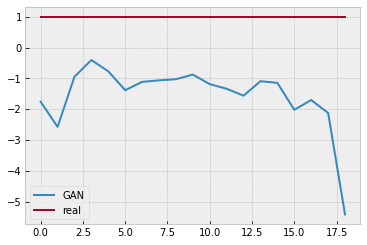

Batch_no: 66000  Epoch: 21


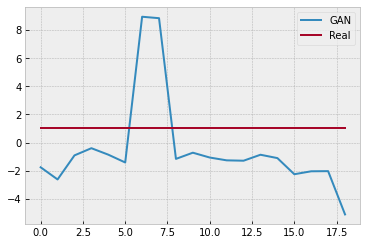

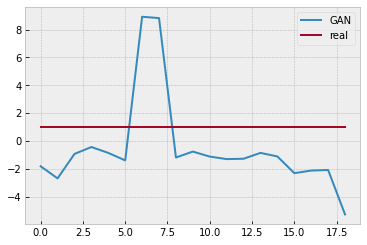

Batch_no: 66500  Epoch: 21


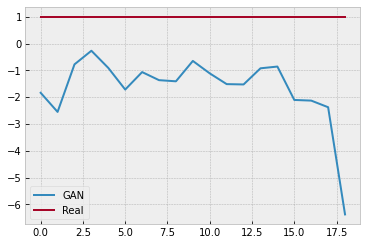

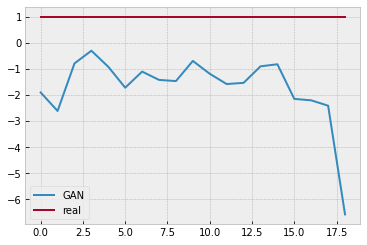

Batch_no: 67000  Epoch: 21


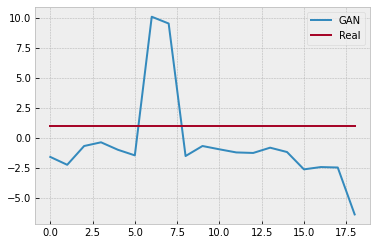

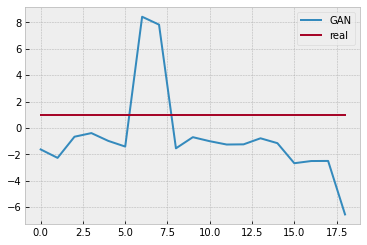

Batch_no: 67500  Epoch: 21


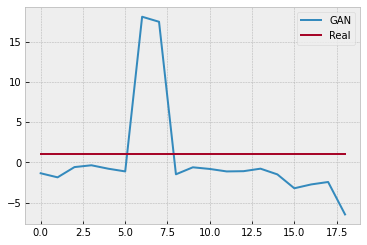

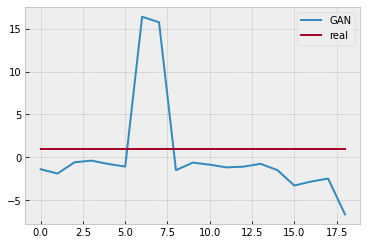

Batch_no: 68000  Epoch: 21


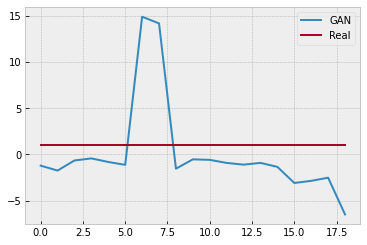

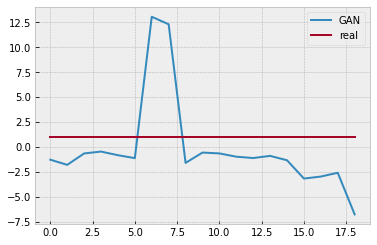

Batch_no: 68500  Epoch: 21


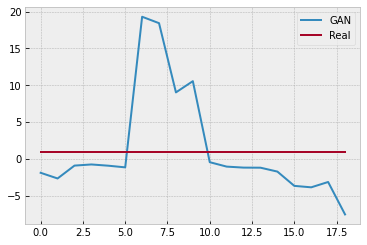

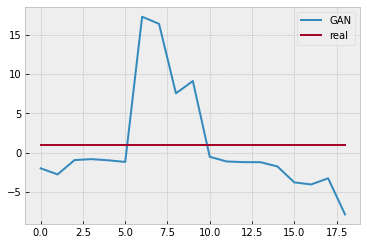

Batch_no: 69000  Epoch: 22


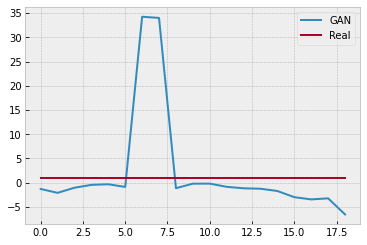

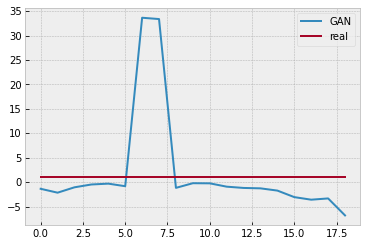

Batch_no: 69500  Epoch: 22


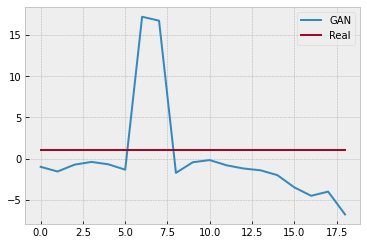

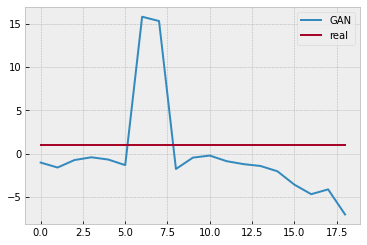

Batch_no: 70000  Epoch: 22


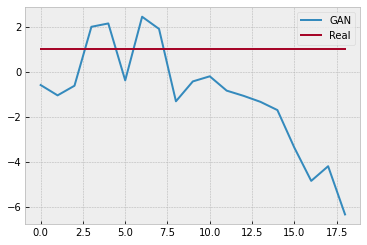

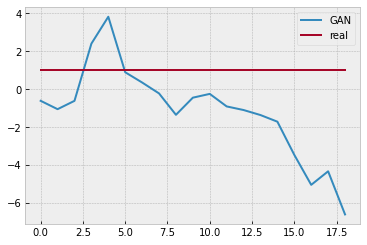

Batch_no: 70500  Epoch: 22


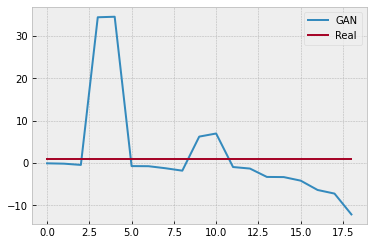

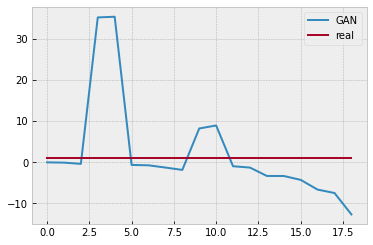

Batch_no: 71000  Epoch: 22


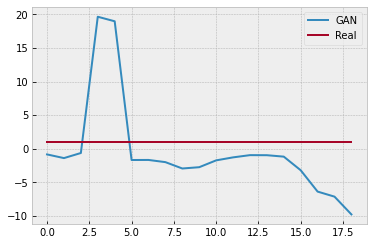

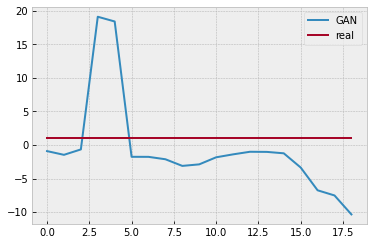

Batch_no: 71500  Epoch: 22


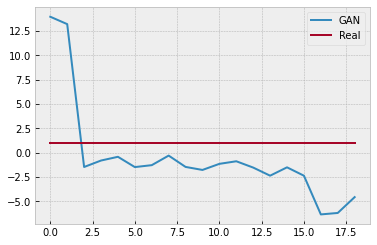

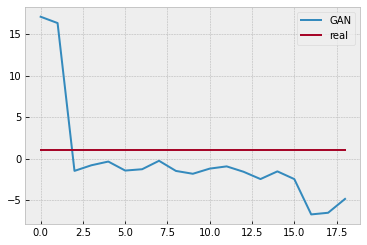

Batch_no: 72000  Epoch: 23


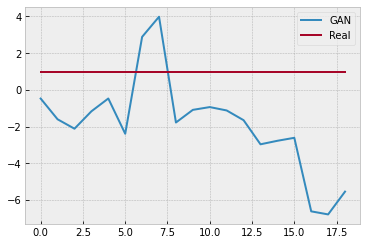

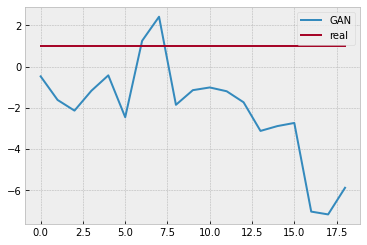

Batch_no: 72500  Epoch: 23


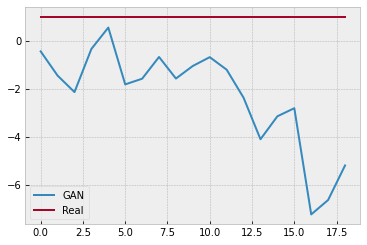

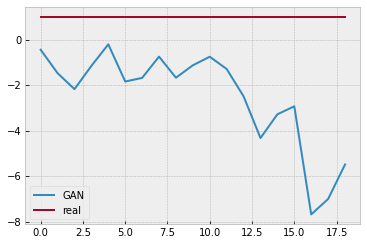

Batch_no: 73000  Epoch: 23


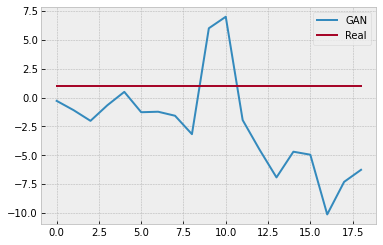

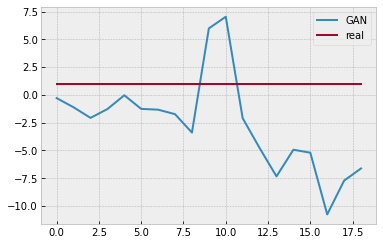

Batch_no: 73500  Epoch: 23


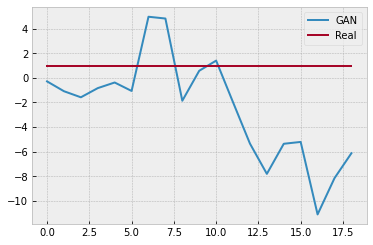

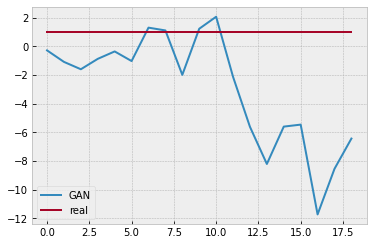

Batch_no: 74000  Epoch: 23


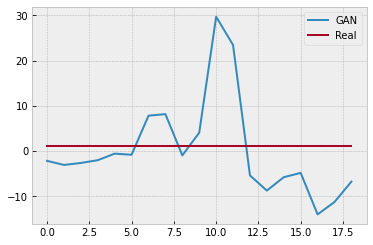

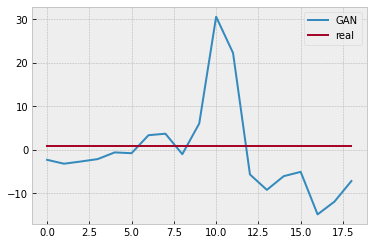

Batch_no: 74500  Epoch: 23


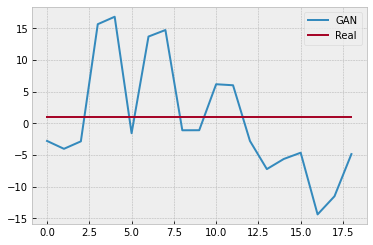

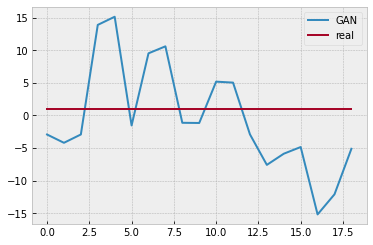

Batch_no: 75000  Epoch: 24


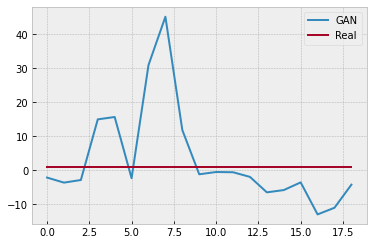

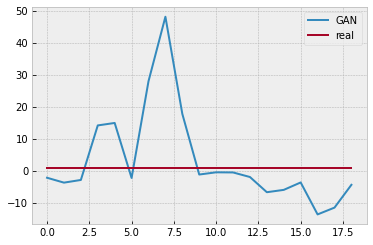

Batch_no: 75500  Epoch: 24


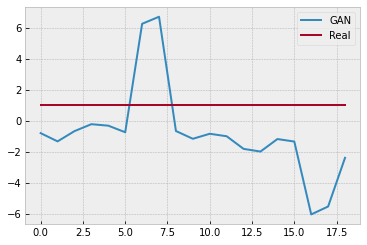

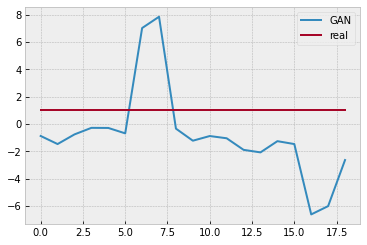

Batch_no: 76000  Epoch: 24


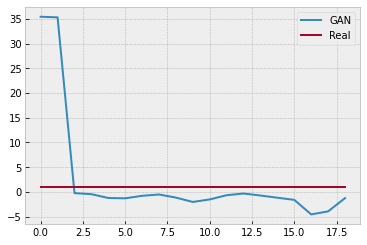

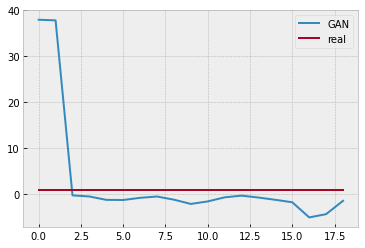

Batch_no: 76500  Epoch: 24


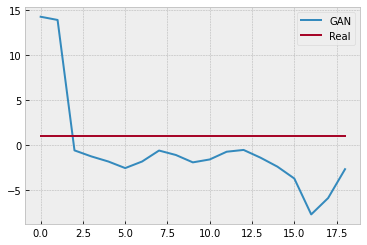

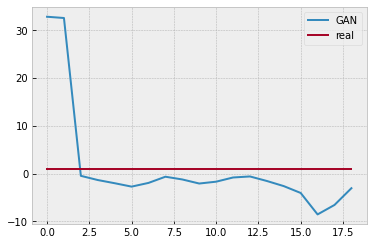

Batch_no: 77000  Epoch: 24


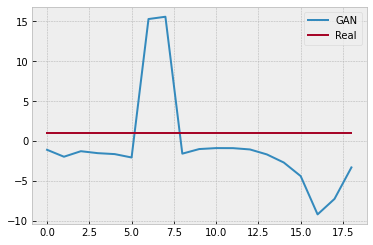

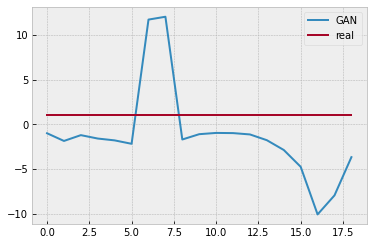

Batch_no: 77500  Epoch: 24


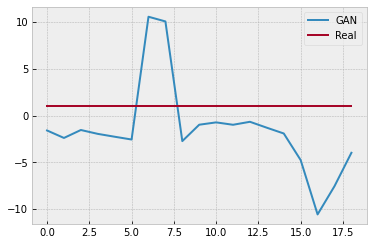

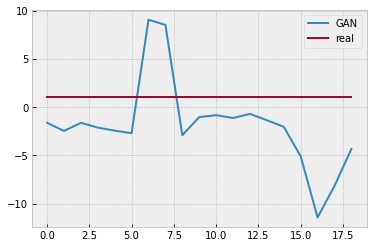

Batch_no: 78000  Epoch: 24


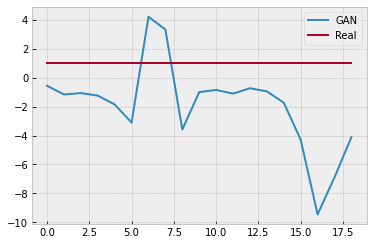

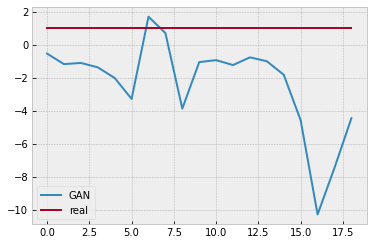

Batch_no: 78500  Epoch: 25


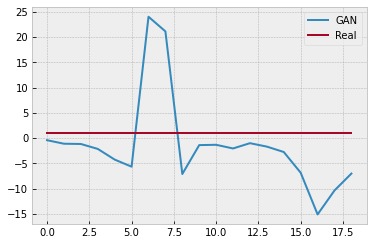

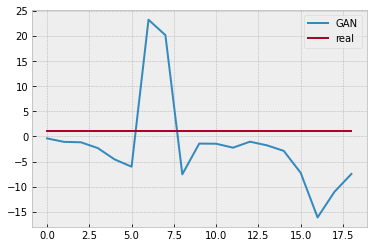

Batch_no: 79000  Epoch: 25


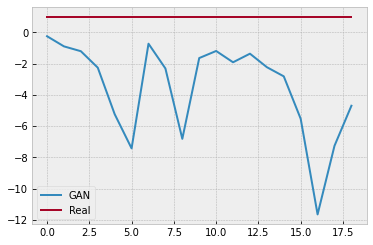

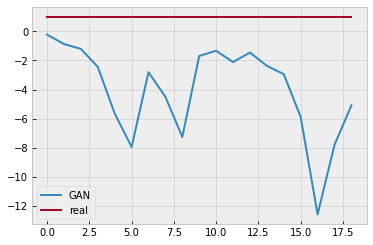

Batch_no: 79500  Epoch: 25
Batch_no: 168000  Epoch: 53


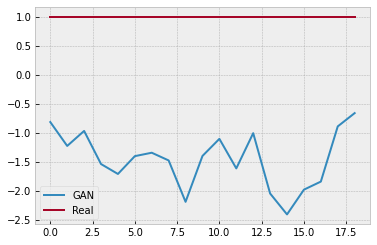

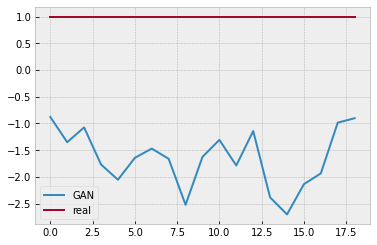

Batch_no: 168500  Epoch: 53


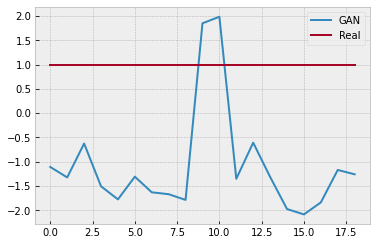

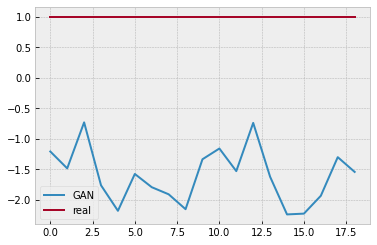

Batch_no: 169000  Epoch: 54


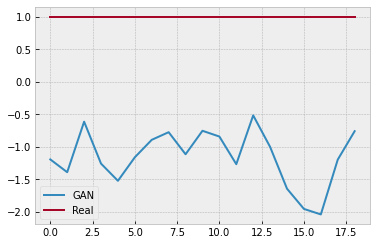

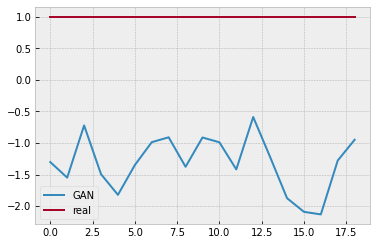

Batch_no: 169500  Epoch: 54


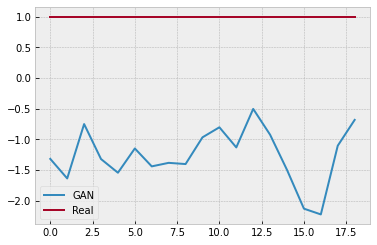

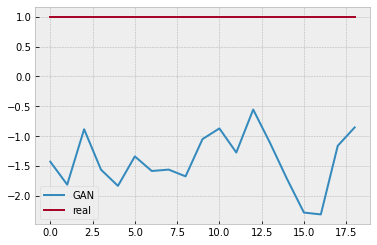

Batch_no: 170000  Epoch: 54


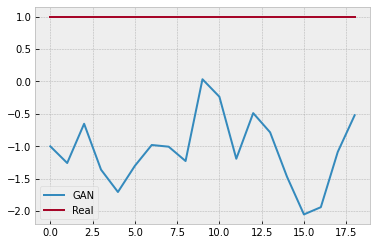

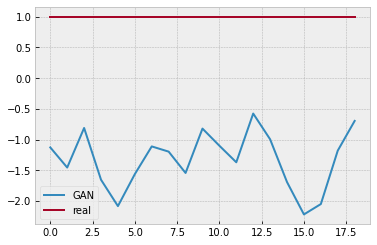

Batch_no: 170500  Epoch: 54


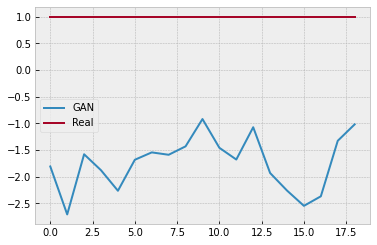

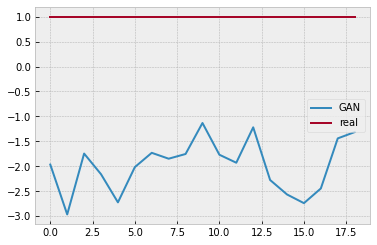

Batch_no: 171000  Epoch: 54


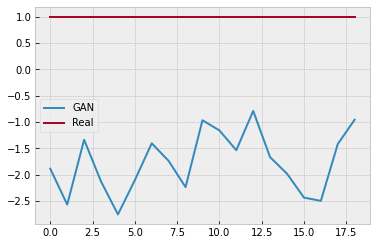

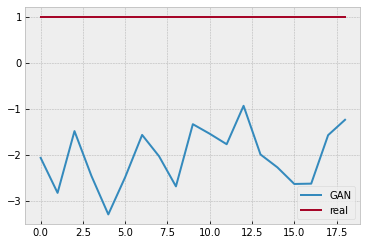

Batch_no: 171500  Epoch: 54


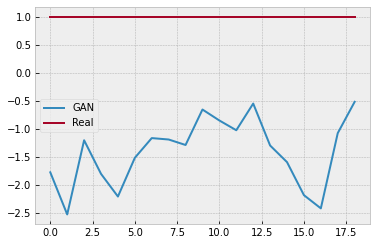

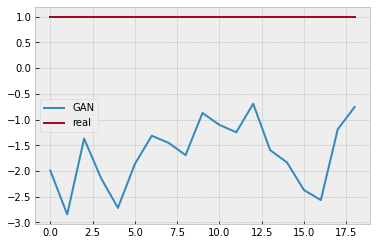

Batch_no: 172000  Epoch: 55


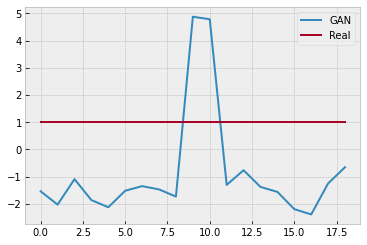

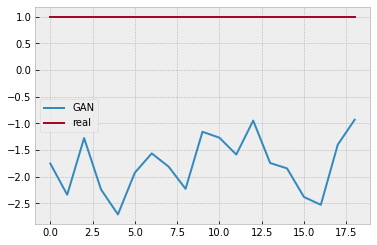

Batch_no: 172500  Epoch: 55


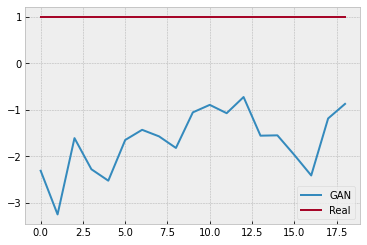

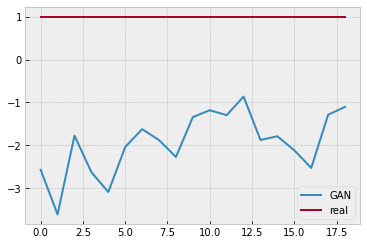

Batch_no: 173000  Epoch: 55


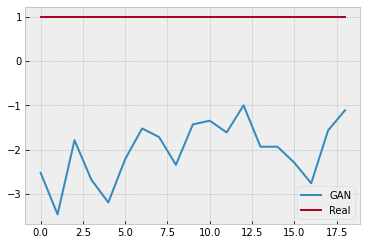

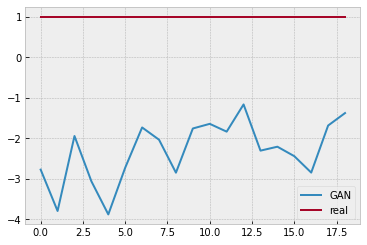

Batch_no: 173500  Epoch: 55


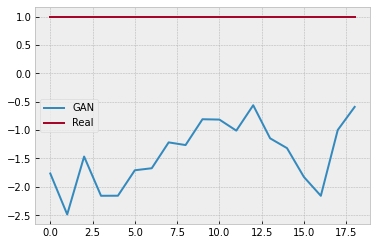

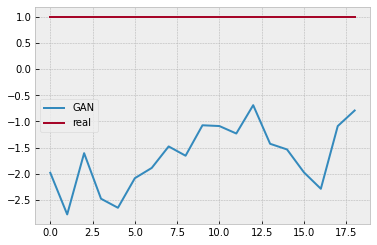

Batch_no: 174000  Epoch: 55


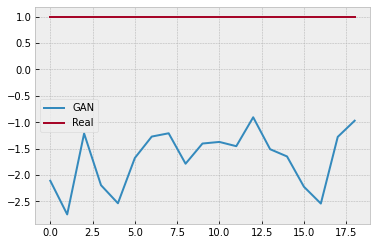

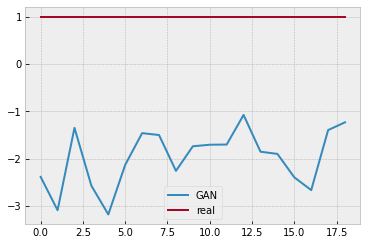

Batch_no: 174500  Epoch: 55


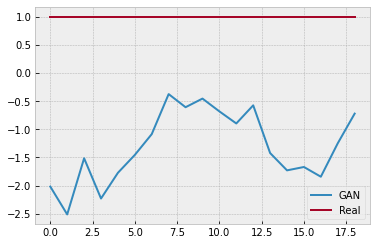

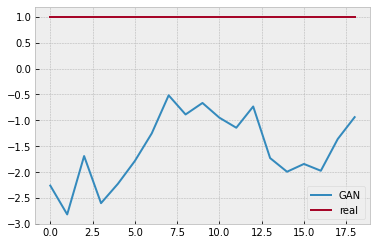

Batch_no: 175000  Epoch: 56


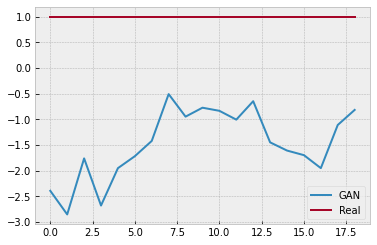

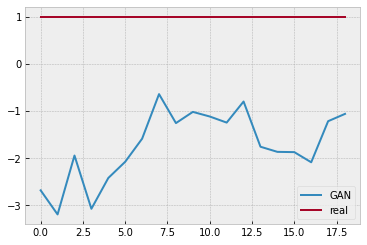

Batch_no: 175500  Epoch: 56


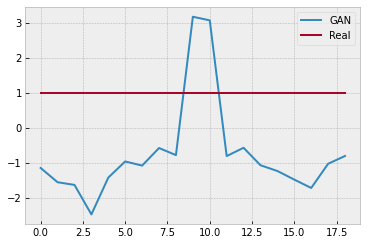

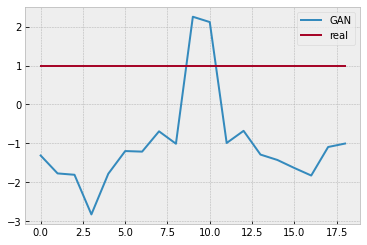

Batch_no: 176000  Epoch: 56


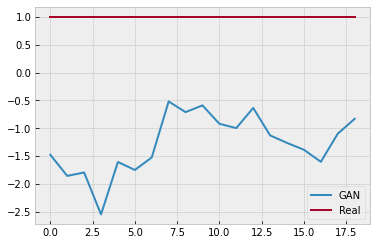

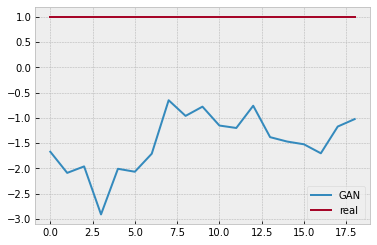

Batch_no: 176500  Epoch: 56


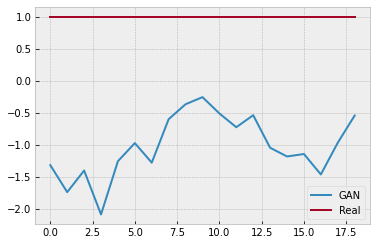

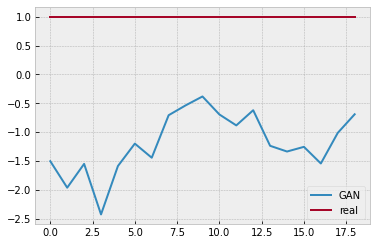

Batch_no: 177000  Epoch: 56


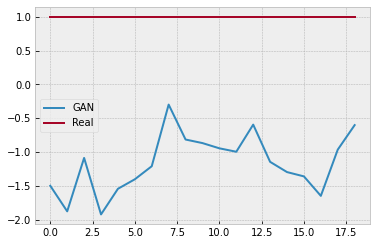

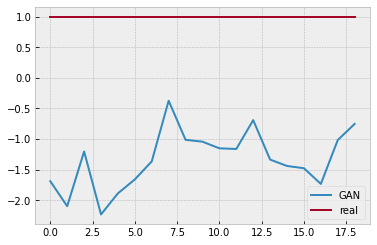

Batch_no: 177500  Epoch: 56


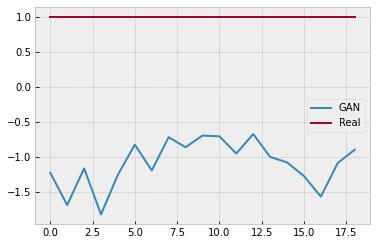

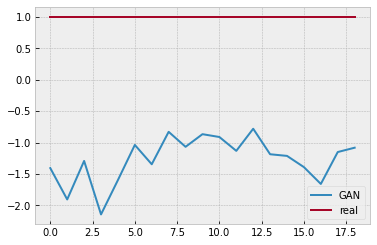

Batch_no: 178000  Epoch: 56


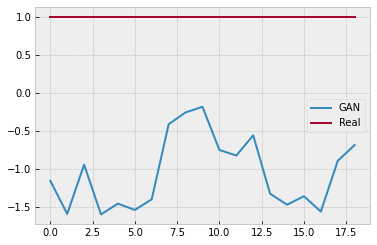

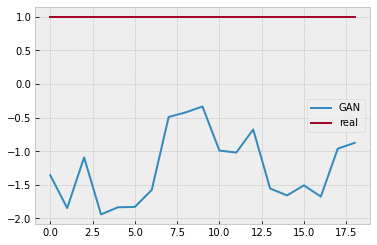

Batch_no: 178500  Epoch: 57


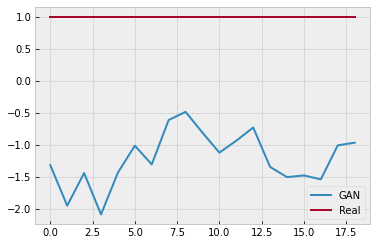

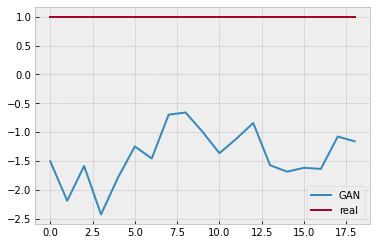

Batch_no: 179000  Epoch: 57


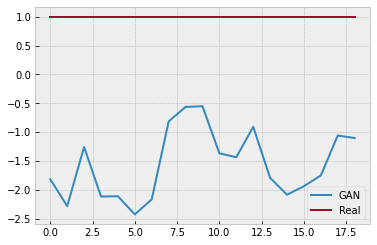

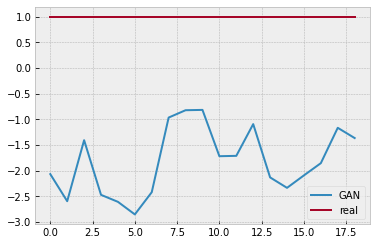

Batch_no: 179500  Epoch: 57


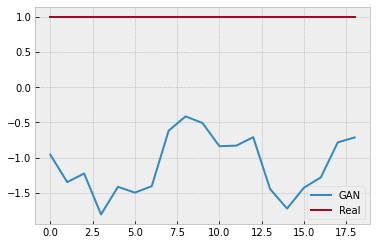

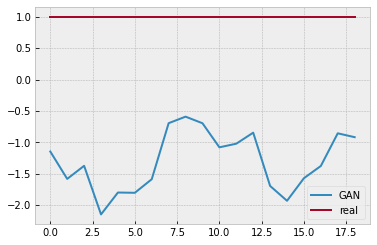

Batch_no: 180000  Epoch: 57


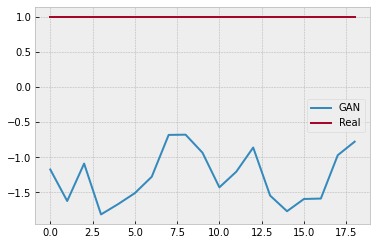

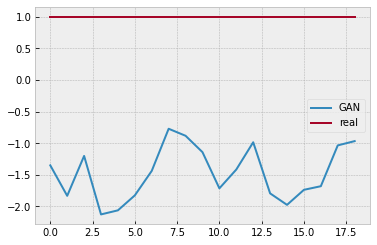

Batch_no: 180500  Epoch: 57


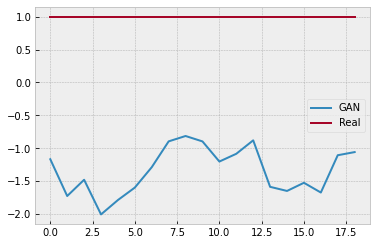

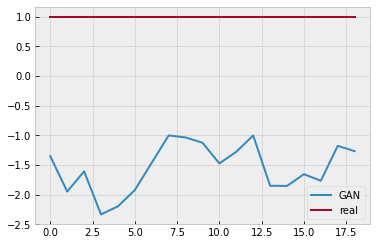

Batch_no: 181000  Epoch: 57


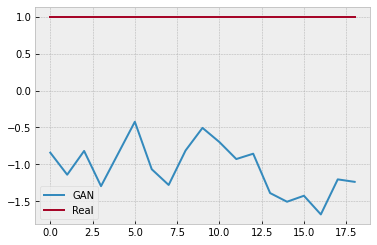

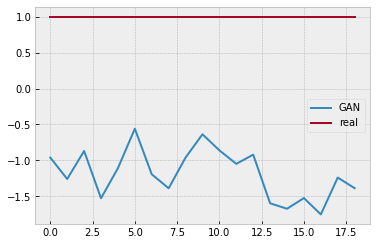

Batch_no: 181500  Epoch: 58


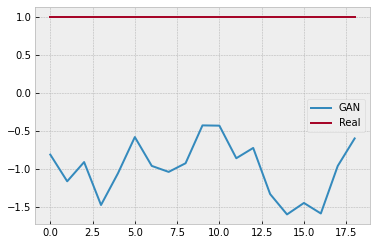

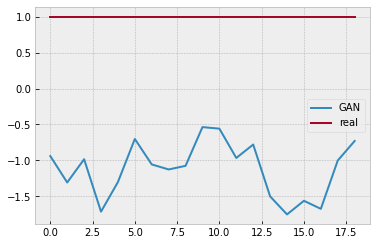

Batch_no: 182000  Epoch: 58


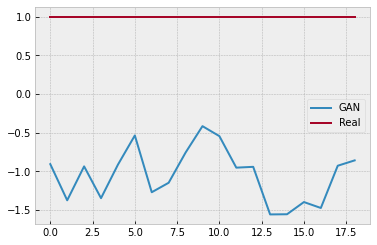

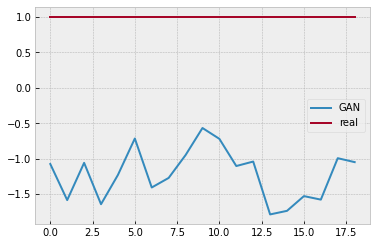

Batch_no: 182500  Epoch: 58


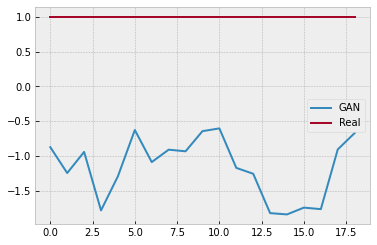

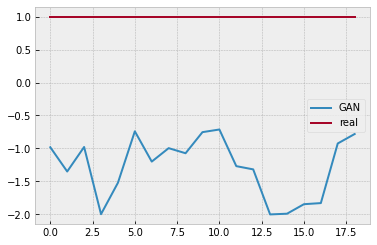

Batch_no: 183000  Epoch: 58


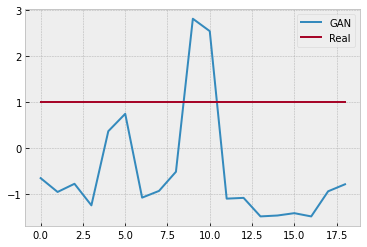

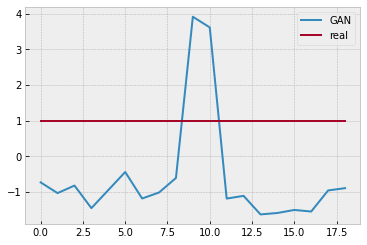

Batch_no: 183500  Epoch: 58


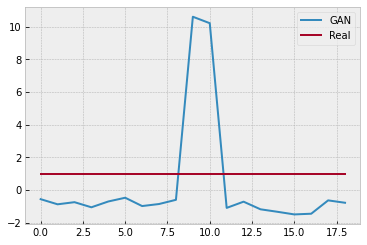

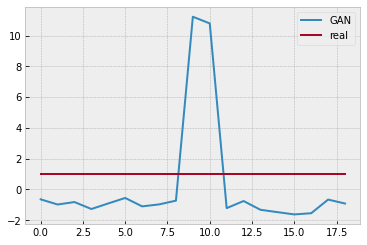

Batch_no: 184000  Epoch: 58


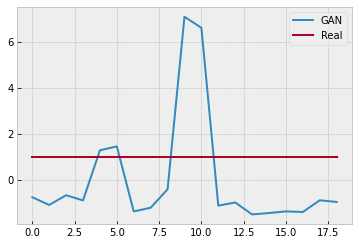

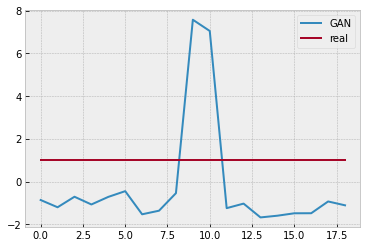

Batch_no: 184500  Epoch: 59


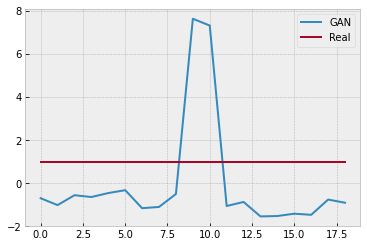

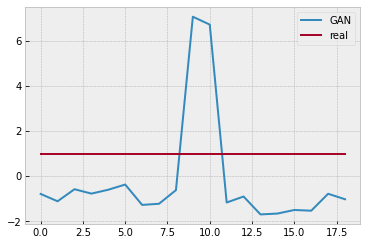

Batch_no: 185000  Epoch: 59


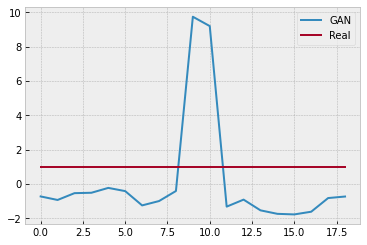

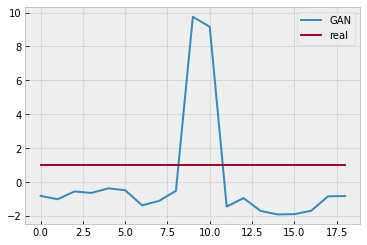

Batch_no: 185500  Epoch: 59


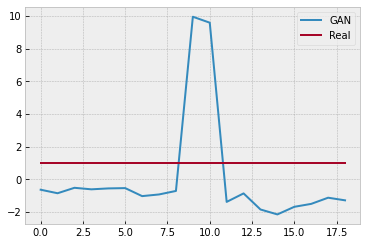

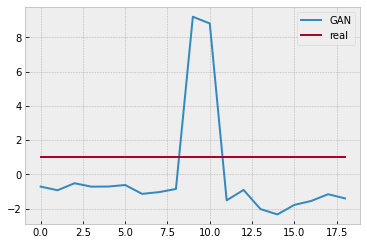

Batch_no: 186000  Epoch: 59


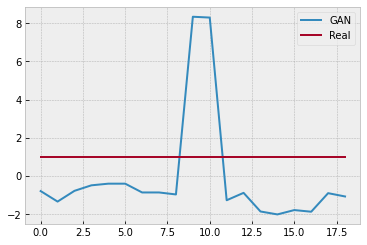

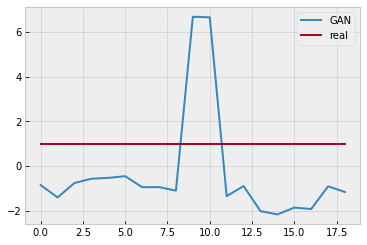

Batch_no: 186500  Epoch: 59


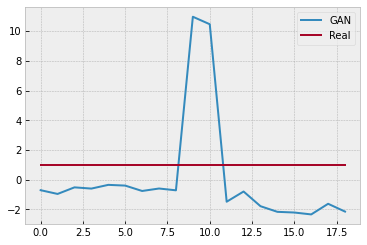

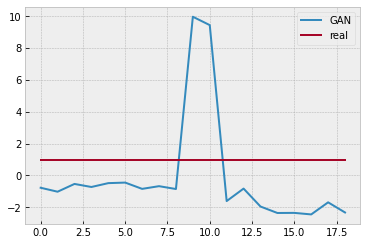

Batch_no: 187000  Epoch: 59


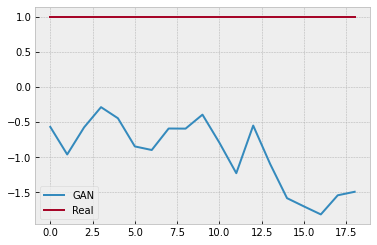

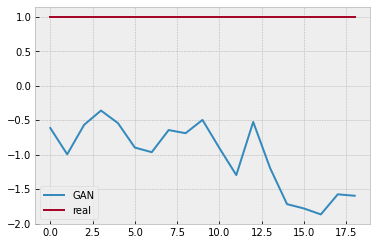

Batch_no: 187500  Epoch: 60


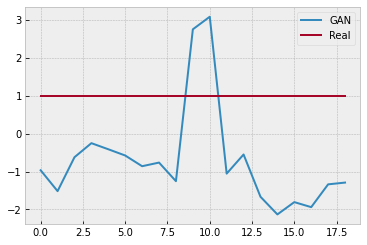

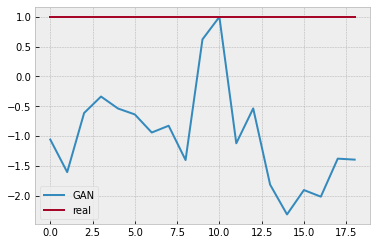

Batch_no: 188000  Epoch: 60


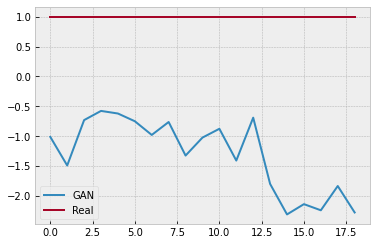

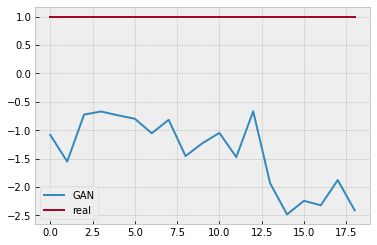

Batch_no: 188500  Epoch: 60


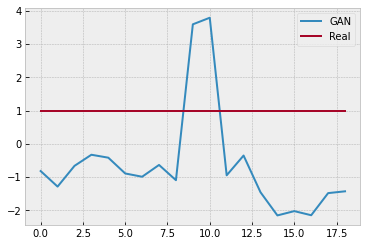

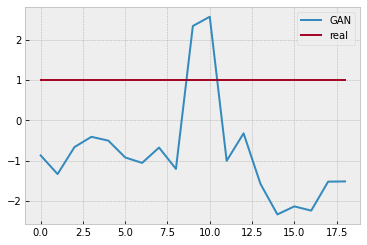

Batch_no: 189000  Epoch: 60


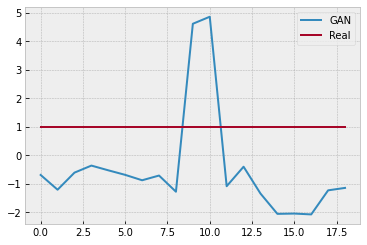

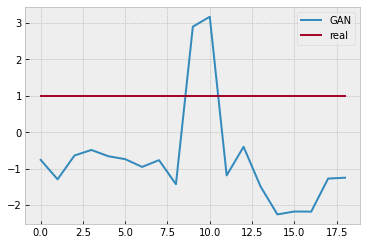

Batch_no: 189500  Epoch: 60


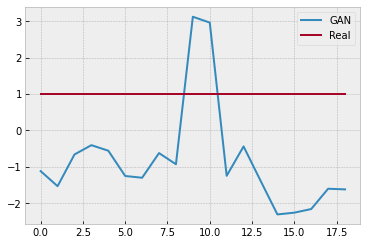

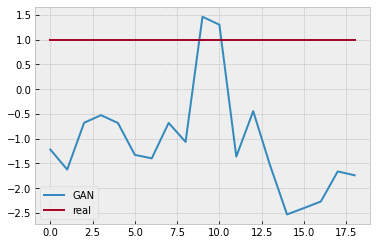

Batch_no: 190000  Epoch: 60


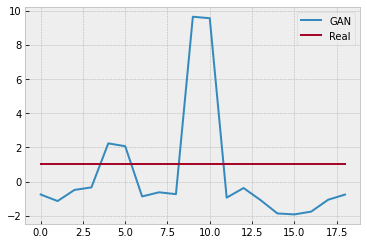

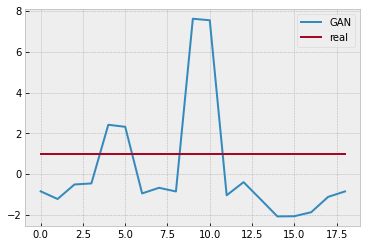

Batch_no: 190500  Epoch: 60


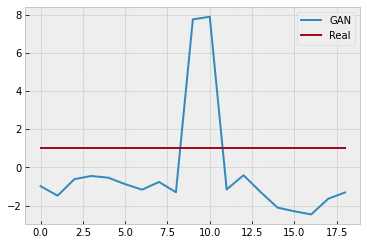

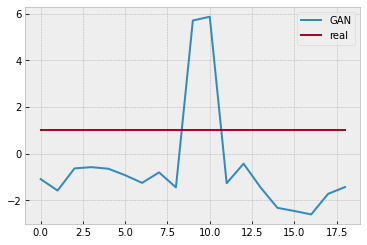

Batch_no: 191000  Epoch: 61


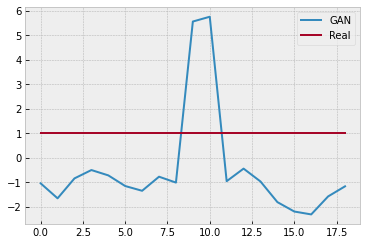

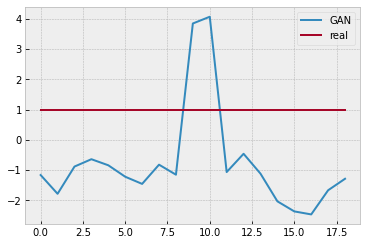

Batch_no: 191500  Epoch: 61


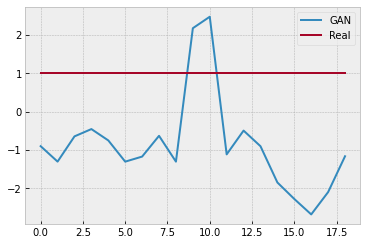

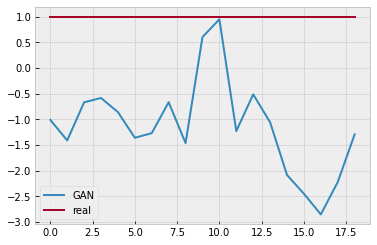

Batch_no: 192000  Epoch: 61


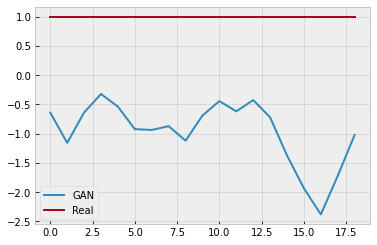

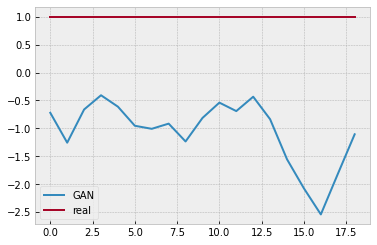

Batch_no: 192500  Epoch: 61


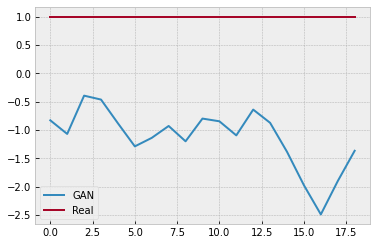

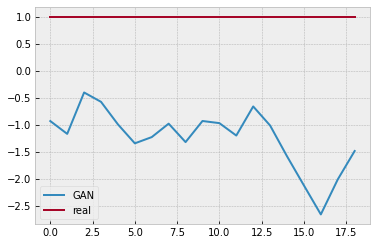

Batch_no: 193000  Epoch: 61


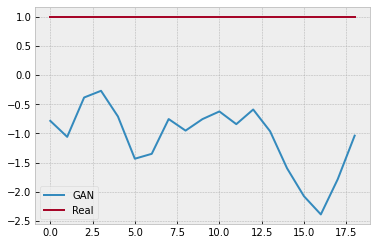

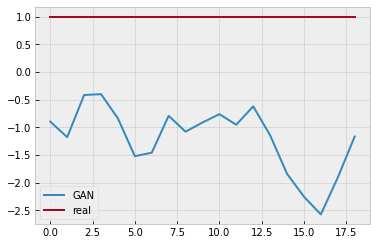

Batch_no: 193500  Epoch: 61


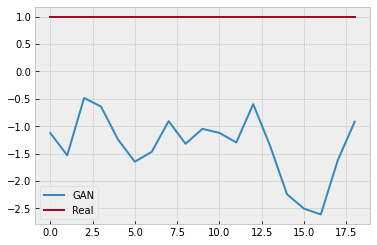

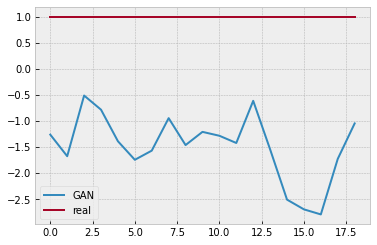

Batch_no: 194000  Epoch: 62


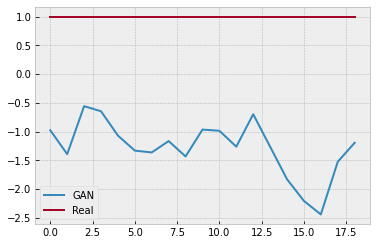

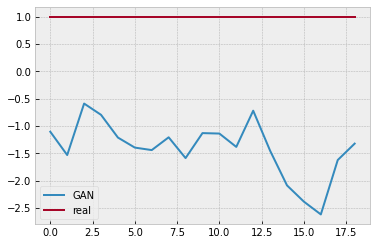

Batch_no: 194500  Epoch: 62


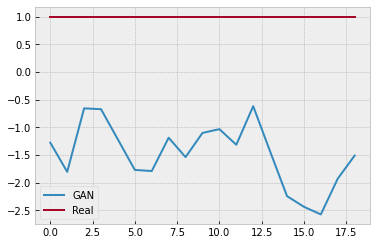

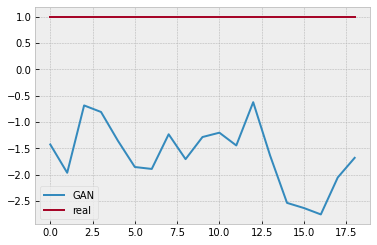

Batch_no: 195000  Epoch: 62


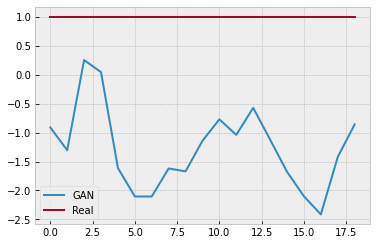

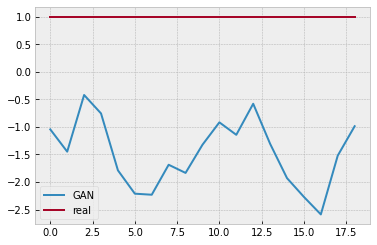

Batch_no: 195500  Epoch: 62


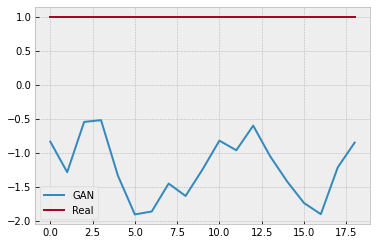

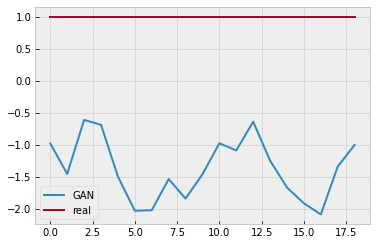

Batch_no: 196000  Epoch: 62


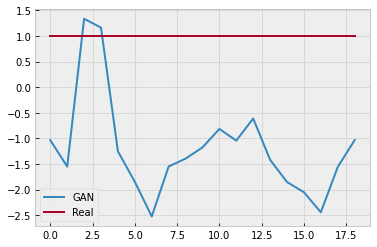

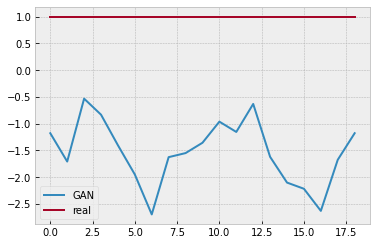

Batch_no: 196500  Epoch: 62


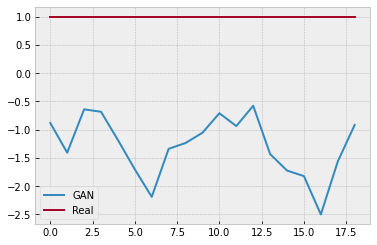

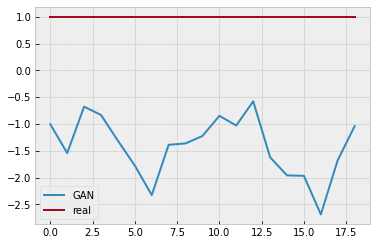

Batch_no: 197000  Epoch: 63


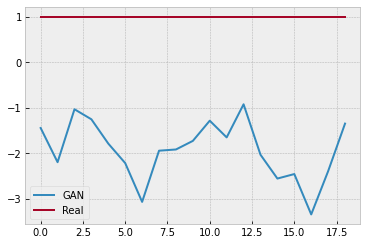

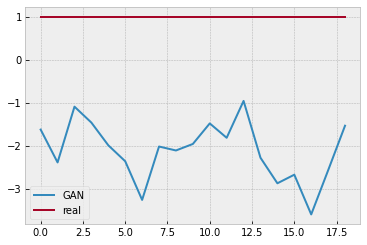

Batch_no: 197500  Epoch: 63


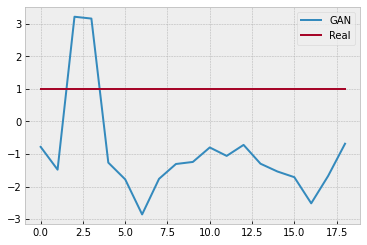

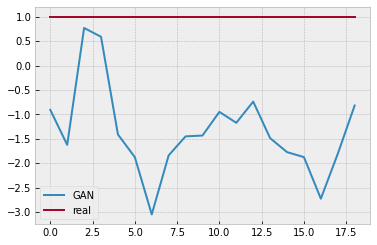

Batch_no: 198000  Epoch: 63


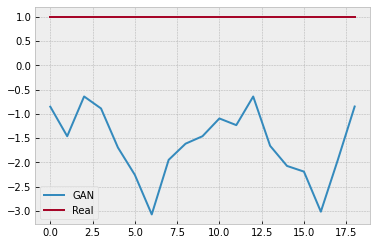

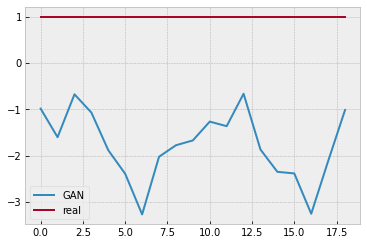

Batch_no: 198500  Epoch: 63


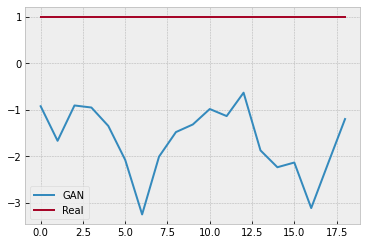

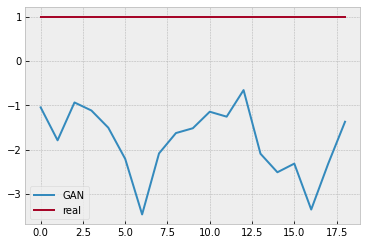

Batch_no: 199000  Epoch: 63


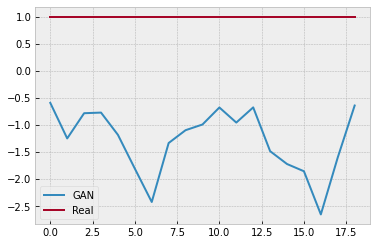

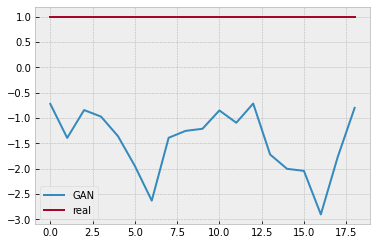

Batch_no: 199500  Epoch: 63


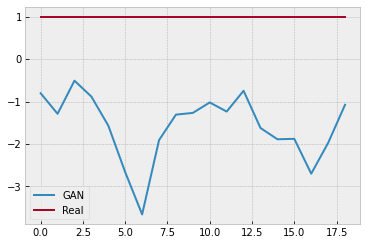

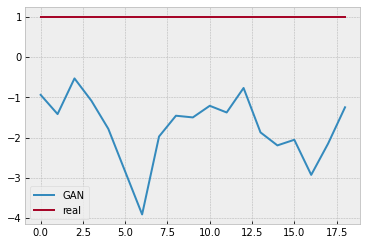

Batch_no: 200000  Epoch: 64


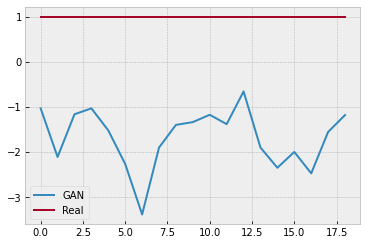

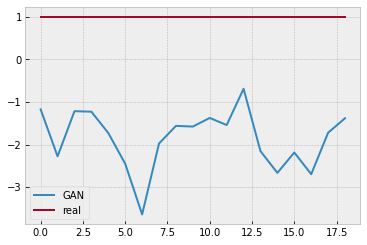

Batch_no: 200500  Epoch: 64


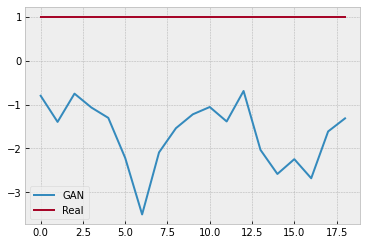

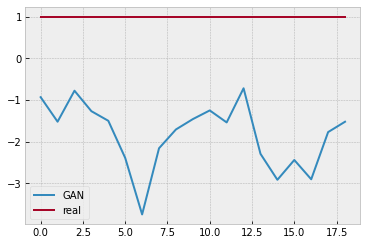

Batch_no: 201000  Epoch: 64


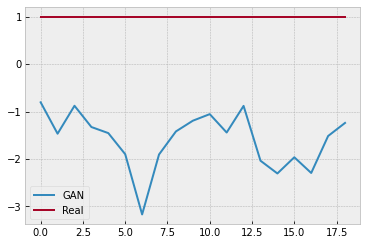

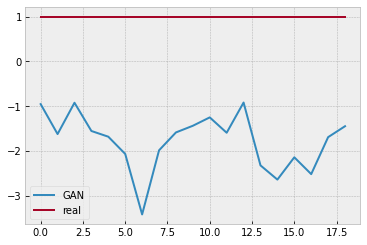

Batch_no: 201500  Epoch: 64


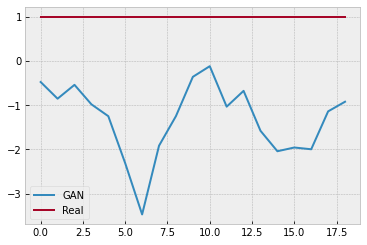

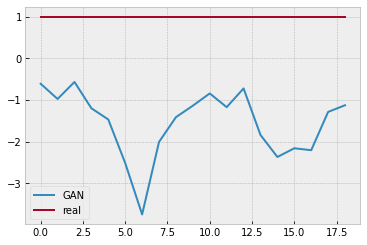

Batch_no: 202000  Epoch: 64


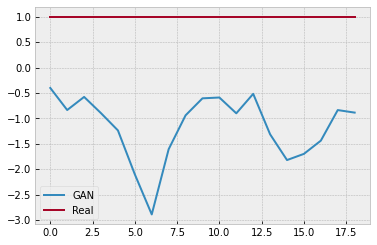

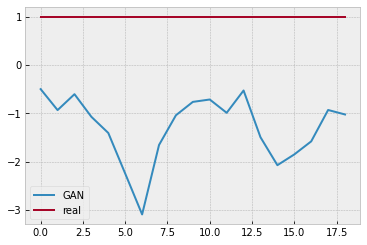

Batch_no: 202500  Epoch: 64


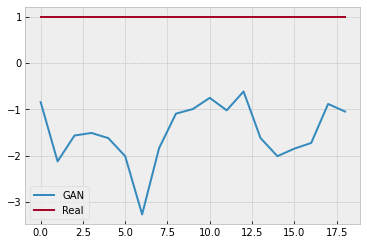

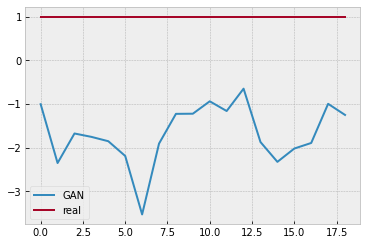

Batch_no: 203000  Epoch: 65


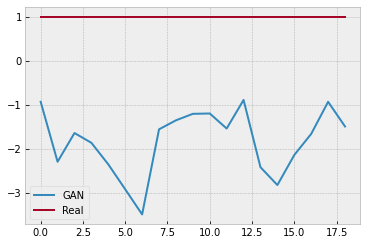

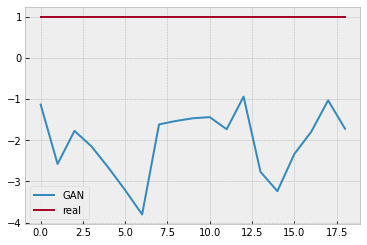

Batch_no: 203500  Epoch: 65


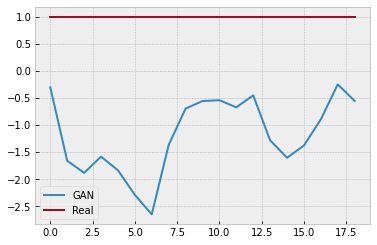

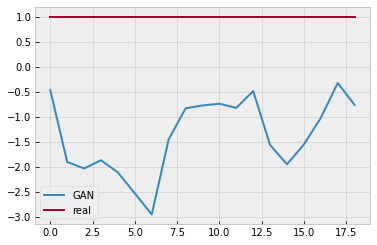

Batch_no: 204000  Epoch: 65


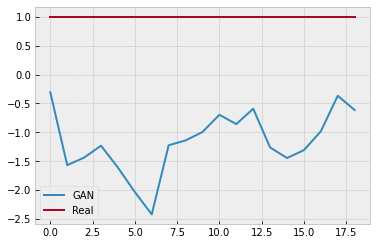

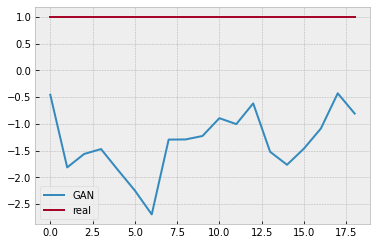

Batch_no: 204500  Epoch: 65


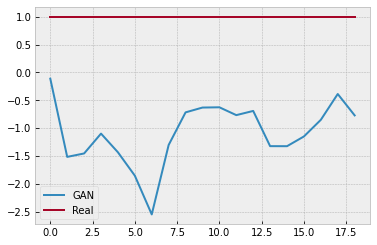

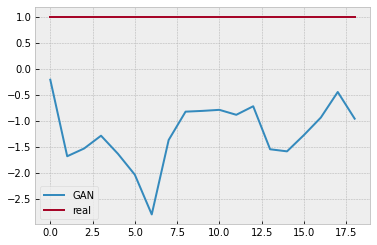

Batch_no: 205000  Epoch: 65


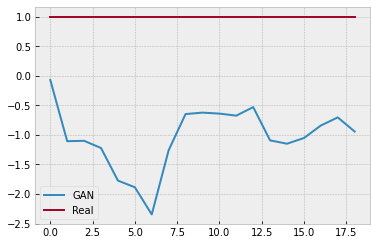

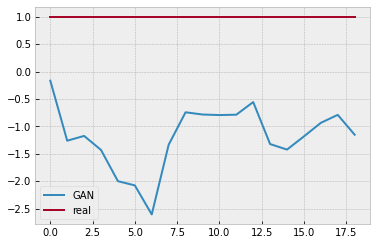

Batch_no: 205500  Epoch: 65


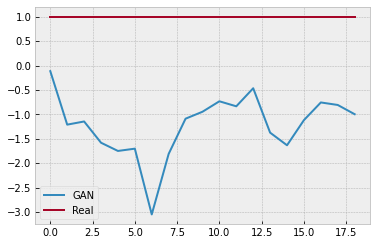

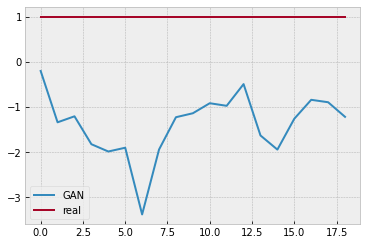

Batch_no: 206000  Epoch: 65


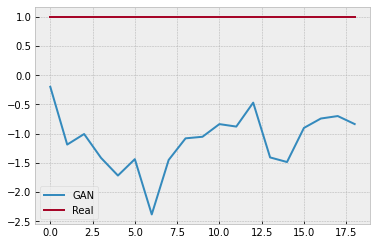

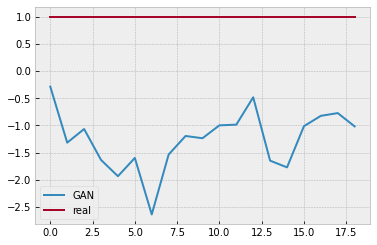

Batch_no: 206500  Epoch: 66


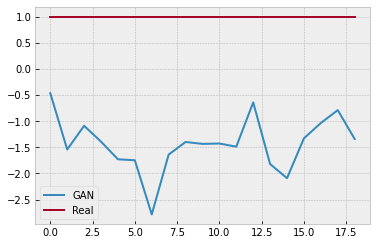

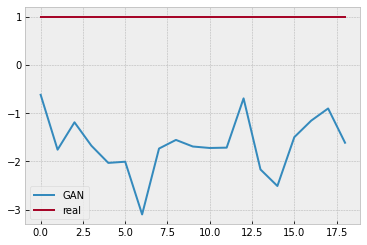

Batch_no: 207000  Epoch: 66


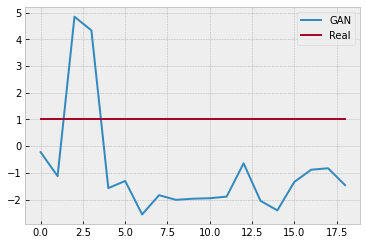

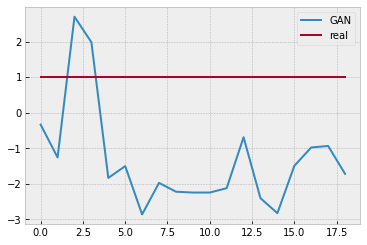

Batch_no: 207500  Epoch: 66


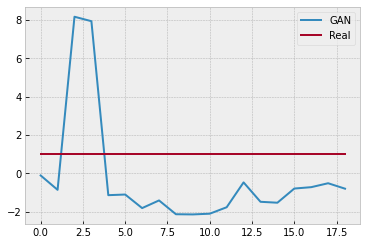

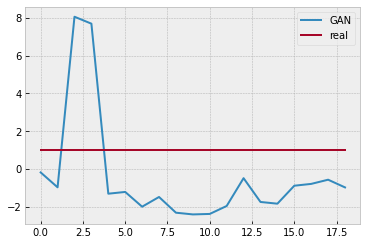

Batch_no: 208000  Epoch: 66


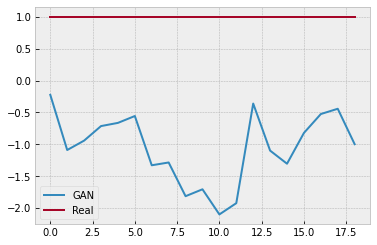

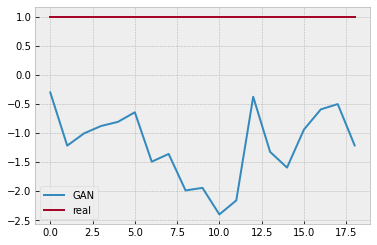

Batch_no: 208500  Epoch: 66


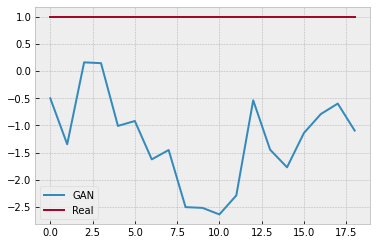

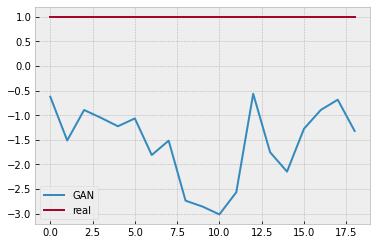

Batch_no: 209000  Epoch: 66


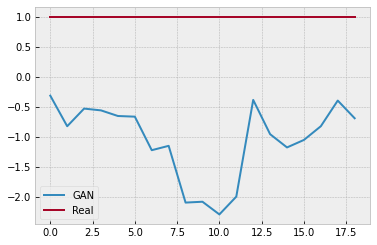

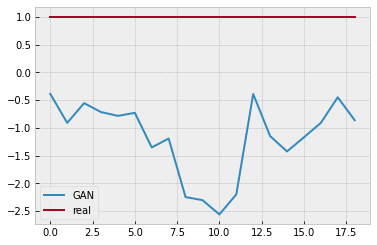

Batch_no: 209500  Epoch: 67


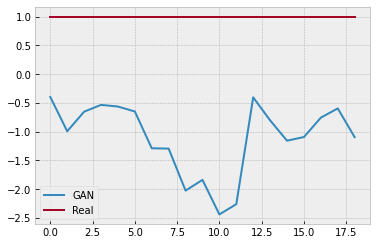

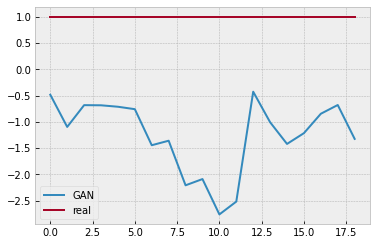

Batch_no: 210000  Epoch: 67


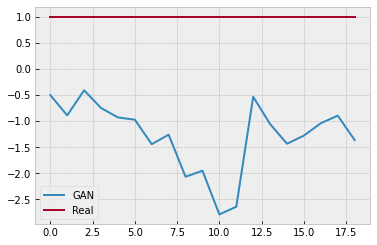

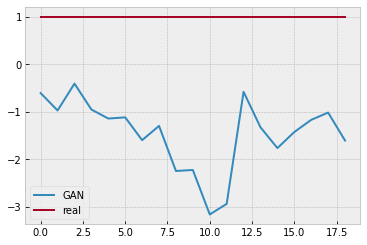

Batch_no: 210500  Epoch: 67


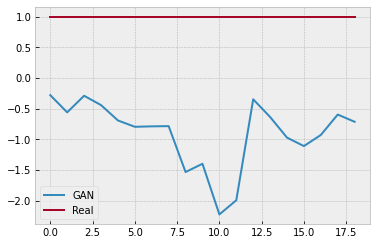

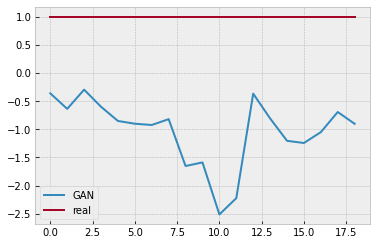

Batch_no: 211000  Epoch: 67


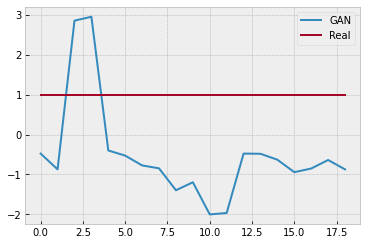

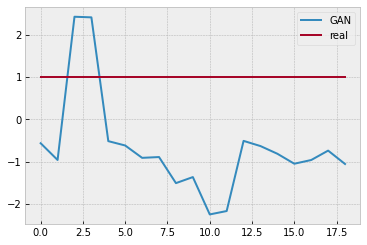

Batch_no: 211500  Epoch: 67


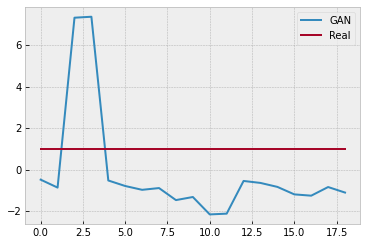

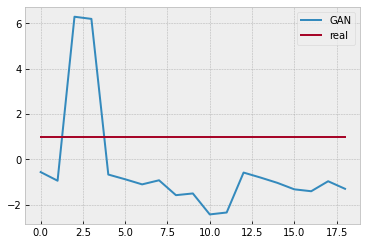

Batch_no: 212000  Epoch: 67


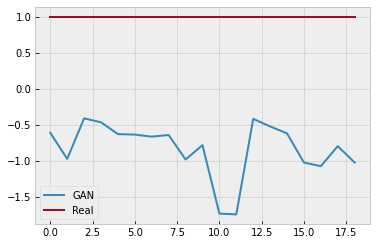

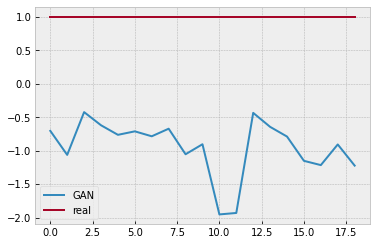

Batch_no: 212500  Epoch: 68


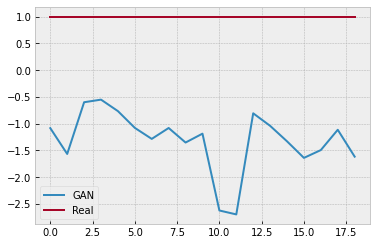

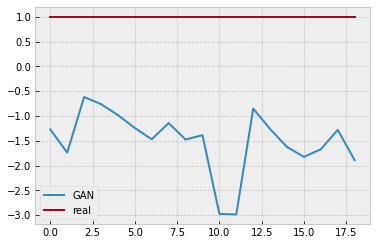

Batch_no: 213000  Epoch: 68


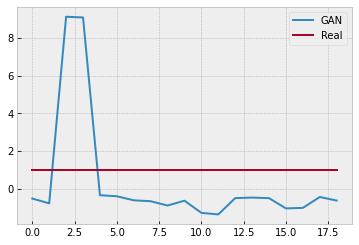

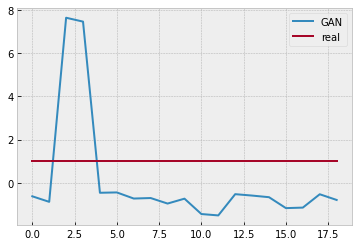

Batch_no: 213500  Epoch: 68


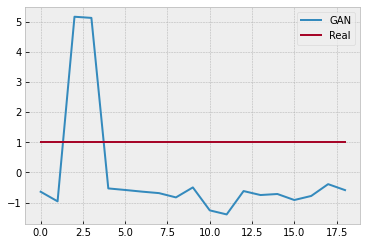

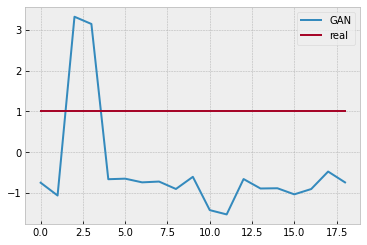

Batch_no: 214000  Epoch: 68


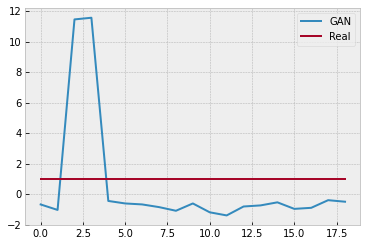

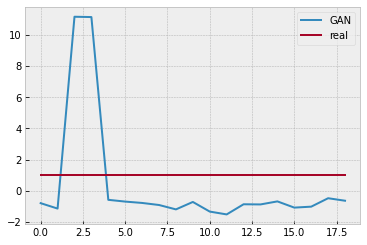

Batch_no: 214500  Epoch: 68


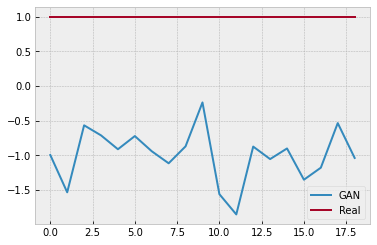

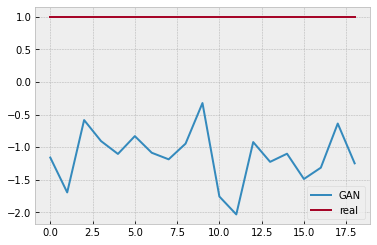

Batch_no: 215000  Epoch: 68


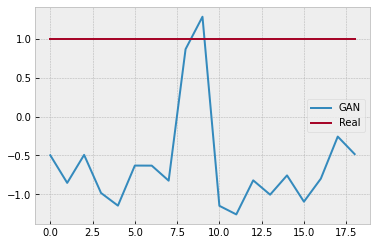

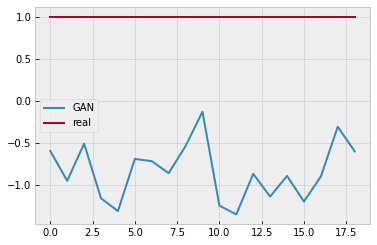

Batch_no: 215500  Epoch: 69


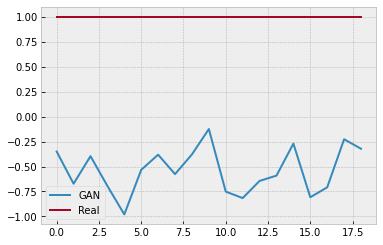

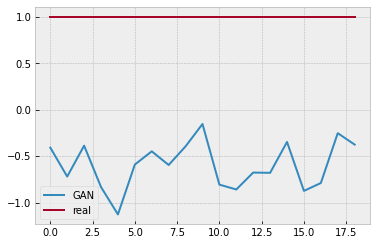

Batch_no: 216000  Epoch: 69


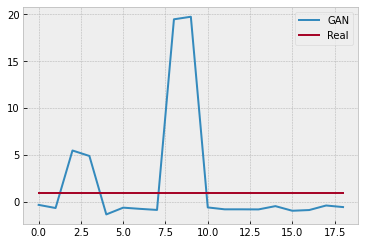

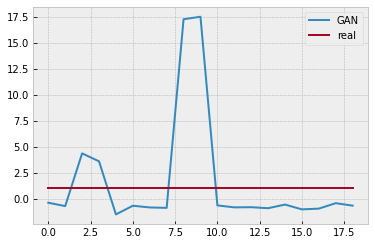

Batch_no: 216500  Epoch: 69


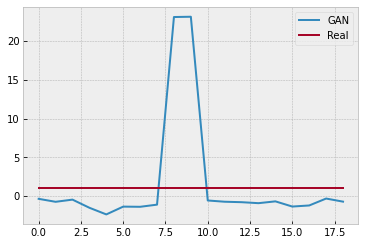

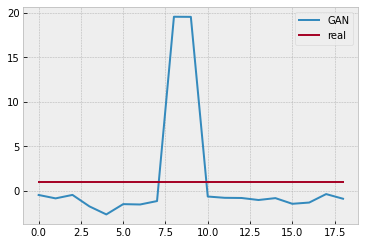

Batch_no: 217000  Epoch: 69


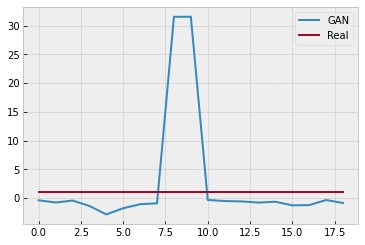

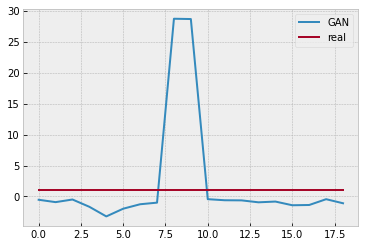

Batch_no: 217500  Epoch: 69


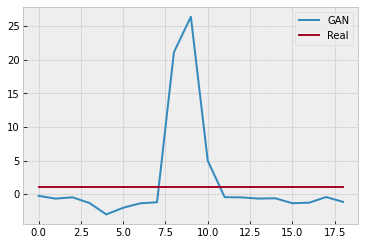

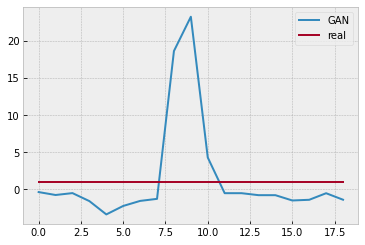

Batch_no: 218000  Epoch: 69


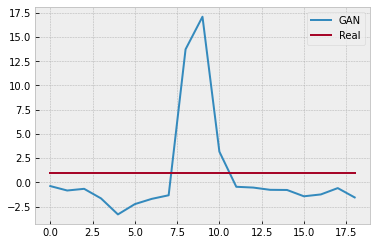

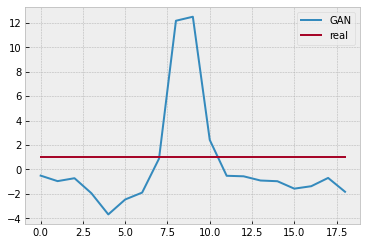

Batch_no: 218500  Epoch: 69


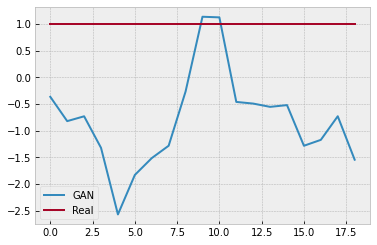

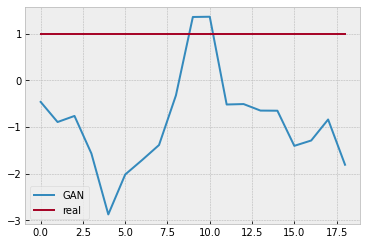

Batch_no: 219000  Epoch: 70


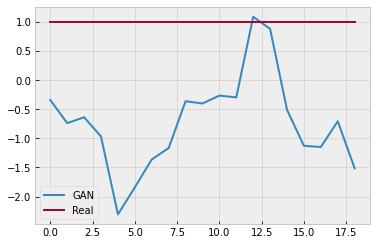

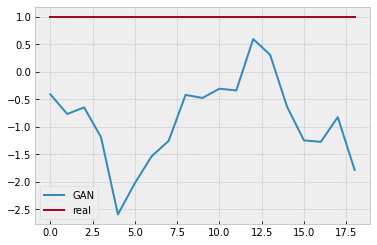

Batch_no: 219500  Epoch: 70


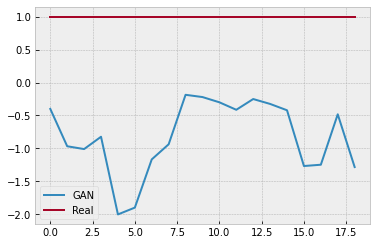

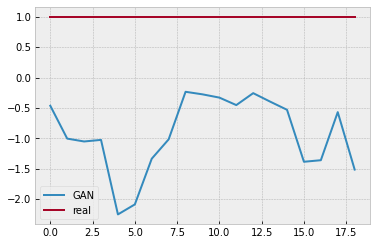

Batch_no: 220000  Epoch: 70


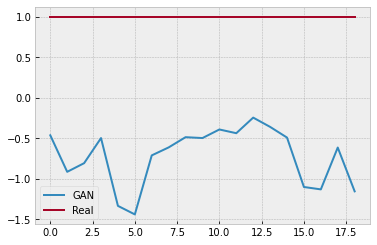

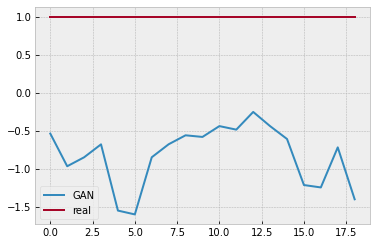

Batch_no: 220500  Epoch: 70


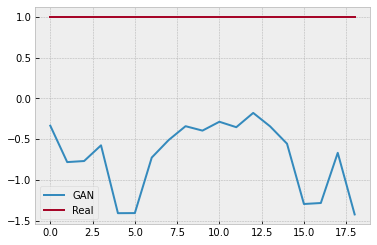

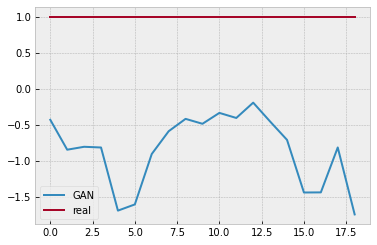

Batch_no: 221000  Epoch: 70


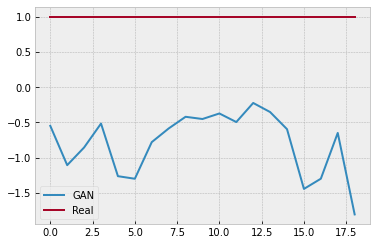

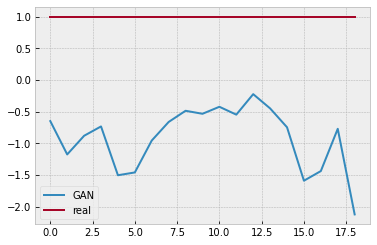

Batch_no: 221500  Epoch: 70


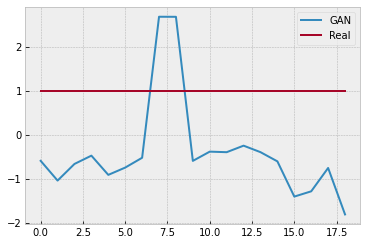

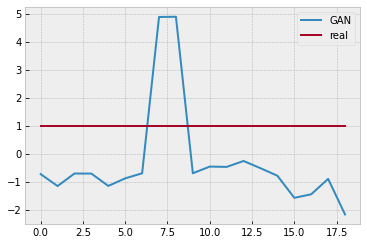

Batch_no: 222000  Epoch: 71


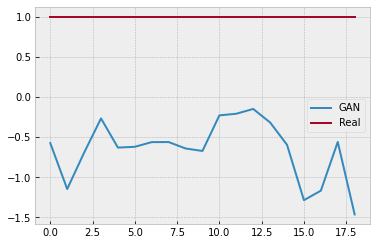

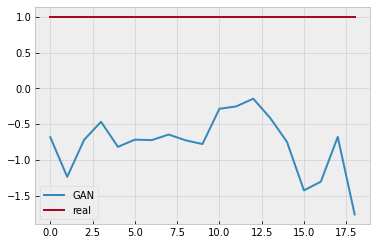

Batch_no: 222500  Epoch: 71


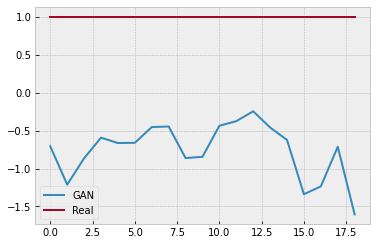

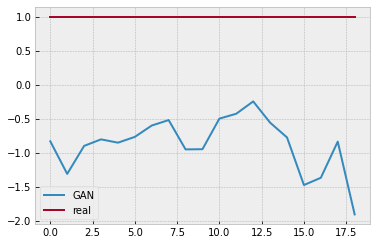

Batch_no: 223000  Epoch: 71


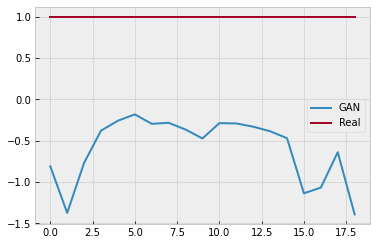

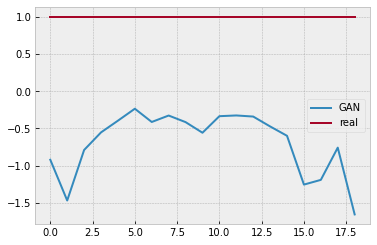

Batch_no: 223500  Epoch: 71


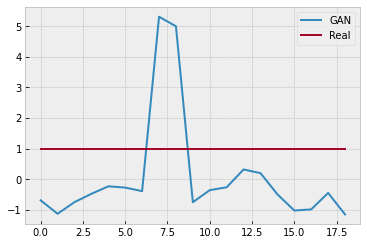

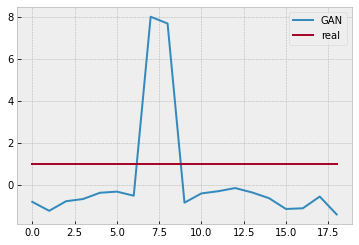

Batch_no: 224000  Epoch: 71


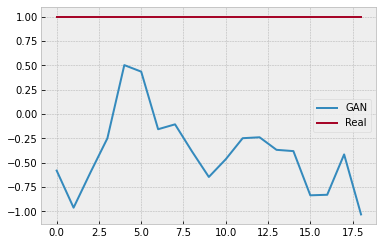

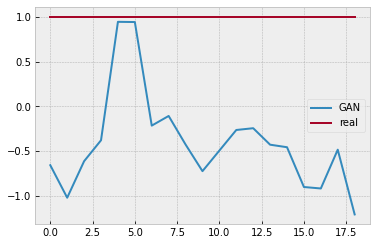

Batch_no: 224500  Epoch: 71


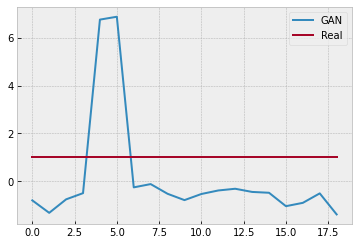

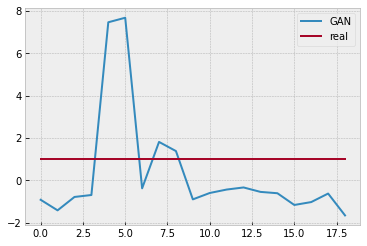

Batch_no: 225000  Epoch: 72


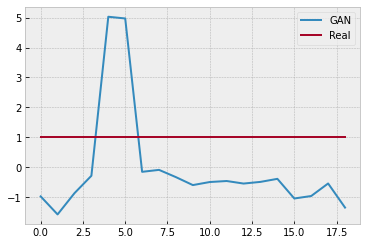

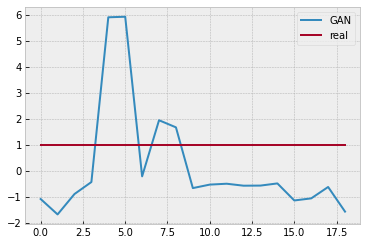

Batch_no: 225500  Epoch: 72


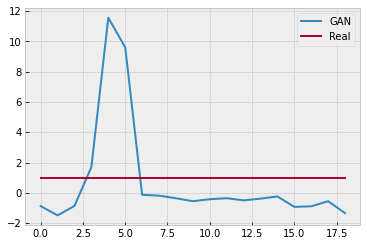

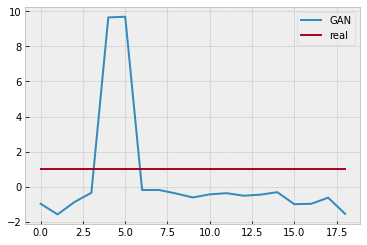

Batch_no: 226000  Epoch: 72


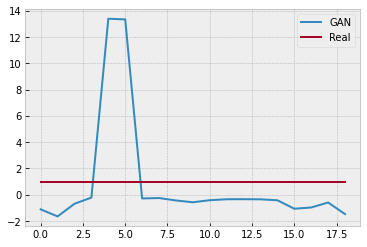

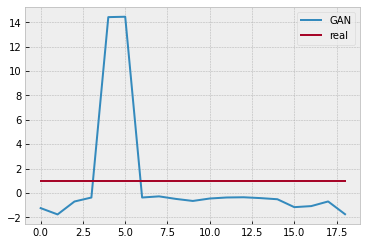

Batch_no: 226500  Epoch: 72


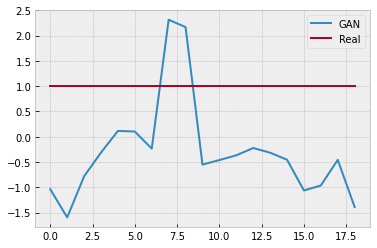

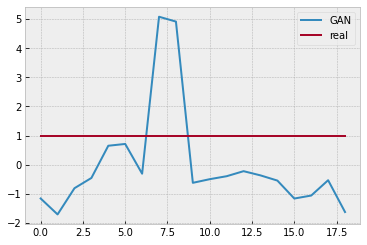

Batch_no: 227000  Epoch: 72


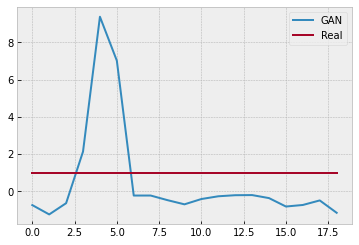

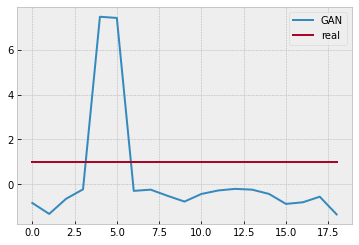

Batch_no: 227500  Epoch: 72


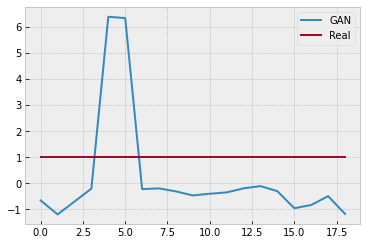

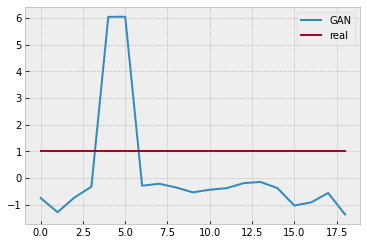

Batch_no: 228000  Epoch: 73


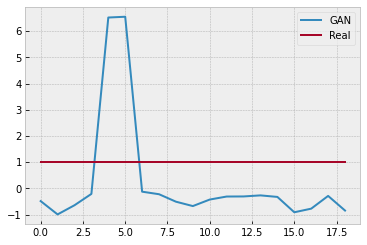

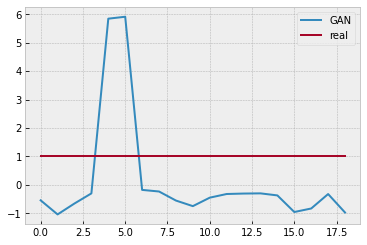

Batch_no: 228500  Epoch: 73


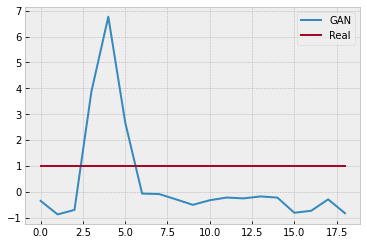

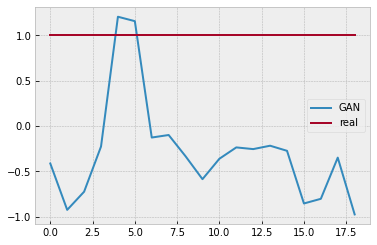

Batch_no: 229000  Epoch: 73


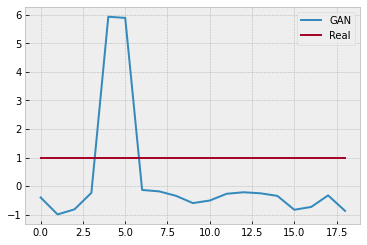

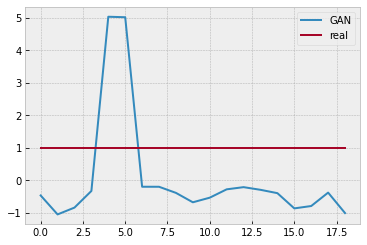

Batch_no: 229500  Epoch: 73


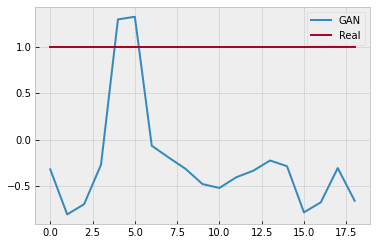

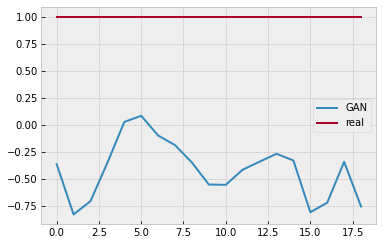

Batch_no: 230000  Epoch: 73


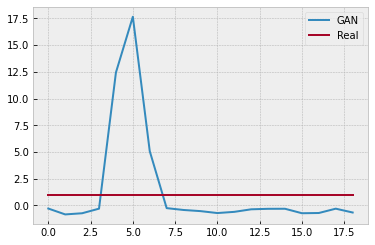

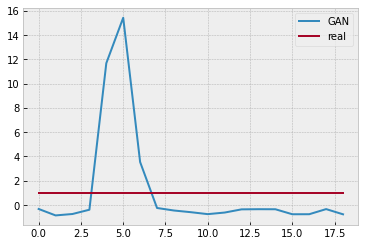

Batch_no: 230500  Epoch: 73


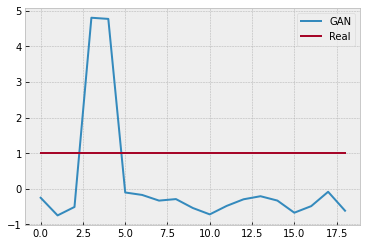

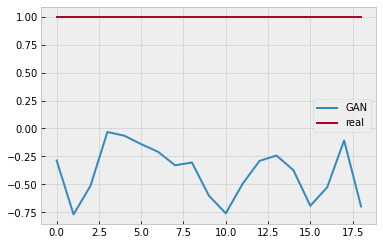

Batch_no: 231000  Epoch: 73


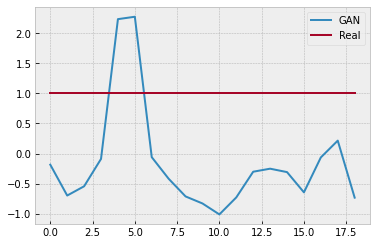

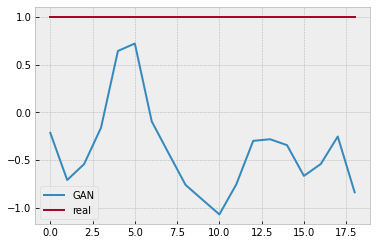

Batch_no: 231500  Epoch: 74


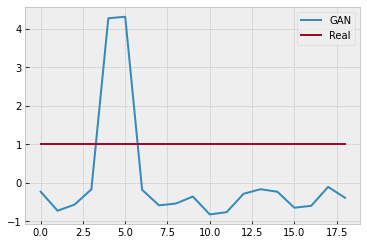

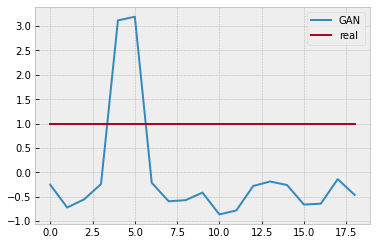

Batch_no: 232000  Epoch: 74


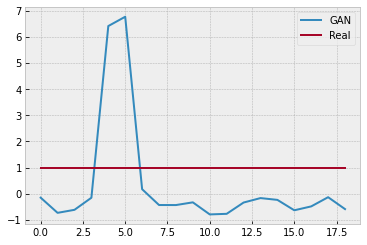

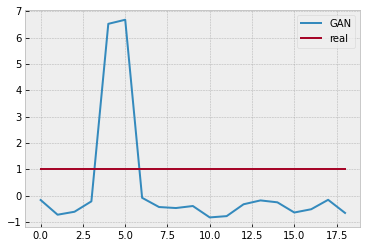

Batch_no: 232500  Epoch: 74


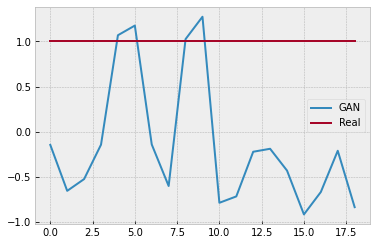

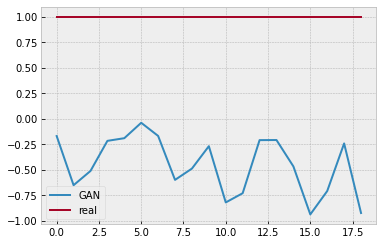

Batch_no: 233000  Epoch: 74


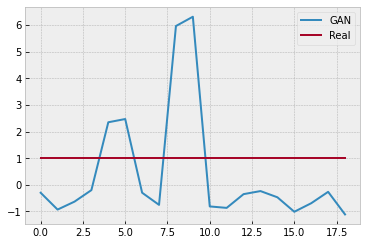

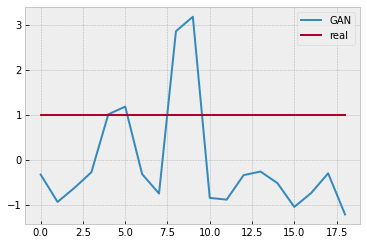

Batch_no: 233500  Epoch: 74


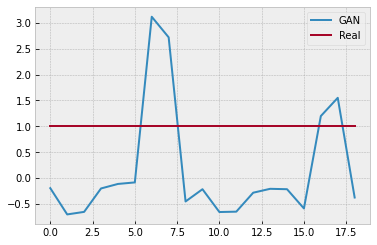

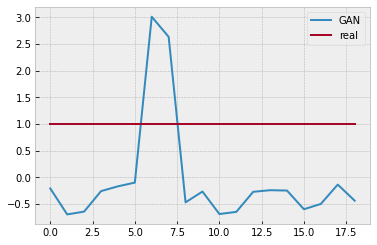

Batch_no: 234000  Epoch: 74


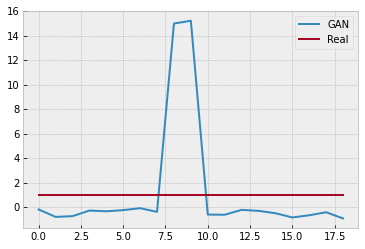

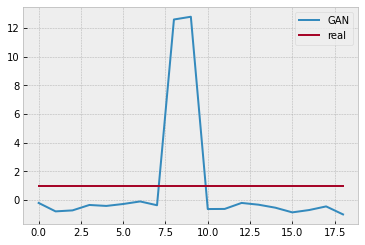

Batch_no: 234500  Epoch: 75


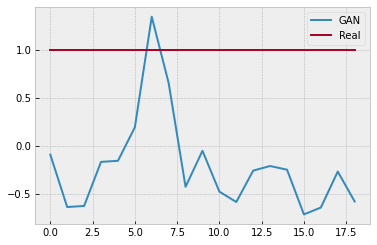

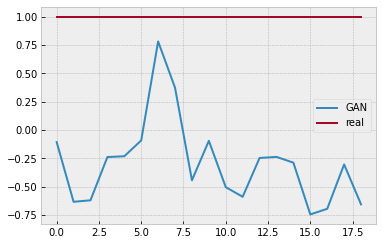

Batch_no: 235000  Epoch: 75


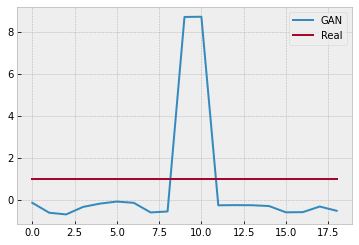

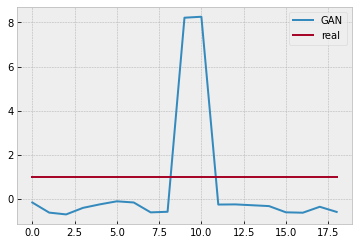

Batch_no: 235500  Epoch: 75


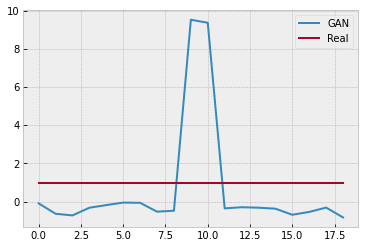

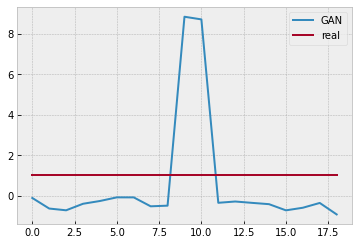

Batch_no: 236000  Epoch: 75


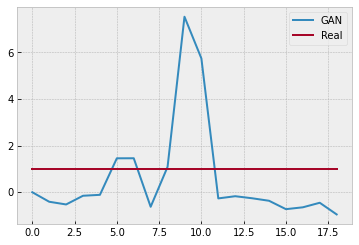

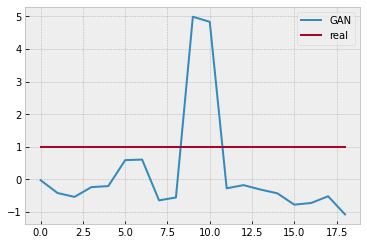

Batch_no: 236500  Epoch: 75


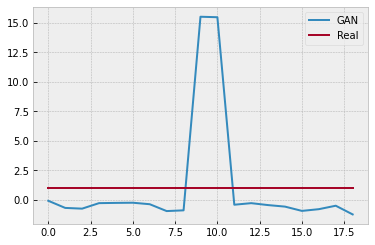

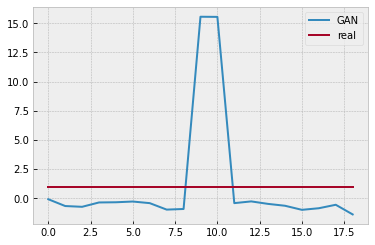

Batch_no: 237000  Epoch: 75


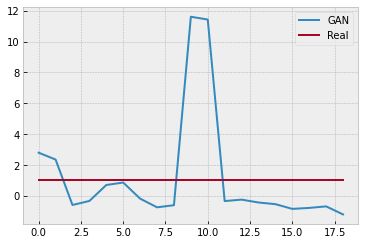

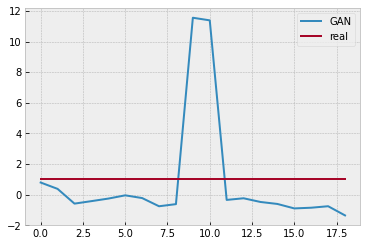

Batch_no: 237500  Epoch: 76


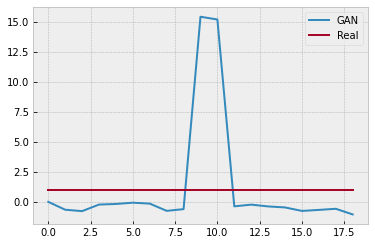

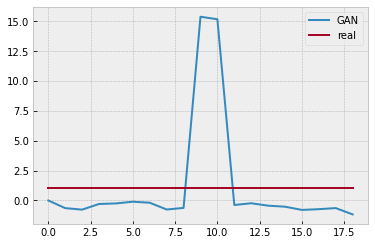

Batch_no: 238000  Epoch: 76


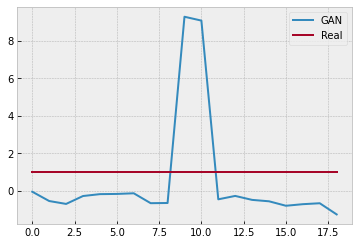

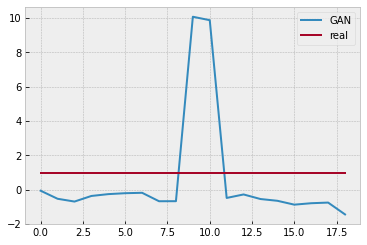

Batch_no: 238500  Epoch: 76


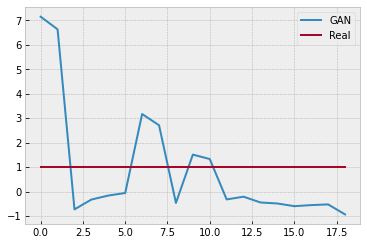

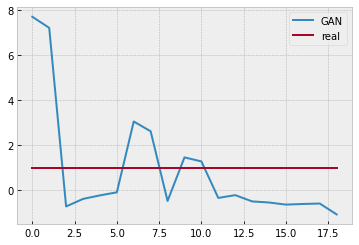

Batch_no: 239000  Epoch: 76


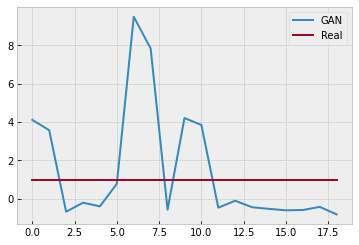

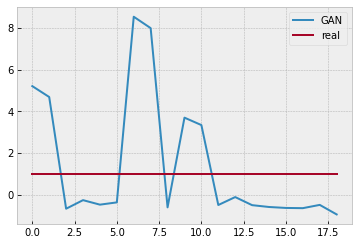

Batch_no: 239500  Epoch: 76


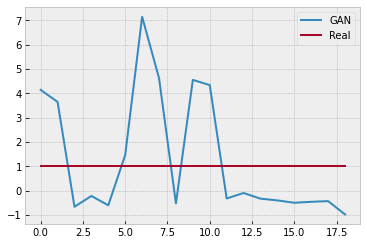

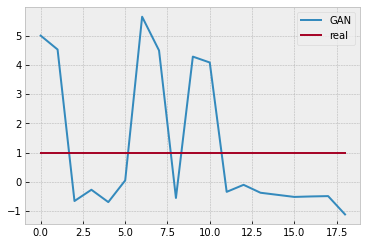

Batch_no: 240000  Epoch: 76


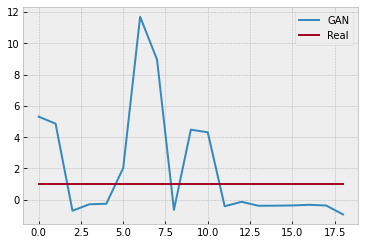

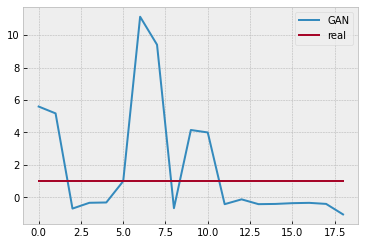

Batch_no: 240500  Epoch: 77


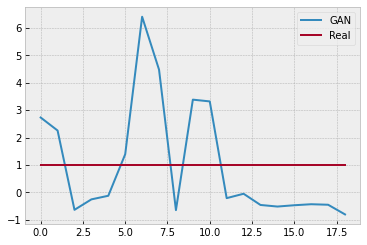

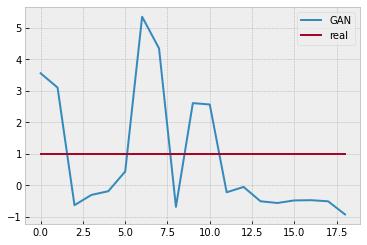

Batch_no: 241000  Epoch: 77


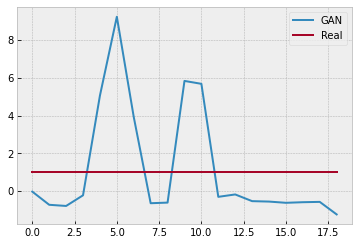

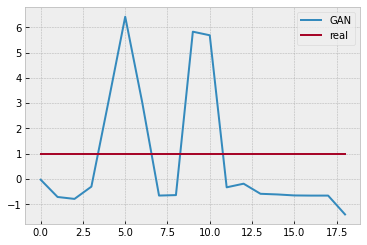

Batch_no: 241500  Epoch: 77


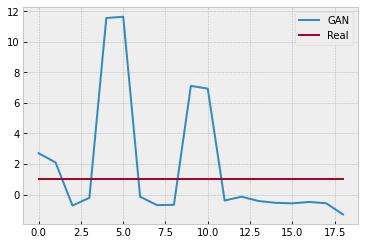

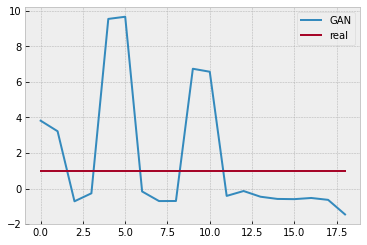

Batch_no: 242000  Epoch: 77


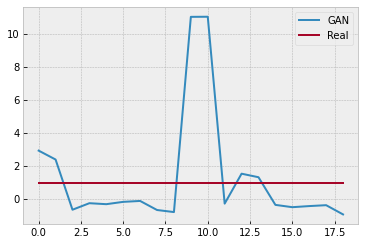

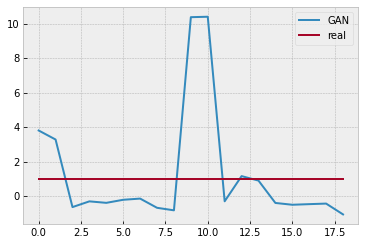

Batch_no: 242500  Epoch: 77


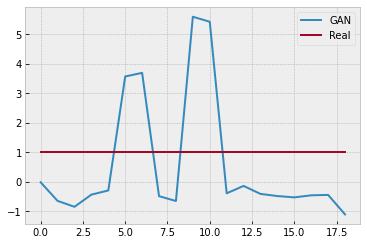

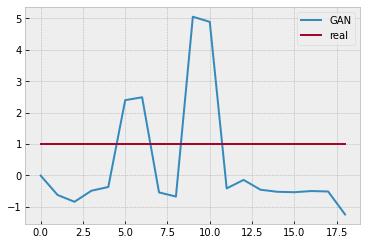

Batch_no: 243000  Epoch: 77


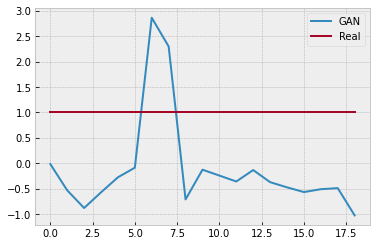

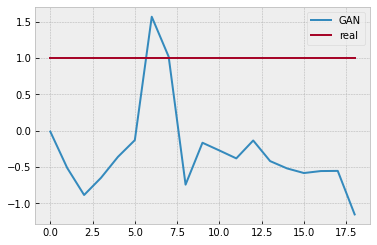

Batch_no: 243500  Epoch: 77


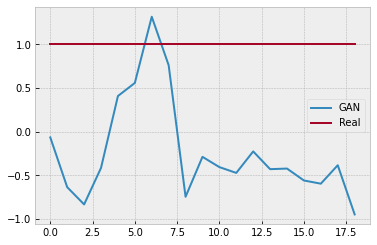

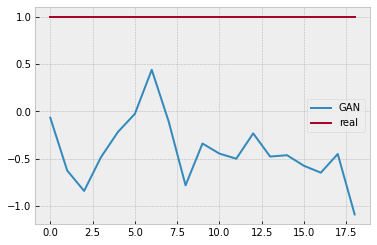

Batch_no: 244000  Epoch: 78


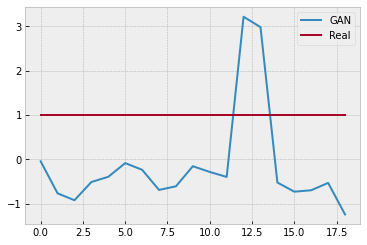

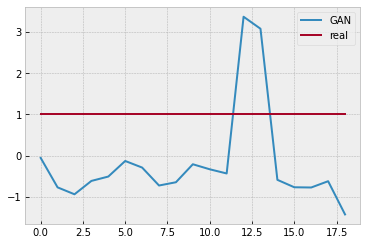

Batch_no: 244500  Epoch: 78


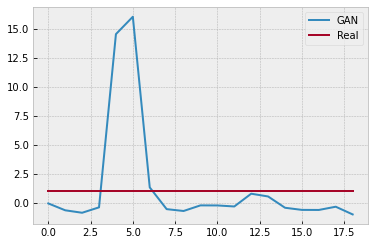

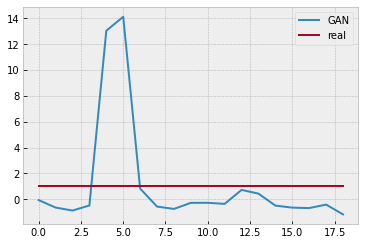

Batch_no: 245000  Epoch: 78


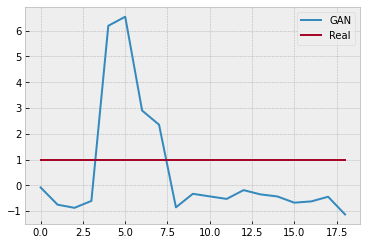

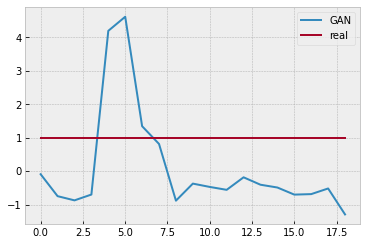

Batch_no: 245500  Epoch: 78


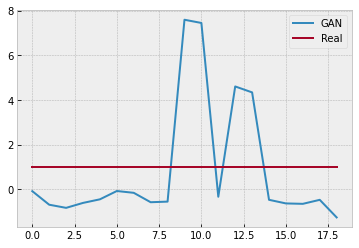

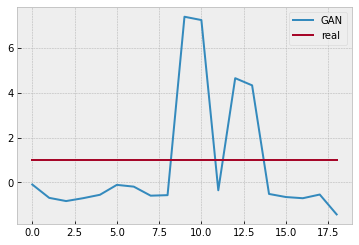

Batch_no: 246000  Epoch: 78


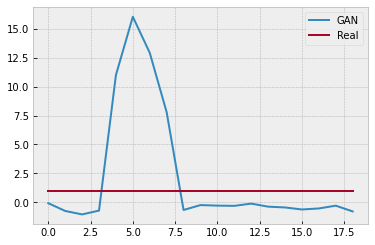

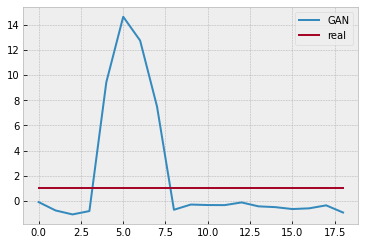

Batch_no: 246500  Epoch: 78


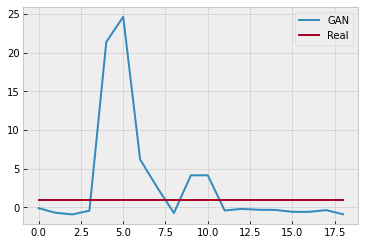

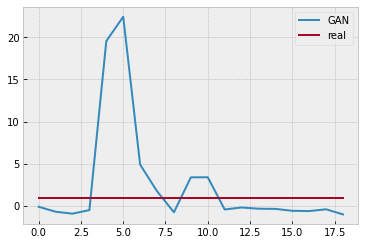

Batch_no: 247000  Epoch: 79


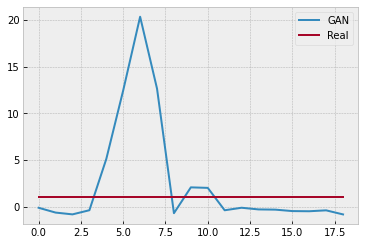

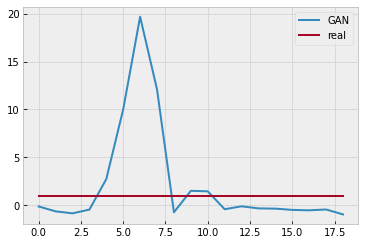

Batch_no: 247500  Epoch: 79


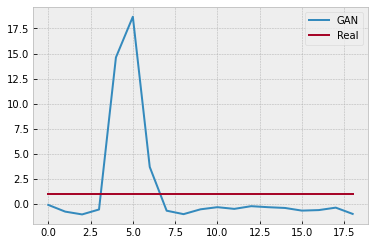

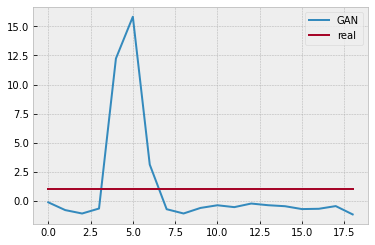

Batch_no: 248000  Epoch: 79


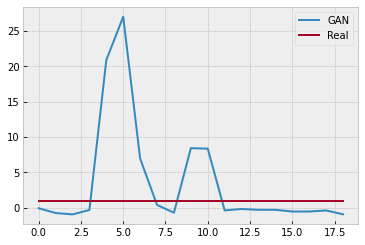

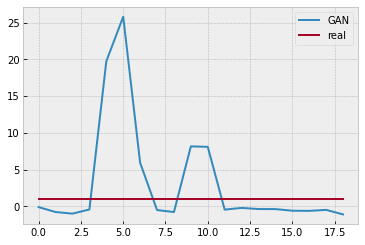

Batch_no: 248500  Epoch: 79


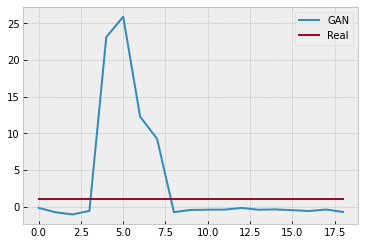

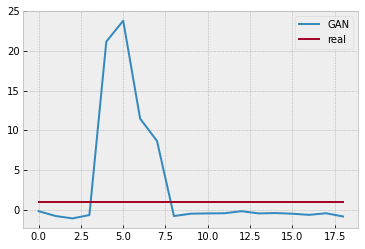

Batch_no: 249000  Epoch: 79


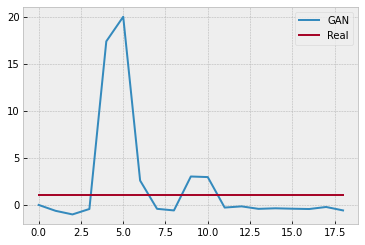

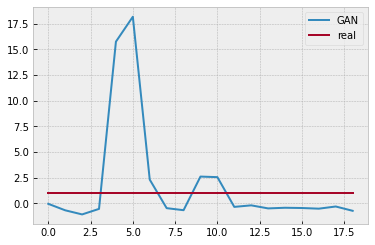

Batch_no: 249500  Epoch: 79


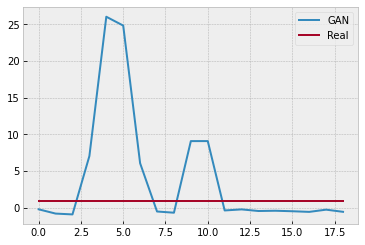

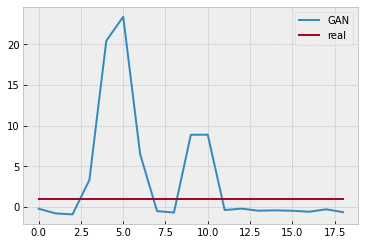

Batch_no: 250000  Epoch: 80


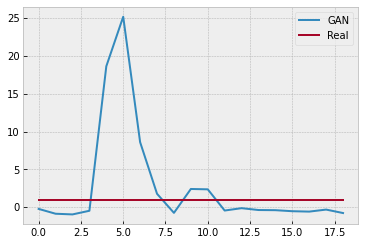

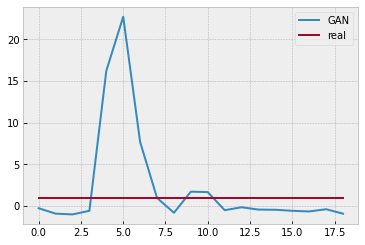

Batch_no: 250500  Epoch: 80


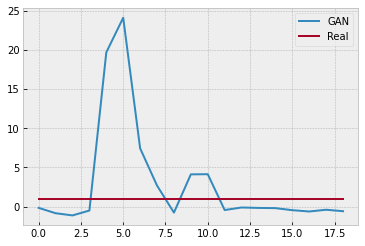

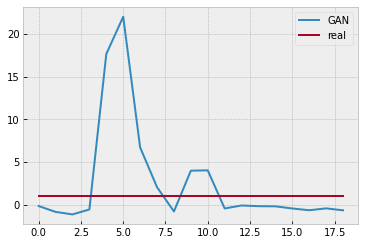

Batch_no: 251000  Epoch: 80


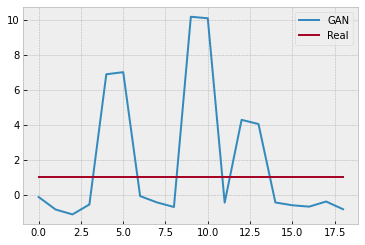

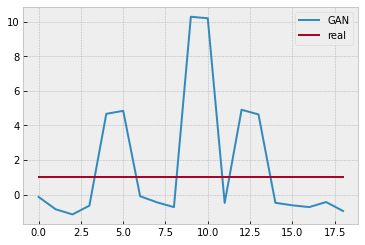

Batch_no: 251500  Epoch: 80


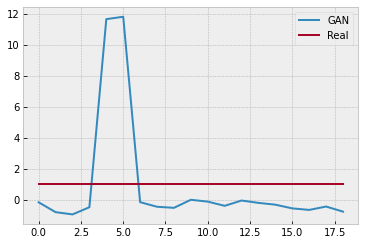

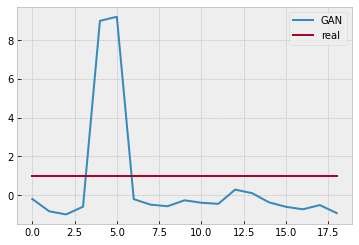

Batch_no: 252000  Epoch: 80


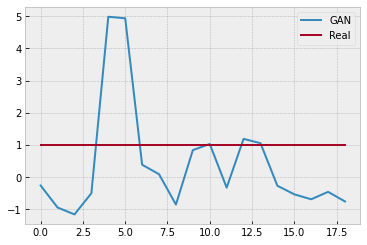

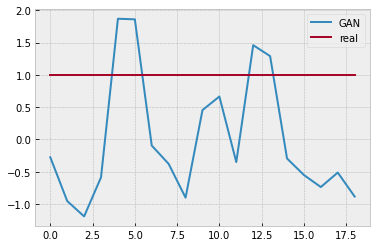

Batch_no: 252500  Epoch: 80


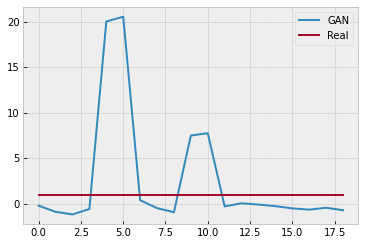

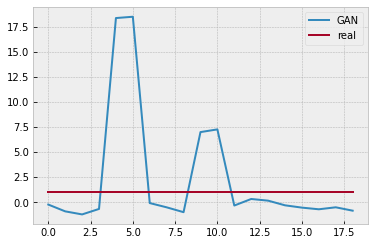

Batch_no: 253000  Epoch: 81


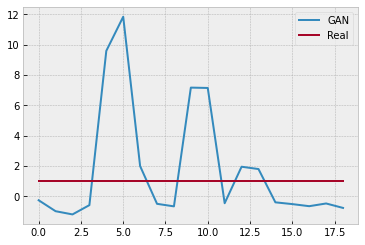

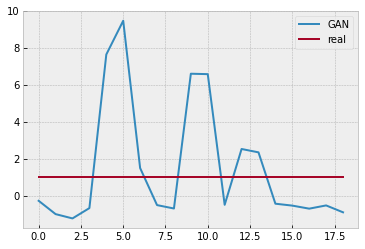

Batch_no: 253500  Epoch: 81


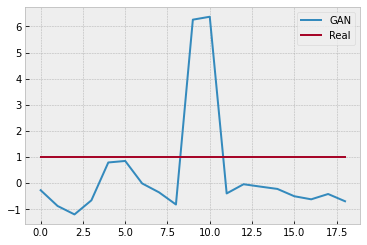

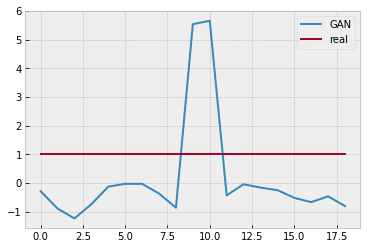

Batch_no: 254000  Epoch: 81


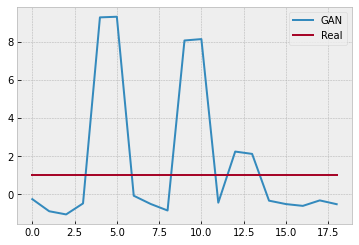

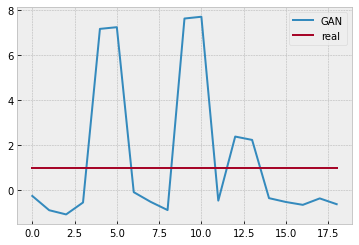

Batch_no: 254500  Epoch: 81


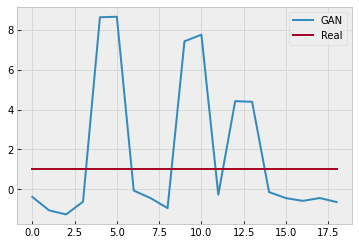

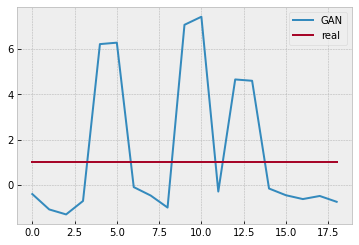

Batch_no: 255000  Epoch: 81


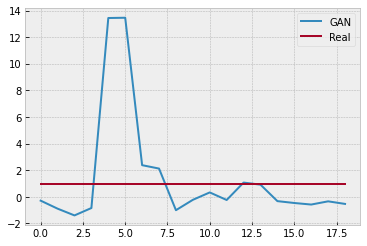

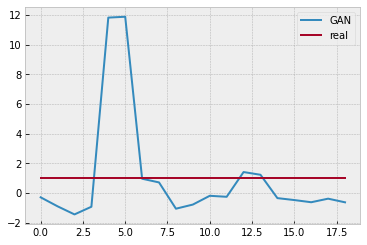

Batch_no: 255500  Epoch: 81


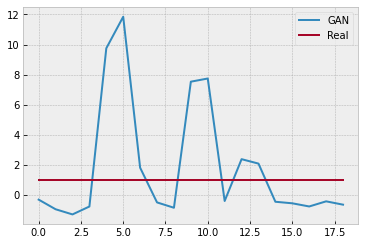

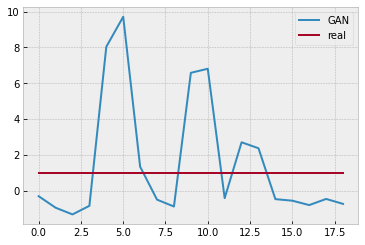

Batch_no: 256000  Epoch: 81


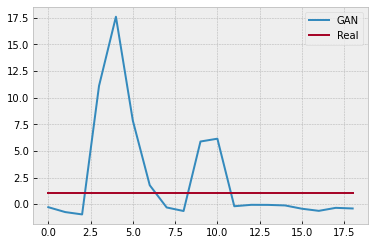

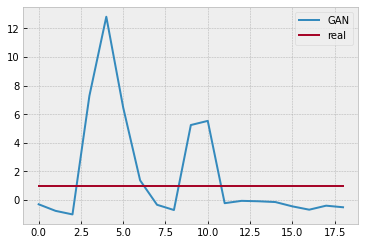

Batch_no: 256500  Epoch: 82


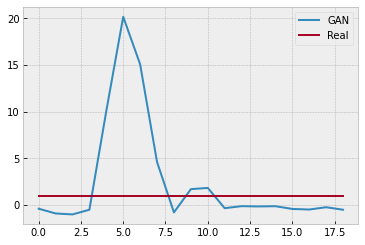

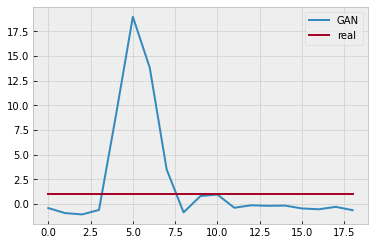

Batch_no: 257000  Epoch: 82


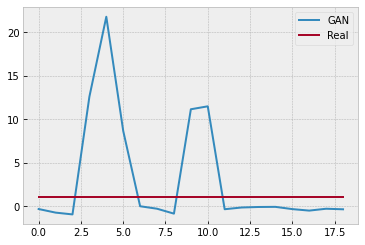

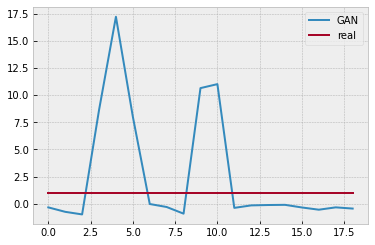

Batch_no: 257500  Epoch: 82


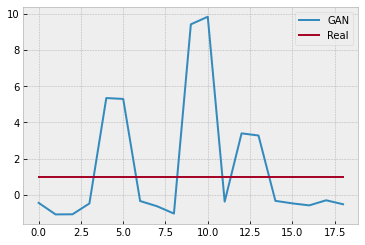

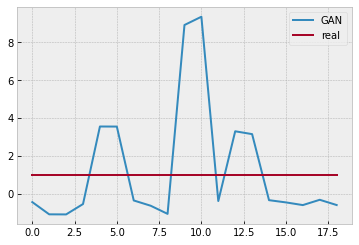

Batch_no: 258000  Epoch: 82


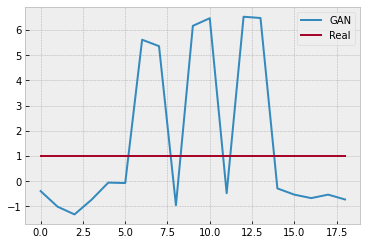

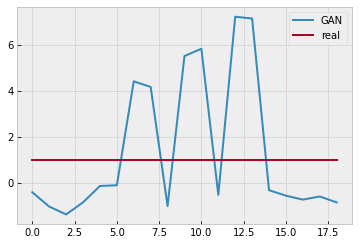

Batch_no: 258500  Epoch: 82


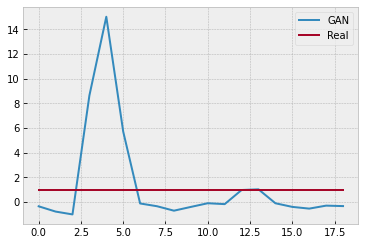

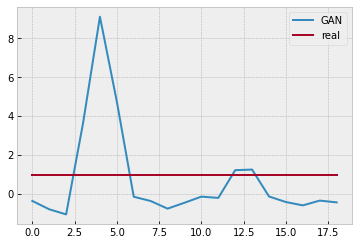

Batch_no: 259000  Epoch: 82


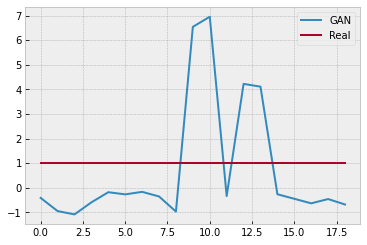

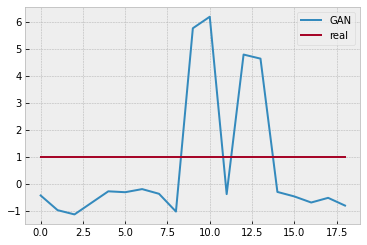

Batch_no: 259500  Epoch: 83


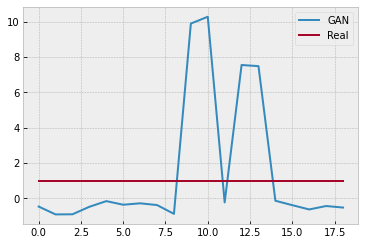

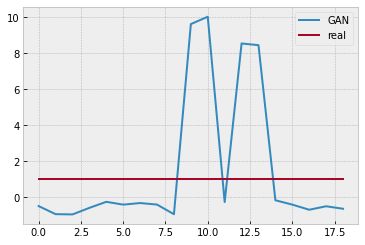

Batch_no: 260000  Epoch: 83


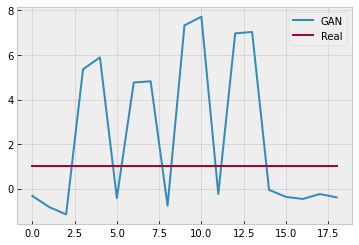

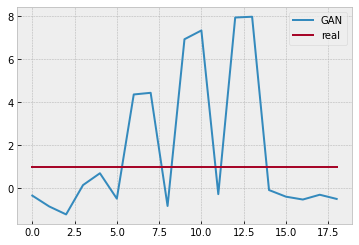

Batch_no: 260500  Epoch: 83


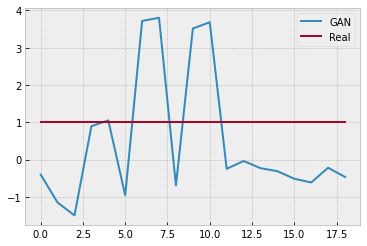

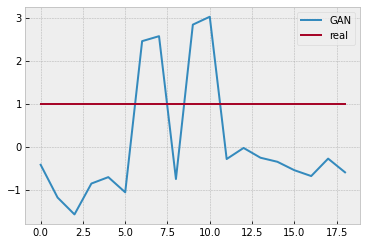

Batch_no: 261000  Epoch: 83


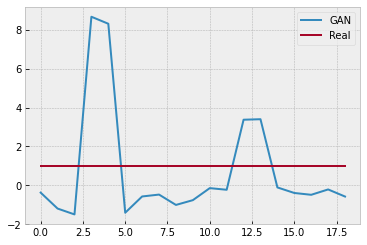

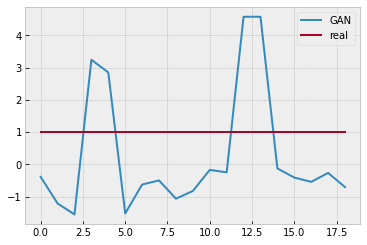

Batch_no: 261500  Epoch: 83


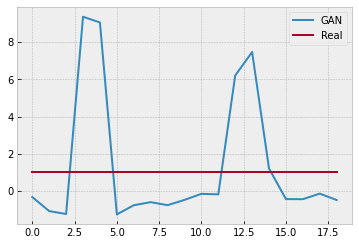

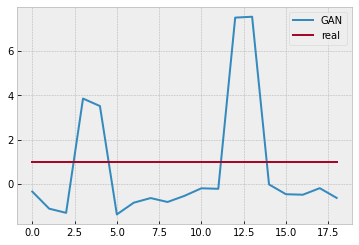

Batch_no: 262000  Epoch: 83


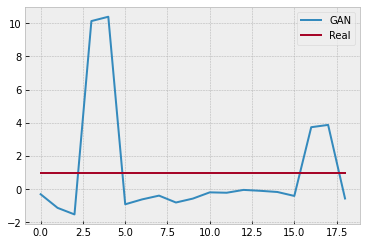

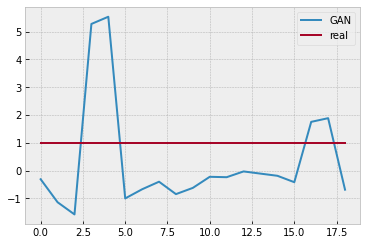

Batch_no: 262500  Epoch: 84


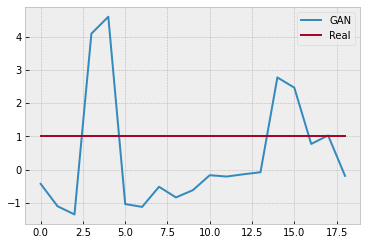

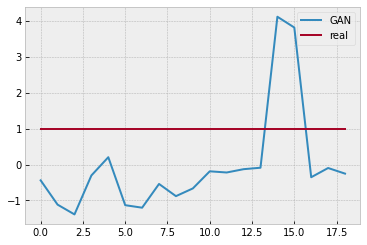

Batch_no: 263000  Epoch: 84


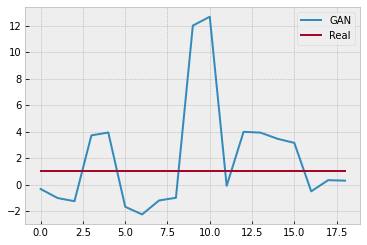

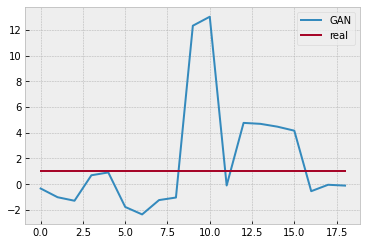

Batch_no: 263500  Epoch: 84


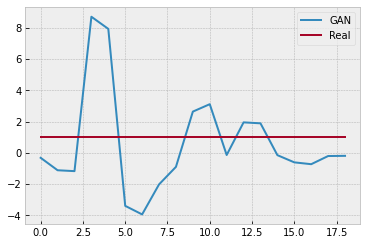

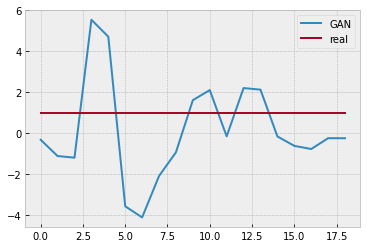

Batch_no: 264000  Epoch: 84


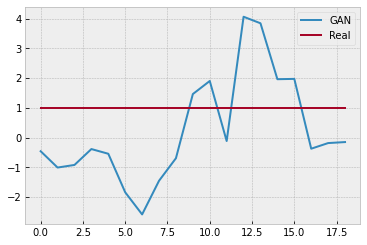

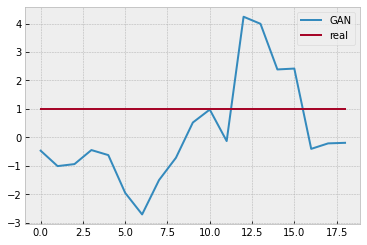

Batch_no: 264500  Epoch: 84


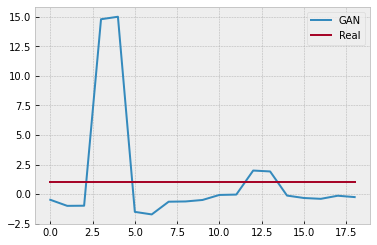

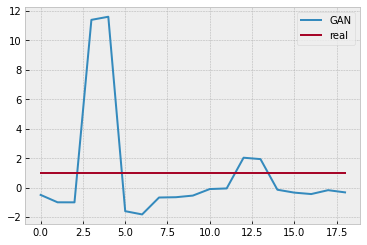

Batch_no: 265000  Epoch: 84


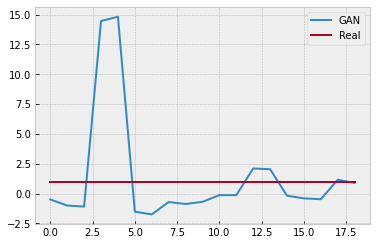

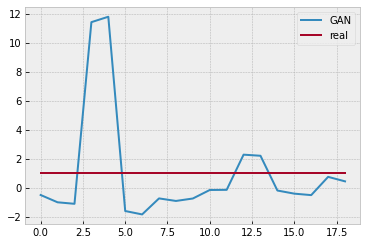

Batch_no: 265500  Epoch: 85


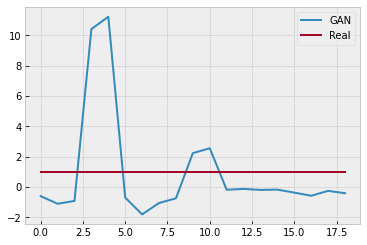

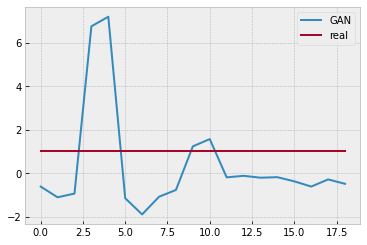

Batch_no: 266000  Epoch: 85


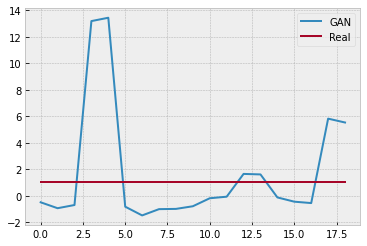

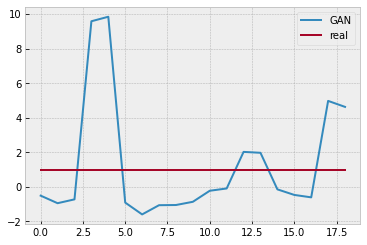

Batch_no: 266500  Epoch: 85


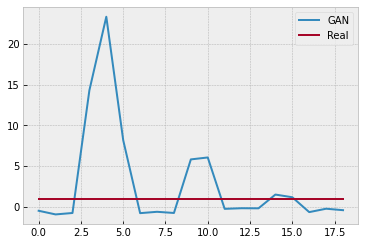

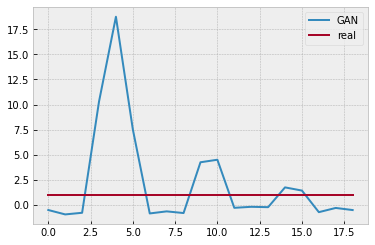

Batch_no: 267000  Epoch: 85


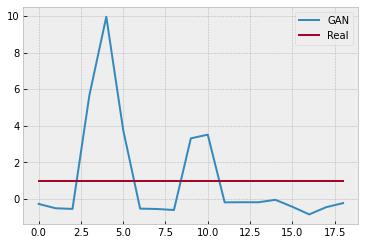

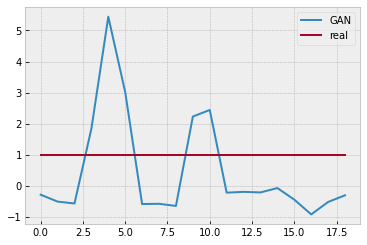

Batch_no: 267500  Epoch: 85


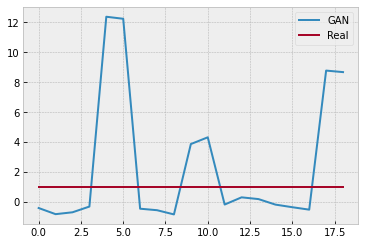

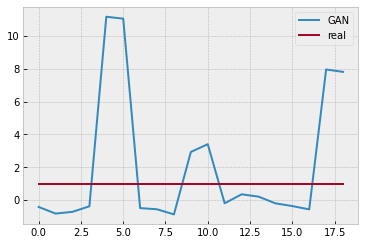

Batch_no: 268000  Epoch: 85


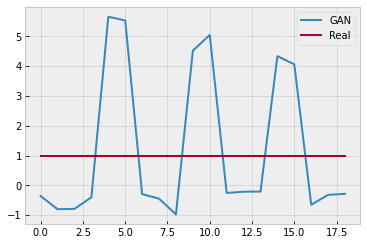

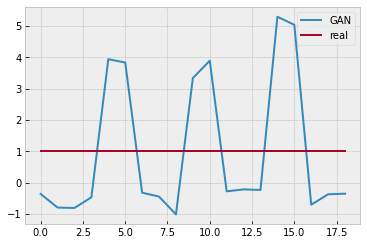

Batch_no: 268500  Epoch: 85


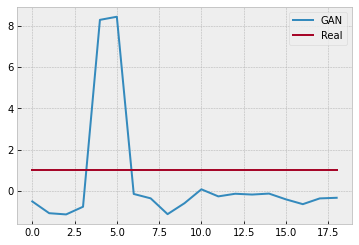

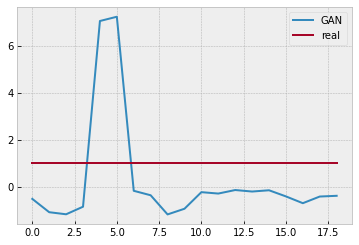

Batch_no: 269000  Epoch: 86


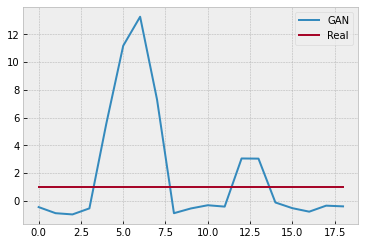

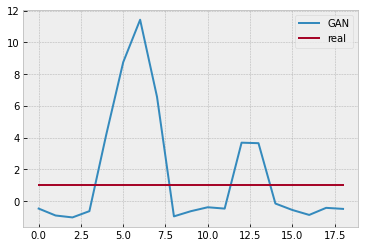

Batch_no: 269500  Epoch: 86


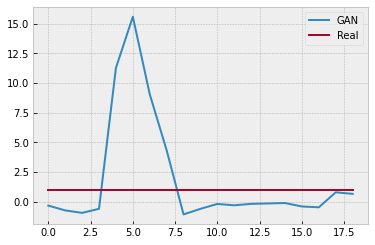

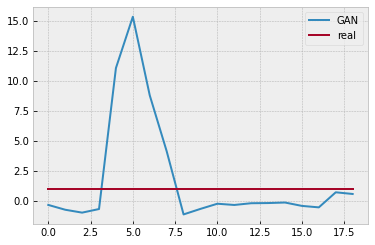

Batch_no: 270000  Epoch: 86


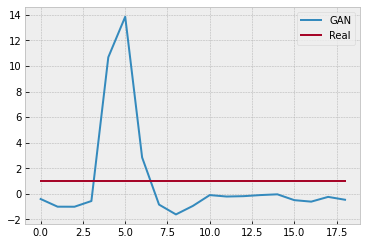

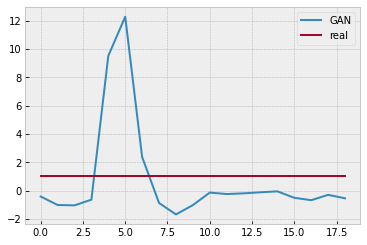

Batch_no: 270500  Epoch: 86


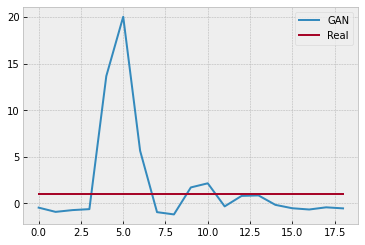

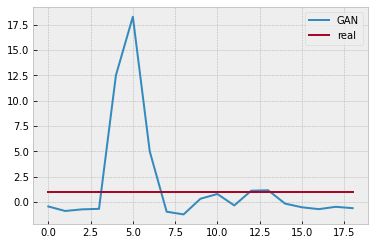

Batch_no: 271000  Epoch: 86


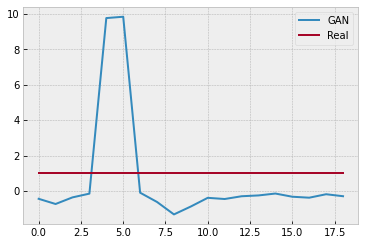

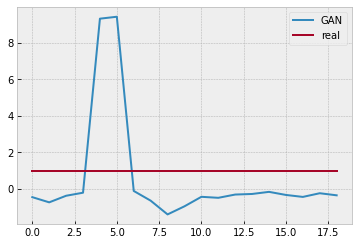

Batch_no: 271500  Epoch: 86


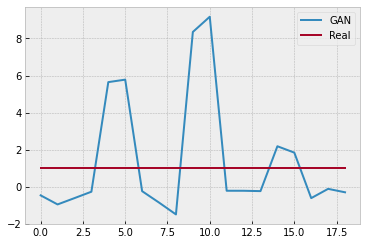

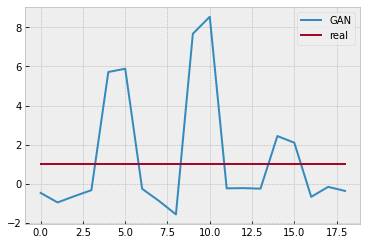

Batch_no: 272000  Epoch: 87


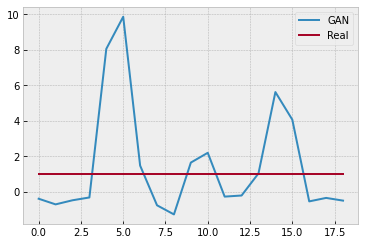

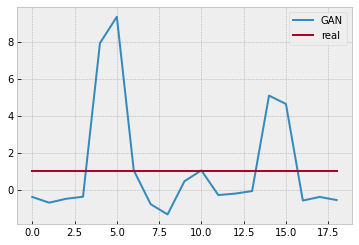

Batch_no: 272500  Epoch: 87


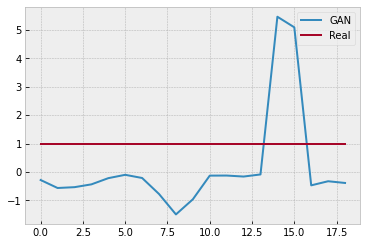

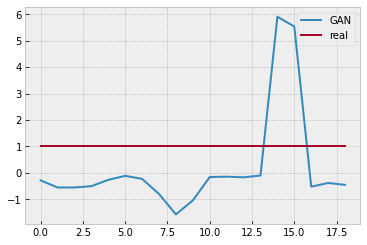

Batch_no: 273000  Epoch: 87


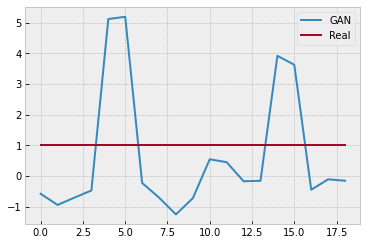

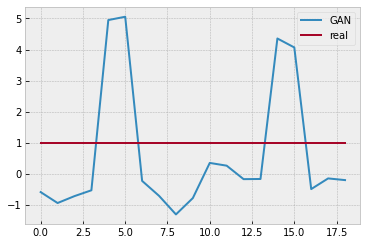

Batch_no: 273500  Epoch: 87


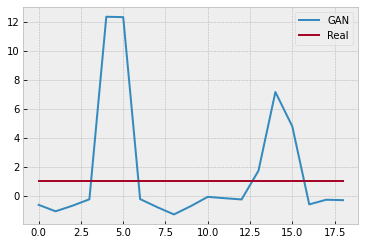

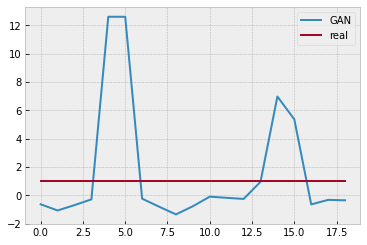

Batch_no: 274000  Epoch: 87


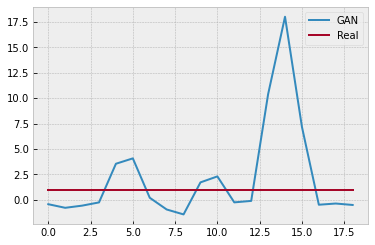

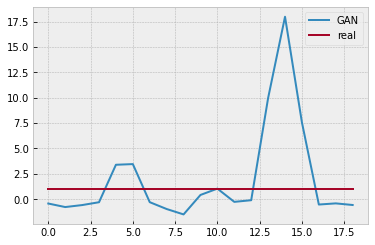

Batch_no: 274500  Epoch: 87


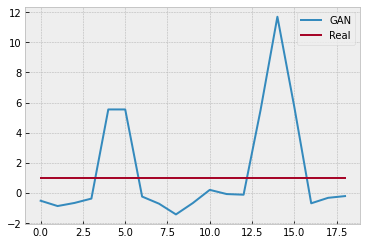

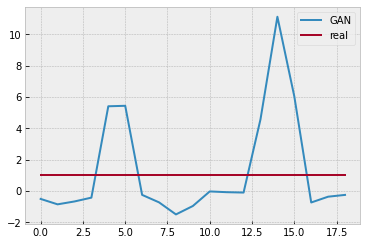

Batch_no: 275000  Epoch: 88


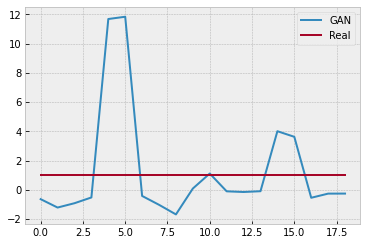

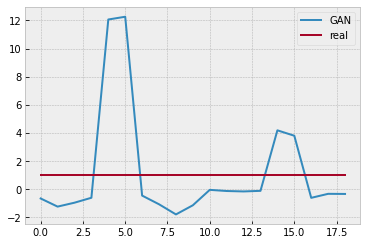

Batch_no: 275500  Epoch: 88


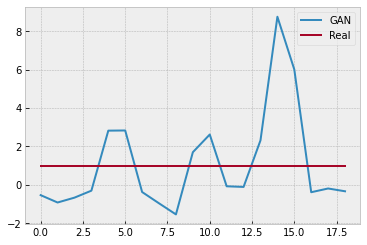

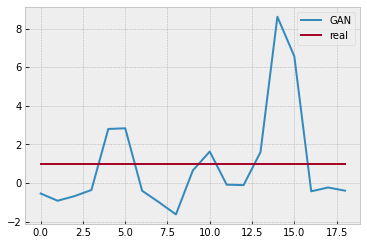

Batch_no: 276000  Epoch: 88


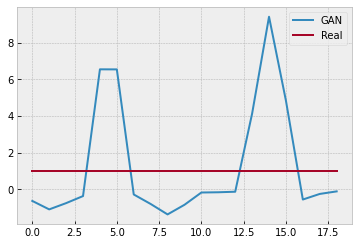

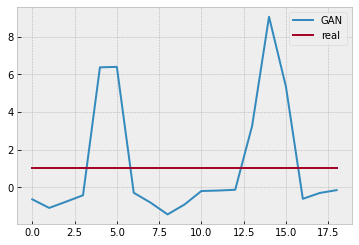

Batch_no: 276500  Epoch: 88


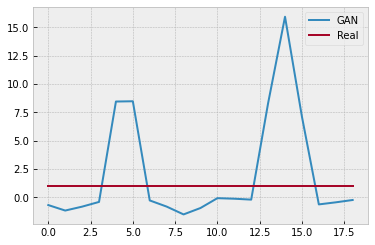

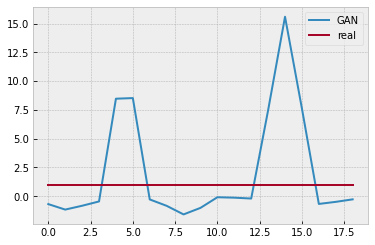

Batch_no: 277000  Epoch: 88


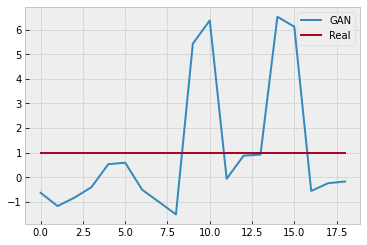

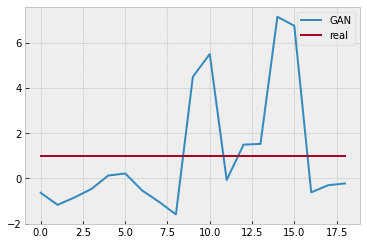

Batch_no: 277500  Epoch: 88


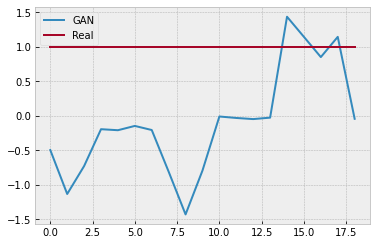

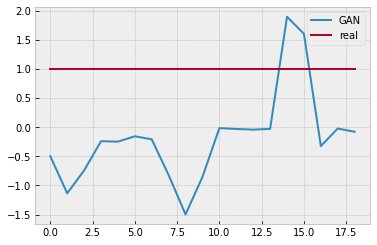

Batch_no: 278000  Epoch: 89


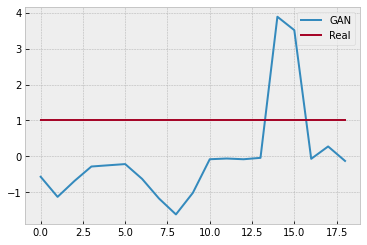

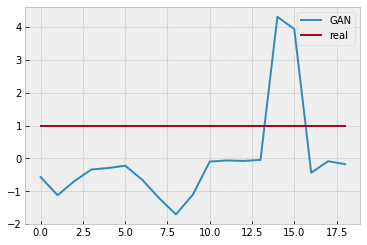

Batch_no: 278500  Epoch: 89


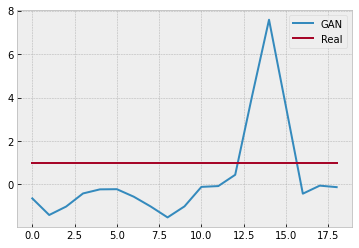

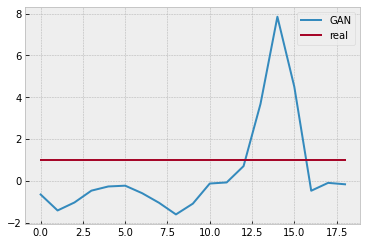

Batch_no: 279000  Epoch: 89


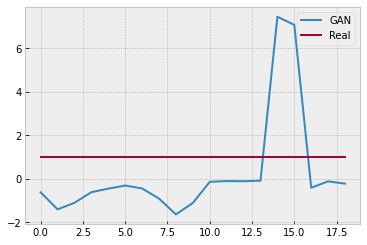

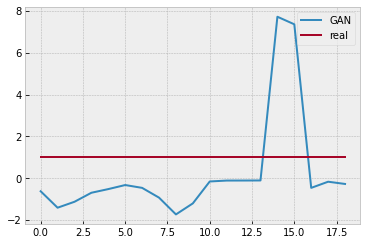

Batch_no: 279500  Epoch: 89


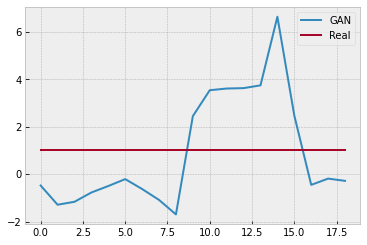

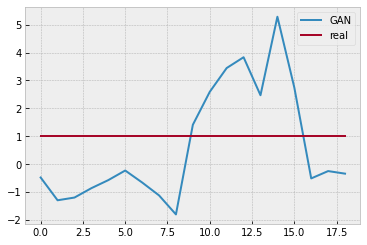

Batch_no: 280000  Epoch: 89


In [ ]:


train_it=DataIterator()
dataloader=DataLoader(dataset=train_it,batch_size=batch_size,shuffle=True)



# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

g_losses=[]
d_losses=[]



for epoch in range(n_epochs):
    g_running_loss=0.0
    d_running_loss=0.0
    for i, (aggregate, appliance) in enumerate(dataloader):

        #reshaping to fit the convolution layer
        aggregate_reshaped=aggregate.reshape(aggregate.shape[0],1,aggregate.shape[1])

        batch_size = appliance.shape[0]
        app=appliance[:,:]

        # Adversarial ground truths
        valid = Variable(FloatTensor(batch_size, 1).fill_(1.0), requires_grad=False)
        fake = Variable(FloatTensor(batch_size, 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_aggregate_reshaped = Variable(aggregate_reshaped.type(FloatTensor))
        real_appliance = Variable(app.type(FloatTensor))
        real_aggregate= Variable(aggregate.type(FloatTensor))

        real_app_real_agg=torch.cat((real_appliance,real_aggregate),1)


        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()


        gen_appliance = generator(real_aggregate_reshaped)




        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)

        validity,feat= discriminator(gen_app_real_agg)

        g_loss=feature_loss(feat, real_app_real_agg)
#         g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()
        g_loss_1=g_loss.item()



########################################################################################################################
# # Generator second training round


        optimizer_G.zero_grad()

        gen_appliance = generator(real_aggregate_reshaped)



#         gen_appliance=gen_appliance-first_gen #subtract




        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)
        validity,feat = discriminator(gen_app_real_agg)
        g_loss = feature_loss(feat, real_app_real_agg)



        g_loss.backward()
        g_loss_2=g_loss.item()

        optimizer_G.step()


        optimizer_G.zero_grad()

        gen_appliance = generator(real_aggregate_reshaped)



        gen_app_real_agg=torch.cat((gen_appliance,real_aggregate),1)

        validity,feat = discriminator(gen_app_real_agg)


        g_loss = feature_loss(feat, real_app_real_agg)

        g_loss.backward()
        optimizer_G.step()

        g_loss_3=g_loss.item()

        g_losses.append((g_loss_1+g_loss_2+g_loss_3)/3)


# ----------
#  Training
# ----------


        # ---------------------
        #  Train Discriminator
        # ---------------------


        optimizer_D.zero_grad()


        real_app_real_agg=torch.cat((appliance,aggregate),1)

        real_app_real_agg=Variable(real_app_real_agg.type(FloatTensor))

        validity_real,_ = discriminator(real_app_real_agg)
        d_real_loss = adversarial_loss(validity_real, valid)

        validity_fake,_ = discriminator(gen_app_real_agg.detach()) #detach
        d_fake_loss = adversarial_loss(validity_fake, fake)

        d_loss = (d_real_loss + d_fake_loss) / 2


        d_loss.backward()
        optimizer_D.step()


        d_losses.append(d_loss.item())

        ## end trining discrimnator

        batches_done = epoch * len(dataloader) + i
        #print("Epoch:",epoch,"Batch:",i,"of:",len(dataloader),"batches done:",batches_done)
        if batches_done % sample_interval == 0:
            print("Batch_no:",batches_done," Epoch:",epoch)
            sample_data(n_row=1, batches_done=batches_done)
plt.plot(d_losses,label="discriminator")
plt.plot(g_losses,label="generator")
plt.legend()
plt.show()



In [ ]:

# plt.figure(figsize=(18.5,10.5))
plt.plot(d_losses,label="discriminator")
plt.legend()
plt.show()

plt.plot(g_losses,label="generator")
plt.legend()
plt.show()


In [ ]:
torch.save(generator,'/home/ec2-user/SageMaker/UKDALEModels/microwave_gen_gan.pk1')
torch.save(discriminator,'/home/ec2-user/SageMaker/UKDALEModels/microwave_dis_gan.pk1')

## Disaggregate

In [ ]:
from math import sqrt
from sklearn.model_selection import train_test_split
def model_test_mae(X_test,Y_test):
    w=sig_len
    step=int(9)
    agg_segments=X_test   
    app_segments=Y_test    

    scale_agg_test.fit(agg_segments)
    scale_app_test.fit(app_segments)


    agg_segments_scaled=scale_agg_test.transform(agg_segments)
    agg_segments_scaled_reshaped=agg_segments_scaled.reshape(agg_segments_scaled.shape[0],1,agg_segments_scaled.shape[1])
    app_segments_scaled=scale_app_test.transform(app_segments)


    samples_from=0
    samples_to=int(len(agg_segments_scaled_reshaped))

    sub_agg_segments=agg_segments_scaled_reshaped[samples_from:samples_to,:]
    sub_app_true=app_segments_scaled[samples_from:samples_to,:]

    #sub_app_true=app_segments[samples_from:samples_to,:]
    gen_out=disaggregate(sub_agg_segments)#tensor generated

    disaggregated_appliance=np.array(gen_out.cpu().detach()) #numpy appliance generated
    disaggregated_appliance_inv=scale_app_test.inverse_transform(disaggregated_appliance)

    # sub_app_true_inv=scale_app.inverse_transform(sub_app_true) #app segments

#     threshold=0
#     disaggregated_appliance_inv[disaggregated_appliance_inv<=threshold] = 0
#     sub_agg_segments[sub_agg_segments<=threshold] = 0


    disaggregation_confidence=confidence(appliance=gen_out,aggregate=sub_agg_segments[:,0,:])
    disaggregation_confidence.shape


    indecis_matrix=np.zeros(sub_app_true.shape)
    indecis_matrix.shape

    d=np.array(disaggregation_confidence.cpu().detach())
    confidence_repeated=np.repeat(d,disaggregated_appliance.shape[1],axis=1)


    k=0
    for i in range(len(indecis_matrix)):
        indecis_matrix[i,:]=np.arange(k,k+w,dtype = 'int')
        k+=step
    indecis_matrix=indecis_matrix.reshape(1,-1).astype("int")
    disaggregated_appliance_flat=disaggregated_appliance_inv.reshape(1,-1)
    real_appliance_flat=app_segments.reshape(1,-1)
    confidence_repeated_flat=confidence_repeated.reshape(1,-1)


    print("segmenting predictions...")

    pred_dict={}
    confidence_dict={}
    real_dict={}

    for j in range(np.max(indecis_matrix)):
        if j % 5000 == 0:
            print(j," of ", np.max(indecis_matrix))
        a=np.where(indecis_matrix==j)[1]
        pred_dict[j]=disaggregated_appliance_flat[0,a]
        confidence_dict[j]=confidence_repeated_flat[0,a]
        real_dict[j]=real_appliance_flat[0,a]

    from scipy import stats
    threshold=0

    pred_clustered=[] 
    true_app_list=[]
    for key in pred_dict.keys():
        p=pred_dict[key]
        conf=confidence_dict[key]
    #     p[p<=threshold]=0  # thresholding
    #     pred_clustered.append(p.mean())

        pred_clustered.append(p[np.argmax(conf)])
    #     pred_clustered.append(np.percentile(pred_dict[key],80))
        tr=real_dict[key]
    #     tr[tr<=threshold]=0

        true_app_list.append(tr[0])
#     from sklearn.metrics import mean_squared_error, zero_one_loss,mean_absolute_error,r2_score  
    pred_clustered=np.array(pred_clustered)
    true_app_list=np.array(true_app_list)
    pts=10

    pred_clustered_train,pred_clustered,true_app_list_train,true_app_list=train_test_split(pred_clustered, true_app_list, test_size=0.2, random_state=100)
    pred_clustered=smooth(pred_clustered,box_pts=pts)
    true_app_list=smooth(true_app_list,box_pts=pts)
    
    mae=get_mae(true_app_list,pred_clustered)
    sae=get_sae(true_app_list,pred_clustered)
    nde=get_nde(true_app_list,pred_clustered)
    
    return mae, sae, nde,pred_clustered,true_app_list
mae,sae,nde,pred_clustered, true_app_list=model_test_mae(X,Y)
print(mae)
print(sae)
print(nde)

In [ ]:


#     shift=0    
#     pred_clustered_shifted=np.zeros(len(pred_clustered))
#     pred_clustered_shifted[shift:len(pred_clustered)]=pred_clustered[0:len(pred_clustered)-shift]
#     # pred_clustered_shifted=pred_clustered_shifted-np.ones(pred_clustered_shifted.shape)*500
#     # pred_clustered_shifted[pred_clustered_shifted <=0] = 0


#     predictions=np.asarray(pred_clustered_shifted)[0:int(len(pred_clustered_shifted))]
#     appliance_true=np.asarray(Y_true[0:int(len(pred_clustered_shifted))])


#     predictions_smoothed=smooth(predictions,box_pts=10)
#     appliance_true_smoothed=smooth(appliance_true[:,0],box_pts=10)

#     print("+++++++++++++++++++")
#     print(str(g_retrain))
#     print("Smoothed..")
#     recall2,precision2,F12,accuracy2=classification_metrics(predictions_smoothed,appliance_true_smoothed,thresh=50)
#     print("recall= %f, precision= %f, F1= %f, accuracy= %f" %(recall2,precision2,F12,accuracy2))

#     RE2,MAE2=energy_metrics(predictions_smoothed,appliance_true_smoothed,thresh=50)
#     print("RE=%f, MAE= %f"%(RE2,MAE2))

#     performance1[str(g_retrain)]=[F12,MAE2,RE2]

#     print("=============================================================")


#     with open('perf_On_UKDALE_WM_data_amount.txt', 'a') as f:
#         f.write(str(g_retrain))
#         f.write(str(d_retrain))
#         f.write(portion)
#         f.write("   F1:")
#         f.write(str([F12]))
#         f.write("\n\n")
#     f.close()
#     portion=int(portion+15*35)

